# Project Topic: Credit Card Customer Churn Prediction 

## Data Source

https://www.kaggle.com/sakshigoyal7/credit-card-customers?select=BankChurners.csv

# Introduction

### Customer Churn Definition

Customer churn is the phenomenon where customers of a business no longer purchase goods and services or interact with the business. It is the loss the existing customers of the credit card company when the customers close their account and stop using their credit card. 

Customer churn rate is the mathematical calculation of the percentage of customers who are not likely to make another purchase from a business.

## Executive Summary

### Background
Acquiring a new customer can cost the credit card company five times more than retaining an existing customer. Also, losing a profitable long-term customer will decrease its customer base and lower its market share of the company. Thus, it will eventually lower its appeal so that it will be hard for the credit card company to cooperate with shops for promotion and hence it will be hard to attract new customers. 

Therefore, with a view to assist the credit card company to lower the the credit card churn rate and lower the cost of operation and to retain existing customer to enable long-term customer relationship and to be a sustainable business, let's have in-depth examination into the topic of credit card customer churn prediction.


### Project Goal
Predicting for the credit card company that a certain customer is at a very high risk of churning so that they can proactively go to the customer to provide them better product and service experience for retention.

## About The Dataset

The dataset consists of 10,127 customers that are existing or attrited. The dataset shows we have 1627 attrited customers out of 10,127 total of customers. This dataset is strongly unbalanced with only 16.07% of customers who have churned. Thus, the unbalanced target variable will be an obstacle  to train our model in order to predict churning customers.

## Import Library And Package

In [1]:
from sklearn.pipeline import Pipeline
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
import matplotlib as mpl
import pandas as pd
import seaborn as sns

import numpy as np
from scipy import stats 
import matplotlib.pyplot as plt
from matplotlib import pyplot
from scipy.stats import norm
sns.set(font_scale=1.5)
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split, KFold,RandomizedSearchCV
from sklearn.metrics import roc_curve, recall_score
import sklearn.metrics as metrics
%config InlineBackend.figure_format = 'retina'
%matplotlib inline


# Undersampling & Oversampling
from imblearn.under_sampling import NearMiss
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline, make_pipeline


# Clustering
import scipy.cluster.hierarchy as shc
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# Classifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier


# Cross Validation
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score, confusion_matrix,classification_report
from sklearn.model_selection import GridSearchCV, cross_val_score


# Learning Curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

# Hide the warnings
import warnings
warnings.filterwarnings('ignore')
pd.get_option("display.max_columns")
pd.options.display.max_columns = None
pd.options.display.max_rows = None

# Print in a well-formatted structure
import pprint
pp = pprint.PrettyPrinter(indent=4)

/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


## Load The Data

---

Import the CSV into a pandas DataFrame and do an initial examination of its data columns.

In [2]:
df = pd.read_csv('/Users/leelonghei/Desktop/Capstone_project/BankChurners.csv')
df.head()

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
0,768805383,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,0.000093,0.99991
1,818770008,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,0.000057,0.99994
2,713982108,Existing Customer,51,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000,0.000021,0.99998
3,769911858,Existing Customer,40,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760,0.000134,0.99987
4,709106358,Existing Customer,40,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000,0.000022,0.99998


In [3]:
# Look at the information regarding its columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 23 columns):
 #   Column                                                                                                                              Non-Null Count  Dtype  
---  ------                                                                                                                              --------------  -----  
 0   CLIENTNUM                                                                                                                           10127 non-null  int64  
 1   Attrition_Flag                                                                                                                      10127 non-null  object 
 2   Customer_Age                                                                                                                        10127 non-null  int64  
 3   Gender                                                                           

In [4]:
# To discover descriptive statistic of the numeric columns
df.describe(include='all')

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1,Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2
count,1.012700e+04,10127,10127.000000,10127,10127.000000,10127,10127,10127,10127,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000,10127.000000
unique,NaN,2,NaN,2,NaN,7,4,6,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,Existing Customer,NaN,F,NaN,Graduate,Married,Less than $40K,Blue,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,8500,NaN,5358,NaN,3128,4687,3561,9436,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,7.391776e+08,NaN,46.325960,NaN,2.346203,NaN,NaN,NaN,NaN,35.928409,3.812580,2.341167,2.455317,8631.953698,1162.814061,7469.139637,0.759941,4404.086304,64.858695,0.712222,0.274894,0.159997,0.840003
std,3.690378e+07,NaN,8.016814,NaN,1.298908,NaN,NaN,NaN,NaN,7.986416,1.554408,1.010622,1.106225,9088.776650,814.987335,9090.685324,0.219207,3397.129254,23.472570,0.238086,0.275691,0.365301,0.365301
min,7.080821e+08,NaN,26.000000,NaN,0.000000,NaN,NaN,NaN,NaN,13.000000,1.000000,0.000000,0.000000,1438.300000,0.000000,3.000000,0.000000,510.000000,10.000000,0.000000,0.000000,0.000008,0.000420
25%,7.130368e+08,NaN,41.000000,NaN,1.000000,NaN,NaN,NaN,NaN,31.000000,3.000000,2.000000,2.000000,2555.000000,359.000000,1324.500000,0.631000,2155.500000,45.000000,0.582000,0.023000,0.000099,0.999660
50%,7.179264e+08,NaN,46.000000,NaN,2.000000,NaN,NaN,NaN,NaN,36.000000,4.000000,2.000000,2.000000,4549.000000,1276.000000,3474.000000,0.736000,3899.000000,67.000000,0.702000,0.176000,0.000181,0.999820
75%,7.731435e+08,NaN,52.000000,NaN,3.000000,NaN,NaN,NaN,NaN,40.000000,5.000000,3.000000,3.000000,11067.500000,1784.000000,9859.000000,0.859000,4741.000000,81.000000,0.818000,0.503000,0.000337,0.999900


In [5]:
# To check the number of rows and columns
print('Data Shape:', df.shape)

# To check if there is any duplicate data 
print('Number of Duplicates:', len(df[df.duplicated()]))

# To check if there is any missing values
print('Number of Missing Values:', df.isnull().sum().sum())

# To check the column names
print(f"\nColumn Names:\n{df.columns}")

Data Shape: (10127, 23)
Number of Duplicates: 0
Number of Missing Values: 0

Column Names:
Index(['CLIENTNUM', 'Attrition_Flag', 'Customer_Age', 'Gender',
       'Dependent_count', 'Education_Level', 'Marital_Status',
       'Income_Category', 'Card_Category', 'Months_on_book',
       'Total_Relationship_Count', 'Months_Inactive_12_mon',
       'Contacts_Count_12_mon', 'Credit_Limit', 'Total_Revolving_Bal',
       'Avg_Open_To_Buy', 'Total_Amt_Chng_Q4_Q1', 'Total_Trans_Amt',
       'Total_Trans_Ct', 'Total_Ct_Chng_Q4_Q1', 'Avg_Utilization_Ratio',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_1',
       'Naive_Bayes_Classifier_Attrition_Flag_Card_Category_Contacts_Count_12_mon_Dependent_count_Education_Level_Months_Inactive_12_mon_2'],
      dtype='object')


---
There is no missing values and duplicates. 

In [6]:
# To check if there is any unknown values
print(f"\nUnknown Values :\n{df.apply(lambda x: sum(x=='Unknown') / len(df))}")


Unknown Values %:
CLIENTNUM                                                                                                                             0.000000
Attrition_Flag                                                                                                                        0.000000
Customer_Age                                                                                                                          0.000000
Gender                                                                                                                                0.000000
Dependent_count                                                                                                                       0.000000
Education_Level                                                                                                                       0.149995
Marital_Status                                                                                                             

---
For column of Education_Level, Marital_Status & Income_Category, there are some unknown values.         

## Drop Unwanted Columns

---
The last 2 columns are suggested to be removed by the author. The first column is dropped as it is the unique client number which has no feature importance.

In [7]:
df = df[df.columns[:-2]]
df.drop('CLIENTNUM', axis=1, inplace=True)
df.head(2)

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105


In [8]:
# To check if the columns are dropped
df.shape

(10127, 20)

# Standardise The Column Name
---
To rename the column name with industry jargon for easy understanding by using a dictionary substitution as the changes will apply to a few columns only.

In [9]:
new_columns_dict = {
    'Attrition_Flag': 'Customer_Churn',
    'Customer_Age': 'Age',
    'Dependent_count': 'Dependent_Count',
    'Education_Level': 'Education',
    'Income_Category': 'Income',
    'Months_on_book': 'Months_Subscribed',
    'Total_Relationship_Count': 'Total_Products_Count',
    'Months_Inactive_12_mon': 'Inactive_Months',
    'Contacts_Count_12_mon': 'Contacts_Count',
    'Total_Revolving_Bal': 'CC_Unpaid_Balance',
    'Avg_Open_To_Buy': 'Avg_Loan'
}

df.rename(columns=new_columns_dict, inplace=True)

In [10]:
# To check if the column names are changed
df.head(2)

,Customer_Churn,Age,Gender,Dependent_Count,Education,Marital_Status,Income,Card_Category,Months_Subscribed,Total_Products_Count,Inactive_Months,Contacts_Count,Credit_Limit,CC_Unpaid_Balance,Avg_Loan,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105


## About The Columns
---

1. **Customer_Churn (Target Variable)**: Closed account=1, existing account=0
2. **Age**: Customer's age in years
3. **Gender**: M=Male, F=Female
4. **Dependent_Count**: No. of dependents
5. **Education**: Educational qualification of the account holder
6. **Marital_Status**: Married, Single, Divorced & Unknown	
7. **Income**: Annual income category of the account holder 
8. **Card_Category**: Type of card (Blue, Silver, Gold & Platinum)	
9. **Months_Subscribed**: Period of relationship with bank	
10. **Total_Products_Count**: Total no. of products held by the customer	
11. **Inactive_Months**: No. of months inactive in the last 12 months	
12. **Contacts_Count**: No. of contacts in the last 12 months
13. **Credit_Limit**: Credit limit on the credit card	
14. **CC_Unpaid_Balance**: Total revolving balance on the credit card	
15. **Avg_Loan**: Open to Buy credit line (Average of last 12 months)	
16. **Total_Amt_Chng_Q4_Q1**: Change in transaction amount (Q4 over Q1)	
17. **Total_Trans_Amt**: Total transaction amount (Last 12 months)	
18. **Total_Trans_Ct**: Total transaction count (Last 12 months)
19. **Total_Ct_Chng_Q4_Q1**: change in transaction count (Q4 over Q1)	
20. **Avg_Utilization_Ratio**: Average card utilization ratio

In [11]:
# To check the number of unique value for each column
for col in df:
    print(col, df[col].nunique())

Customer_Churn 2
Age 45
Gender 2
Dependent_Count 6
Education 7
Marital_Status 4
Income 6
Card_Category 4
Months_Subscribed 44
Total_Products_Count 6
Inactive_Months 7
Contacts_Count 7
Credit_Limit 6205
CC_Unpaid_Balance 1974
Avg_Loan 6813
Total_Amt_Chng_Q4_Q1 1158
Total_Trans_Amt 5033
Total_Trans_Ct 126
Total_Ct_Chng_Q4_Q1 830
Avg_Utilization_Ratio 964


In [12]:
# To check the unique value for each column
for col in df:
    print(col, df[col].unique())

Customer_Churn ['Existing Customer' 'Attrited Customer']
Age [45 49 51 40 44 32 37 48 42 65 56 35 57 41 61 47 62 54 59 63 53 58 55 66
 50 38 46 52 39 43 64 68 67 60 73 70 36 34 33 26 31 29 30 28 27]
Gender ['M' 'F']
Dependent_Count [3 5 4 2 0 1]
Education ['High School' 'Graduate' 'Uneducated' 'Unknown' 'College' 'Post-Graduate'
 'Doctorate']
Marital_Status ['Married' 'Single' 'Unknown' 'Divorced']
Income ['$60K - $80K' 'Less than $40K' '$80K - $120K' '$40K - $60K' '$120K +'
 'Unknown']
Card_Category ['Blue' 'Gold' 'Silver' 'Platinum']
Months_Subscribed [39 44 36 34 21 46 27 31 54 30 48 37 56 42 49 33 28 38 41 43 45 52 40 50
 35 47 32 20 29 25 53 24 55 23 22 26 13 51 19 15 17 18 16 14]
Total_Products_Count [5 6 4 3 2 1]
Inactive_Months [1 4 2 3 6 0 5]
Contacts_Count [3 2 0 1 4 5 6]
Credit_Limit [12691.  8256.  3418. ...  5409.  5281. 10388.]
CC_Unpaid_Balance [ 777  864    0 ...  534  476 2241]
Avg_Loan [11914.  7392.  3418. ... 11831.  5409.  8427.]
Total_Amt_Chng_Q4_Q1 [1.335 1.541 2

# Exploratory Data Analysis
---

### About The Unknown Values:   Education_Level, Marital_Status & Income_Category column

As the percentage of the unknown value for Education_Level is ~15%, for Marital_Status is ~7% and Income_Category column is ~11% which is relatively low. Thus, I decided to drop them in the data preprocessing stage.

### Visualizing The Entire Dataset

Using a  pairs plot allows us to see both distribution of single variables and relationships between two independent variables.

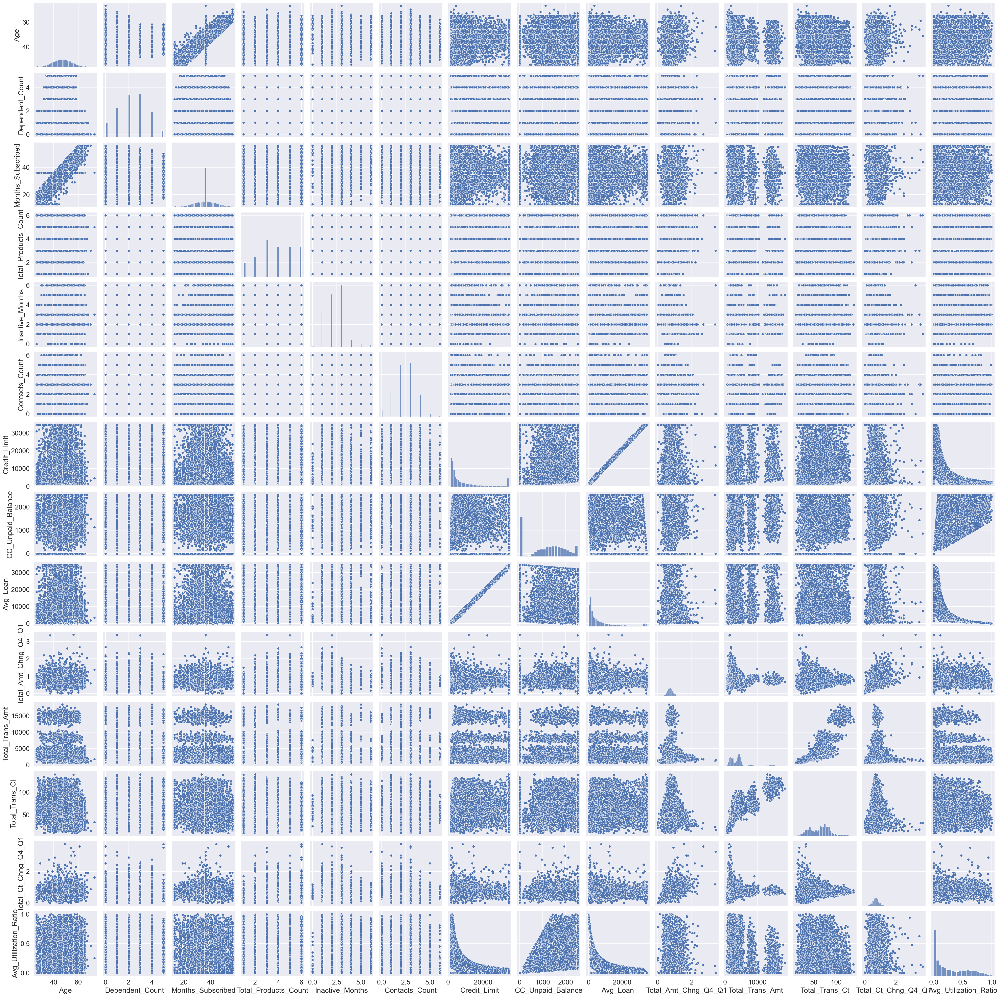

In [13]:
sns.pairplot(df);

From the above pairplot, it shows there is a perfectly positive linear correlation bewteen the independent features which are Avg_Loan and Credit_Limit column, thus I will drop one of the column to ensure a better model performance.

For the column of Months_Subscribed and Age, it shows that there is a positive linear correlation bewteen them. It makes sense that when a customer is older, its duration for credit card service subscription is longer.

### Imbalanced Data Of The Target Variable : Attrited Customer & Existing Customer

In [14]:
# To check the number of Churned Customers
df.Customer_Churn.value_counts()

Existing Customer    8500
Attrited Customer    1627
Name: Customer_Churn, dtype: int64

Existing Customer: 83.93
Attrited Customer: 16.07


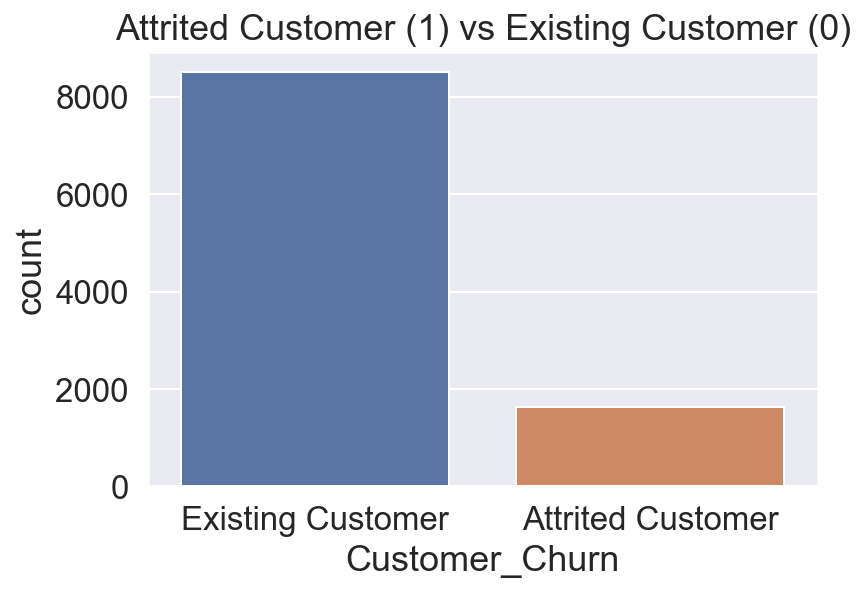

In [15]:
# To show the proportion of the current Customer status and visualise it
Customer_Churn_cnt = df.Customer_Churn.value_counts()
print(f'Existing Customer: {round(Customer_Churn_cnt[0] / sum(Customer_Churn_cnt) * 100, 2)}')
print(f'Attrited Customer: {round(Customer_Churn_cnt[1] / sum(Customer_Churn_cnt) * 100, 2)}')
sns.countplot('Customer_Churn', data = df)
plt.title('Attrited Customer (1) vs Existing Customer (0)');

From the plot above, it shows the proportion of attrited and existing customer for Customer_Churn column is seriously imbalanced. Thus, I decided to use SMOTE and NearMiss method to deal with it.

### Exploring Categorical Features:

#### Visualising the categorical features individually

In [16]:
def plot_design():
    plt.xlabel('')
    plt.ylabel('')
    plt.yticks(fontsize=13, color='black')
    plt.box(False)
    plt.title(i[1], fontsize=20, color='black')
    plt.tight_layout(pad=5.0)
    plt.grid(b=None)

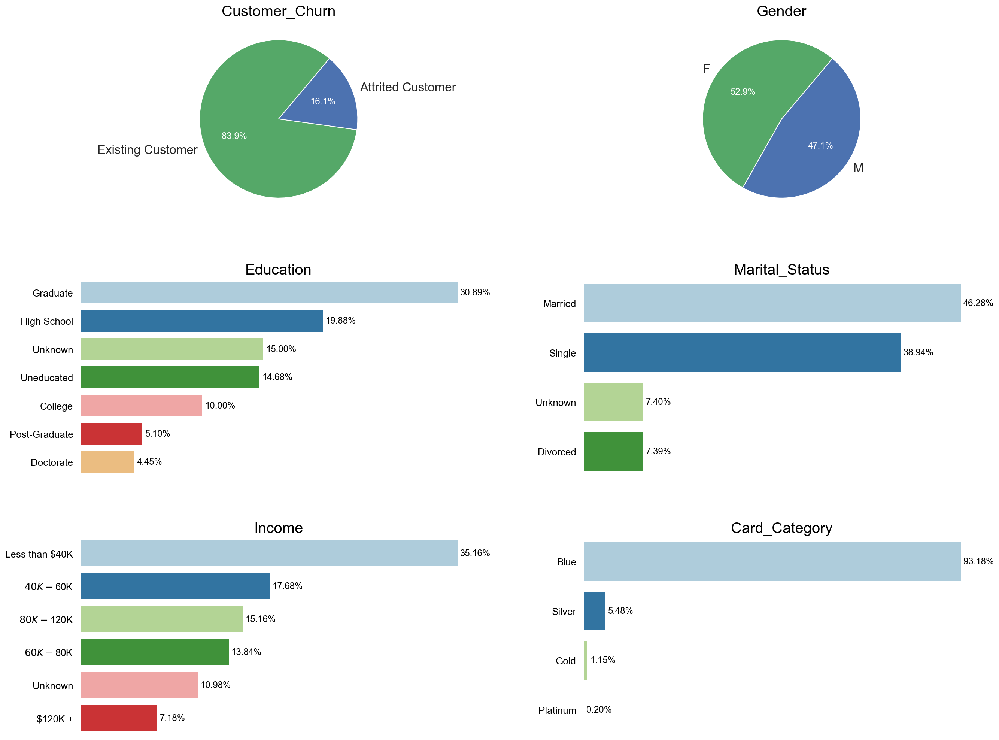

In [17]:
# Selecting categorical variables
categ = df.select_dtypes(include=object).columns

# Visualization
fig, ax = plt.subplots(figsize =(20, 20))
fig.patch.set_facecolor('white')
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.size'] = 12

colors = sns.color_palette("Paired").as_hex()

# Using for loop to create plot for each column
for i in (enumerate(categ)):
    plt.subplot(4, 2, i[0]+1)
    
    if df[i[1]].value_counts().count() > 2:
        ax = sns.countplot(y = i[1], data = df, order=df[i[1]].value_counts().index, palette=colors)
        pct = df[i[1]].value_counts(ascending=False, normalize=True).values * 100
        ax.bar_label(container=ax.containers[0], labels=list(map('{:.2f}%'.format,pct)), padding=3, size=12, color='black')
        ax.grid(False)
        ax.grid(b=None)
        ax.xaxis.set_ticks_position('none')
        ax.yaxis.set_ticks_position('none')
        ax.set_xticklabels('')
        plot_design()

    else:
        _, texts, pcts = plt.pie(
            df[i[1]].value_counts(), 
            labels=df[i[1]].value_counts().index, 
            colors= ['g', 'b'],
            autopct='%1.1f%%', 
            wedgeprops={'linewidth': 1.0, 'edgecolor': 'white'},
            startangle=50)
        for pcts in pcts:
            pcts.set_color('white')
            plt.title(i[1], fontsize=20, color='black')

For Card_Category, I am surprised that almost all customers belong to the lowest tier of the card which is Blue with 93.18%. It is expected that while the tier of card category increase, the customer churn rate would decrease as customers do not tend to give up a higher tier card when it is not easy to get one.

### Categorizing Columns With Continous Variables: 

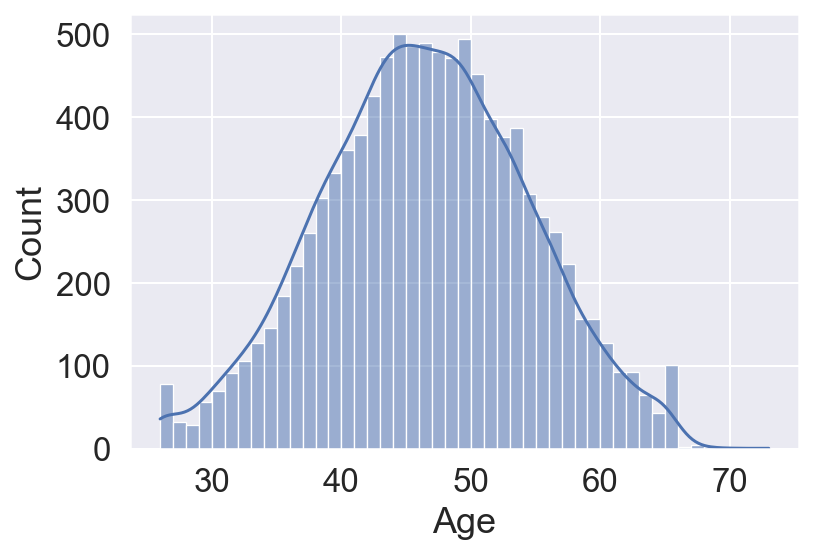

In [18]:
# To check the distribution of Age column
sns.histplot(df.Age,kde=True);

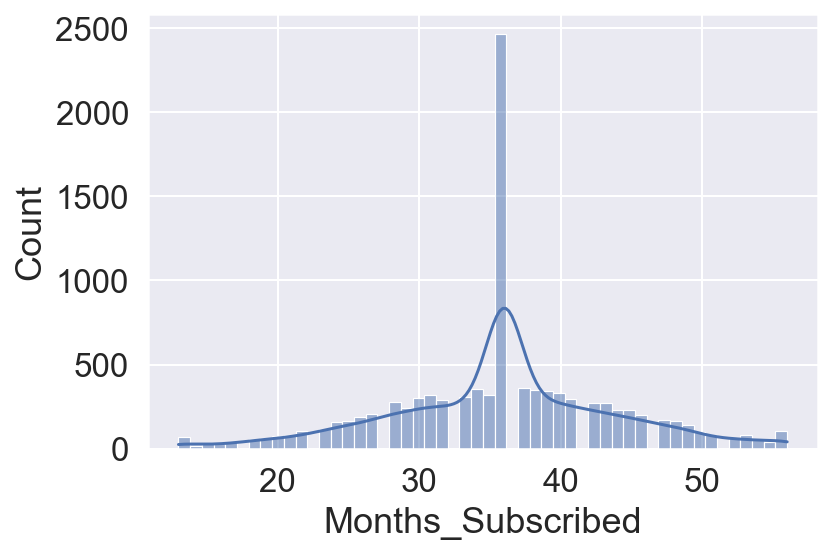

In [19]:
# To check the distribution of Months_Subscribed column
sns.histplot(df.Months_Subscribed ,kde=True);

For Age column, it shows the distribution of customer age in our dataset follows a moderately normal distribution. For Months_Subscribed column, it shows the majority customers subscribed the credit card service for 30 to 40 months. It is assumed there was a promotional campaign for attracting new customers to join the credit card service 36 months ago. Thus, it shows that the campaign is very successful as it is reflected by the data.

Yet, this two columns are continous variables with different numbers and it will cause a problem for fitting in a machine learning model. Thus, I decided to categorize them before dummification.

#### Age column

In [20]:
# To check the minimum and maximum customer age 
min_age = df.Age.min()
max_age = df.Age.max()
print('minimum age is :', min_age)
print('maximum age is :', max_age)

minimum age is : 26
maximum age is : 73


Standard Deviation of Age: 8.016814032549028


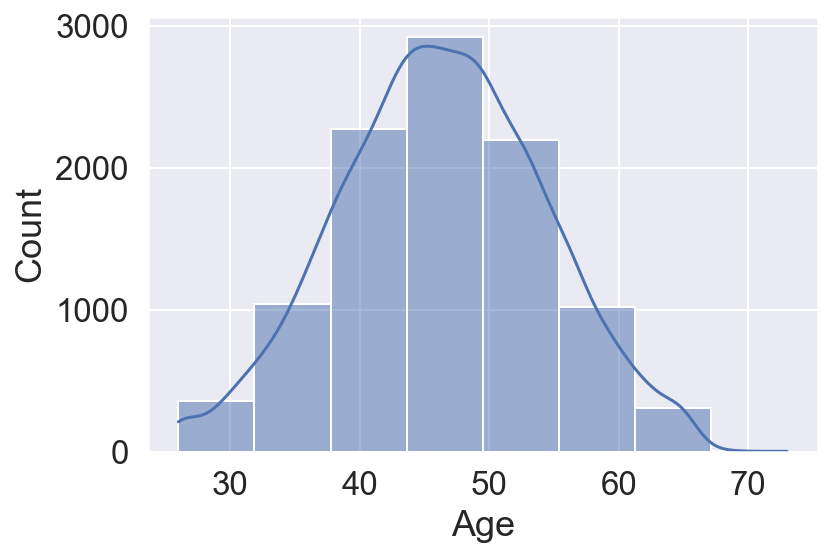

In [21]:
# To check the standard deviation of the customer age 
print(f'Standard Deviation of Age: {df.Age.std()}')
sns.histplot(df.Age ,kde=True, bins=int(df.Age.std()));

When I apply the standard deviation of 8 as the number of bins, it shows a histgram with a normal distribution. It means the standard deviation of 8 will be a good split for different age groups. 

Thus, I will split the age group into 8 groups (i.e. Age group of 26 - 32, 33 - 38, 39 - 44, 45 - 50, 51 - 55, 56 - 61, 62 - 67, 68 - 73).

In [22]:
labels = ['26-32','33-38', '39-44', '45-50', '51-55', '56-61', '62-67', '68-73']

# To create a new column for the age group
df['Age_Group'] = pd.cut(df.Age, bins=8, labels=labels)

# To delete the original Age column
df.drop(columns = ['Age'], inplace = True)

# To check if the Age column is divided into 8 groups and the original Age column is dropped
df.head(2)

,Customer_Churn,Gender,Dependent_Count,Education,Marital_Status,Income,Card_Category,Months_Subscribed,Total_Products_Count,Inactive_Months,Contacts_Count,Credit_Limit,CC_Unpaid_Balance,Avg_Loan,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age_Group
0,Existing Customer,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,45-50
1,Existing Customer,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,45-50


#### Months_Subscribed column

In [23]:
# To check the minimum and maximum months subscribed
min_month_sub = df.Months_Subscribed.min()
max_month_sub = df.Months_Subscribed.max()
print('minimum months is :', min_month_sub)
print('maximum months is :', max_month_sub)

minimum months is : 13
maximum months is : 56


Standard Deviation of Months Subscribed: 7.986416330872062


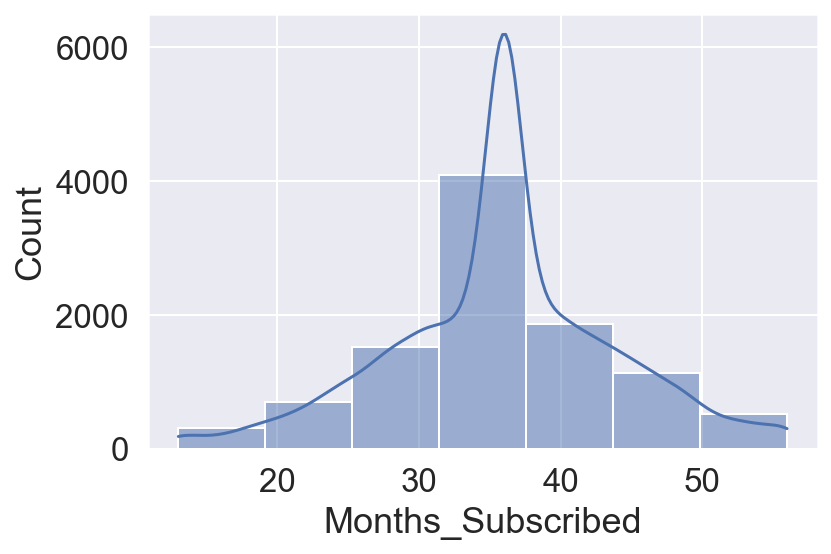

In [24]:
# To check the standard deviation of the months subscribed
print(f'Standard Deviation of Months Subscribed: {df.Months_Subscribed.std()}')
sns.histplot(df.Months_Subscribed ,kde=True, bins=int(df.Months_Subscribed.std()));

When I apply the standard deviation of 8 as the number of bins, it shows a histgram with a normal distribution. It means the standard deviation of 8 will be a good split for different months subscribed groups. 

Thus, I will split the months subscribed group into 8 groups (i.e. months subscribed group of 13 - 18, 19 - 23, 24 - 29, 30 - 34, 35 - 39, 40 - 45, 46 - 50, 51 - 56).

In [25]:
labels = ['13-18', '19-23', '24-29', '30-34', '35-39', '40-45', '46-50', '51-56']

# To create a new column for the Months_Subscribed group
df['Months_Subscribed_Group'] = pd.cut(df.Months_Subscribed, bins=8, labels=labels)

# To delete the original Months_Subscribed column
df.drop(columns = ['Months_Subscribed'], inplace = True)
        
# To check if the Months_Subscribed column is divided into 8 groups and the original Months_Subscribed column is dropped
df.head(2)

,Customer_Churn,Gender,Dependent_Count,Education,Marital_Status,Income,Card_Category,Total_Products_Count,Inactive_Months,Contacts_Count,Credit_Limit,CC_Unpaid_Balance,Avg_Loan,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Age_Group,Months_Subscribed_Group
0,Existing Customer,M,3,High School,Married,$60K - $80K,Blue,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061,45-50,35-39
1,Existing Customer,F,5,Graduate,Single,Less than $40K,Blue,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105,45-50,40-45


#### Visualising the categorical features with the target variables (Customer_Churn)

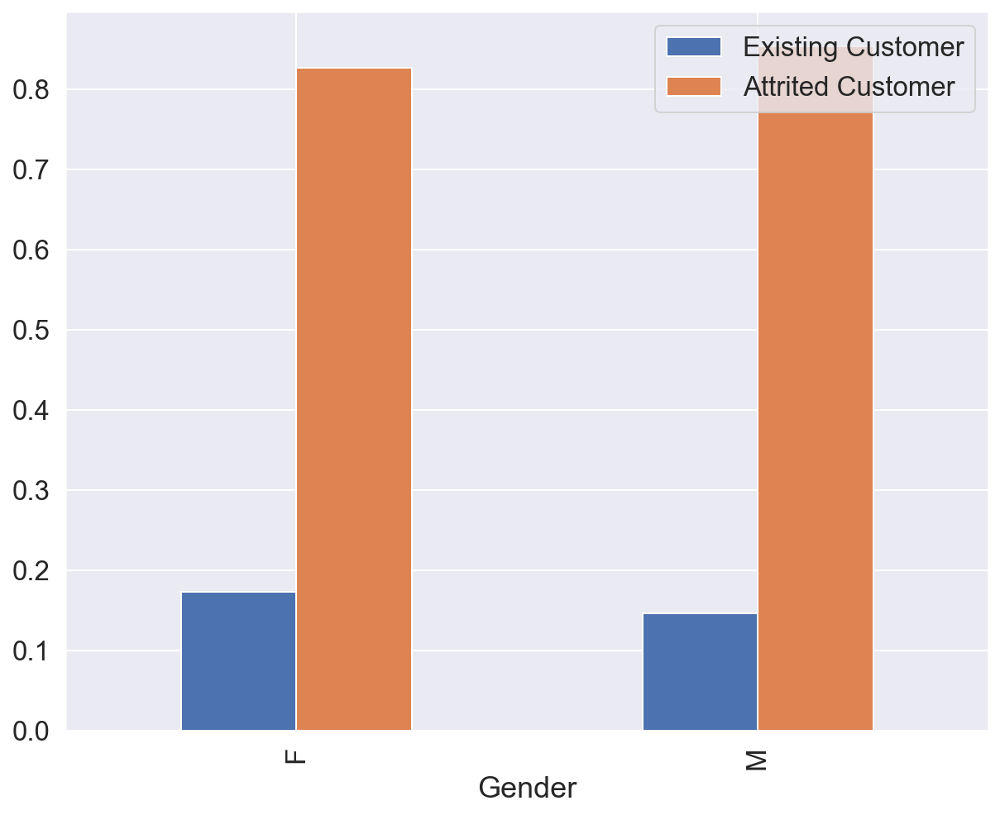

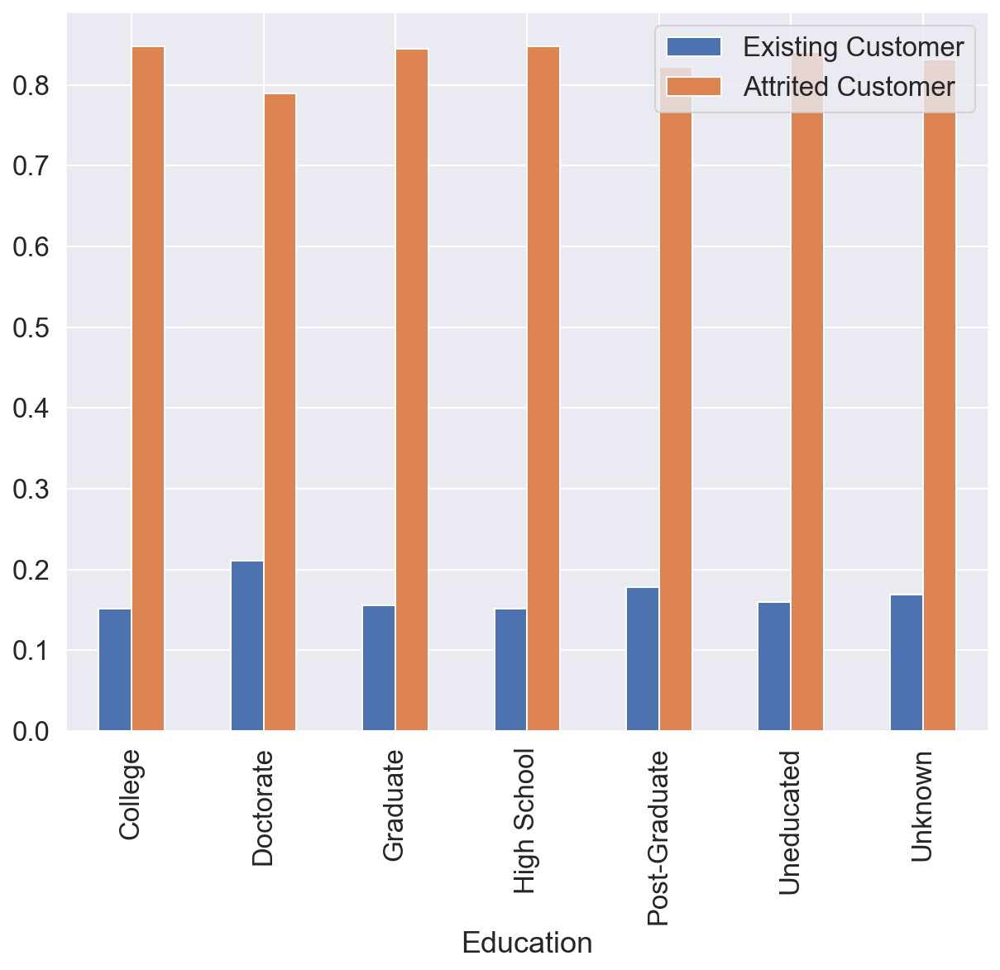

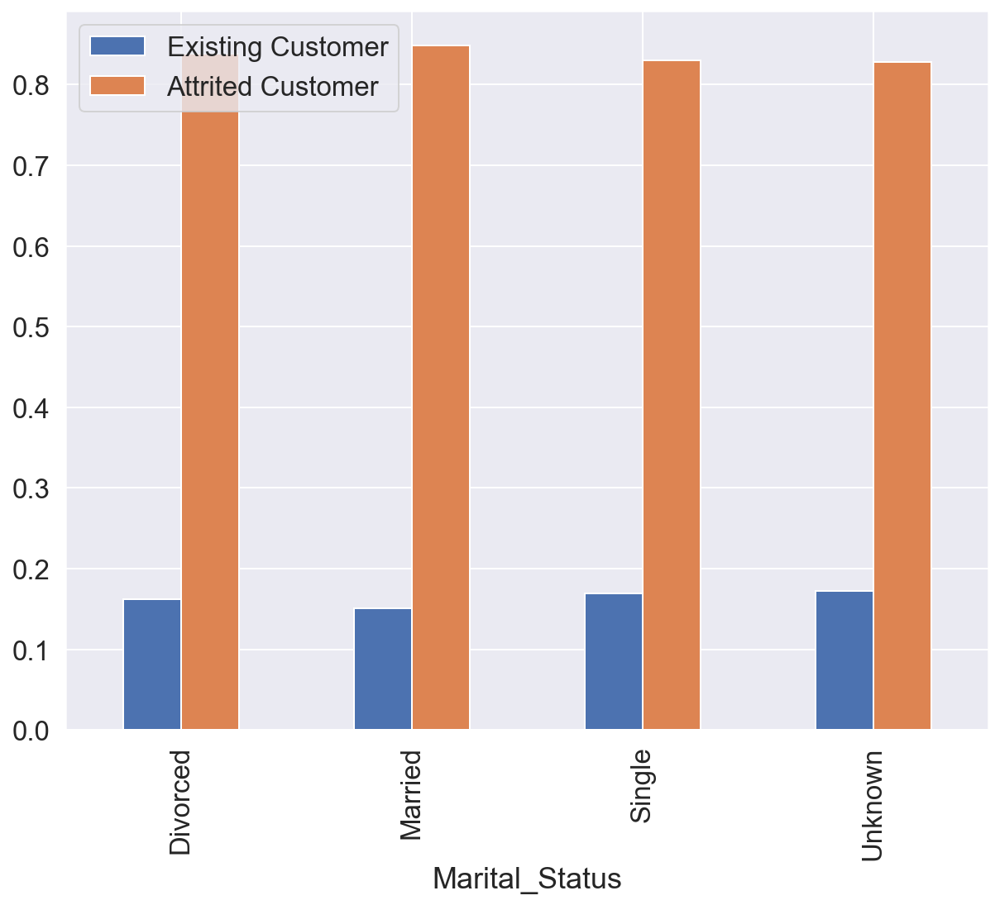

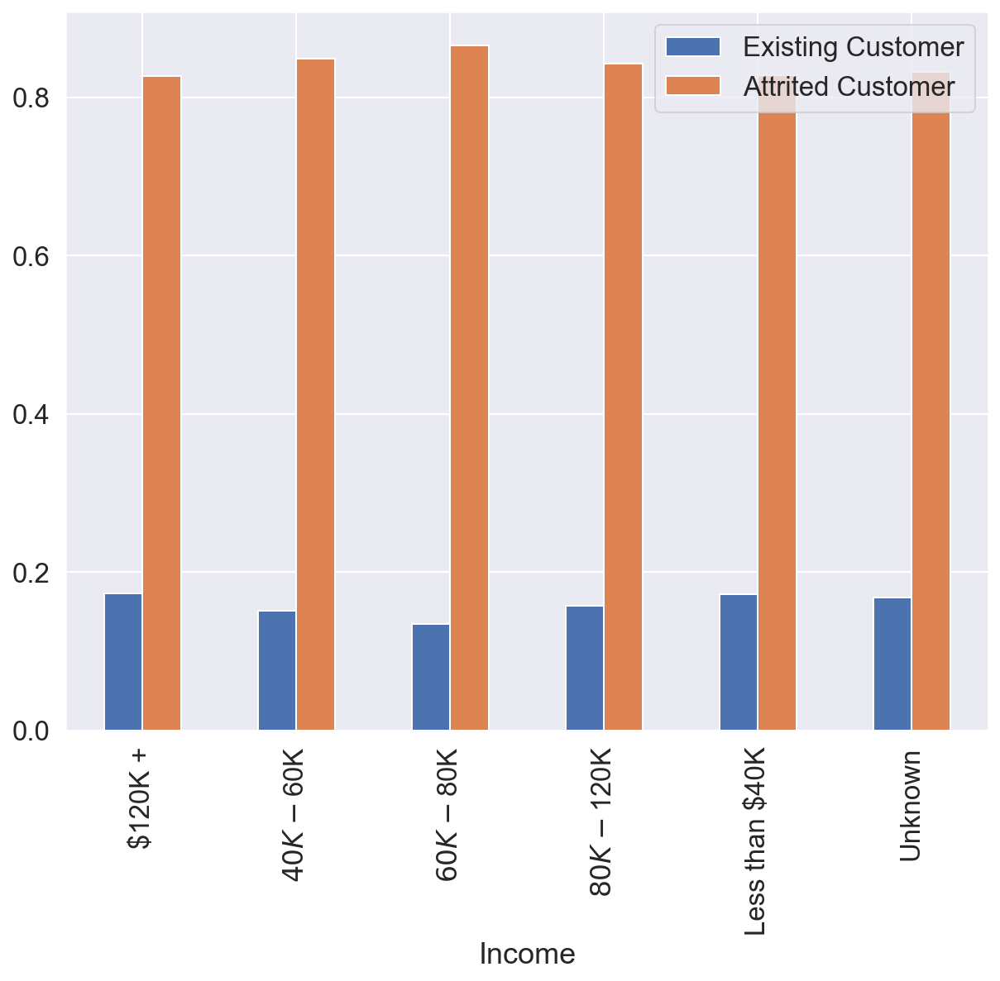

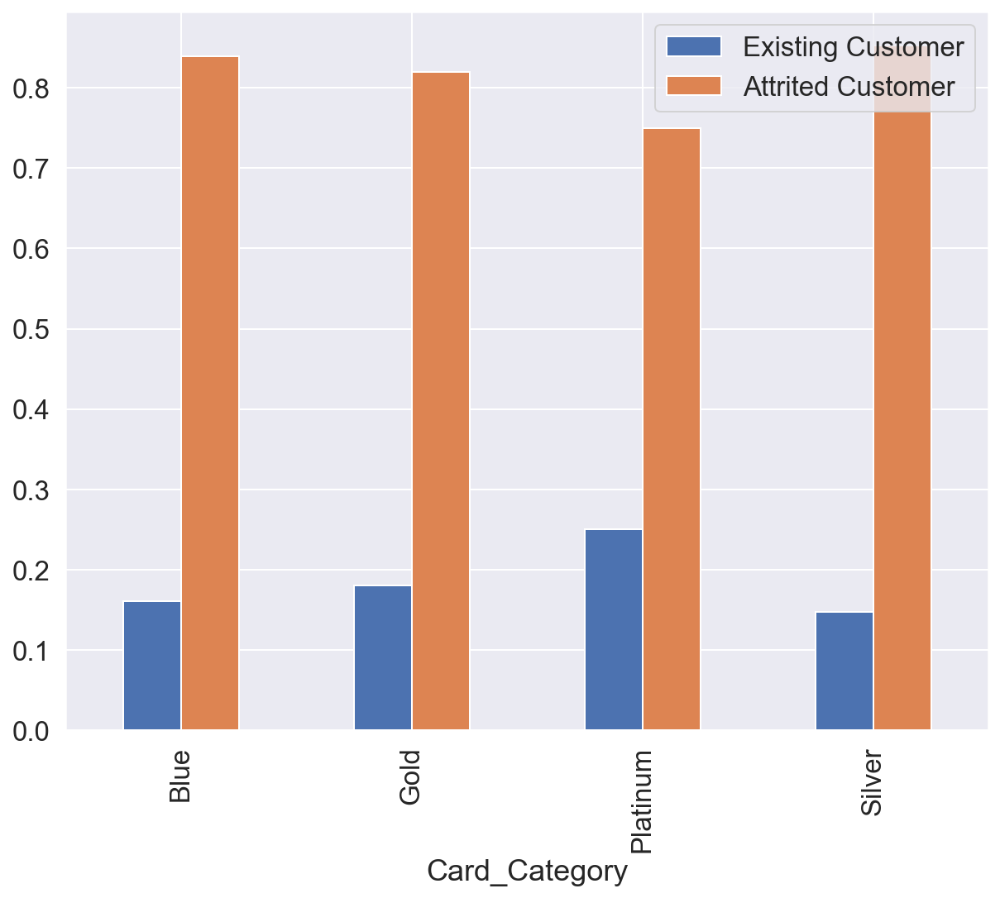

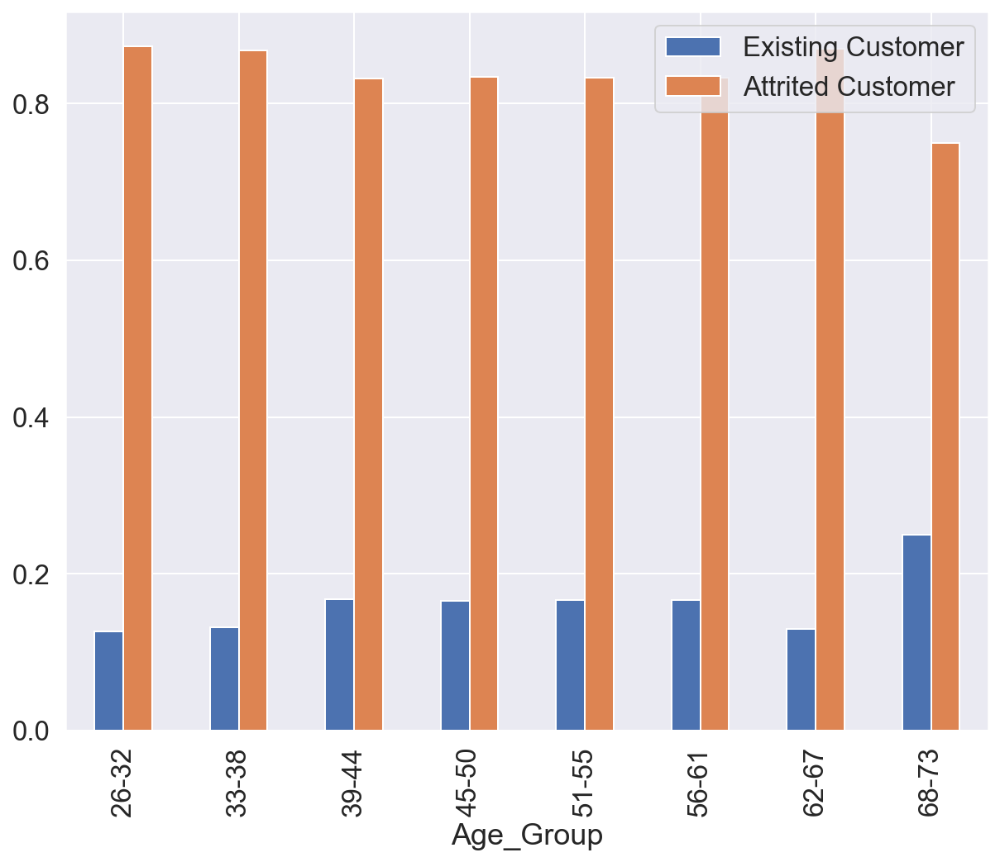

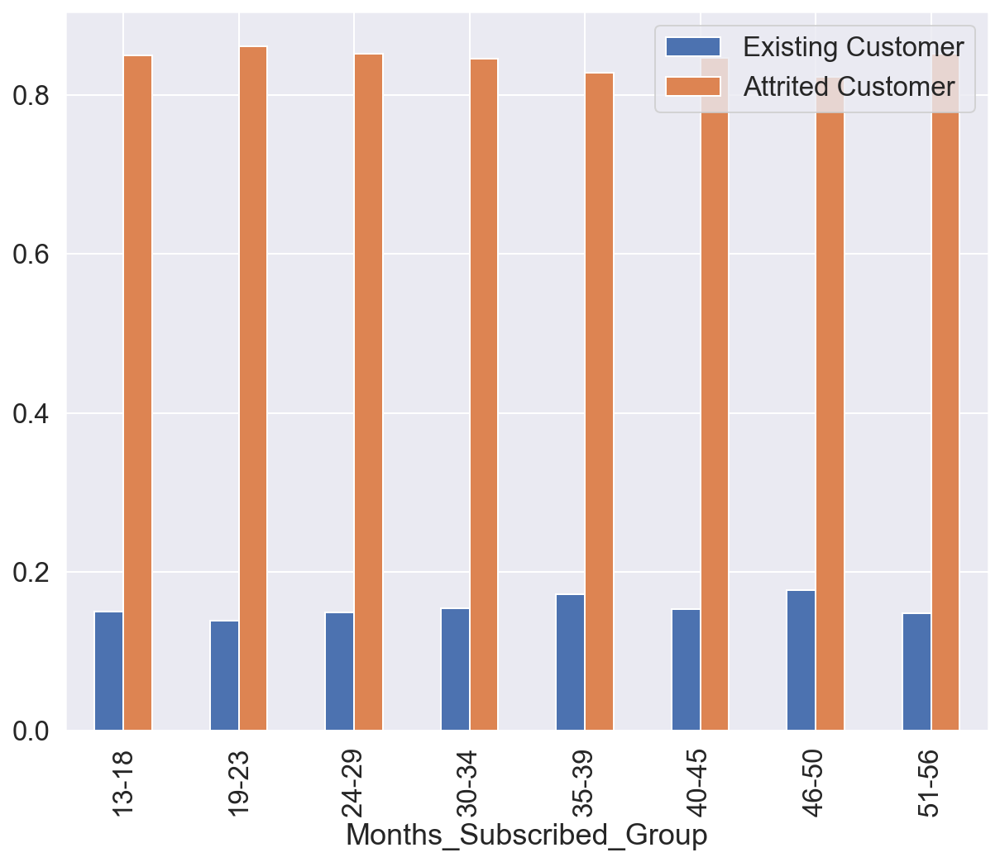

In [26]:
for column in df.select_dtypes(include=[object, 'category']).columns:
    if column != 'Customer_Churn':
        df.groupby(column)['Customer_Churn'].value_counts(normalize=True).unstack().plot(kind='bar', width=0.5, figsize=(10, 8))
        plt.legend(['Existing Customer', 'Attrited Customer'])
        plt.xticks(rotation=90)
        plt.show()

For the Gender column, my assumption is that gender may affect the decision of whether a customer would leave the credit card service or not. Yet, it shows that there is no significant difference between gender on the decision.

For the Education column, my assumption is that customer with higher education level will have lower churn rate. The data shows it is true but there is no major difference for churn rate between customers with distinct education background.

For the Card_Category column, there is a trend showing that the lower the card category, the higher the customer churn rate. Thus, it means if the customers have a premium level of categorty, they are more likely to be a loyalty customer and it is totally make sense as they can get better benefits than lower card category customers while using the card.

Generally speaking, one special thing observed in Age column is that the oldest age group have the lowest churn rate and it is believed that they may not know how to handle a credit card as they are old.

### Exploring Numerical Features:

#### Visualising the numerical features individually

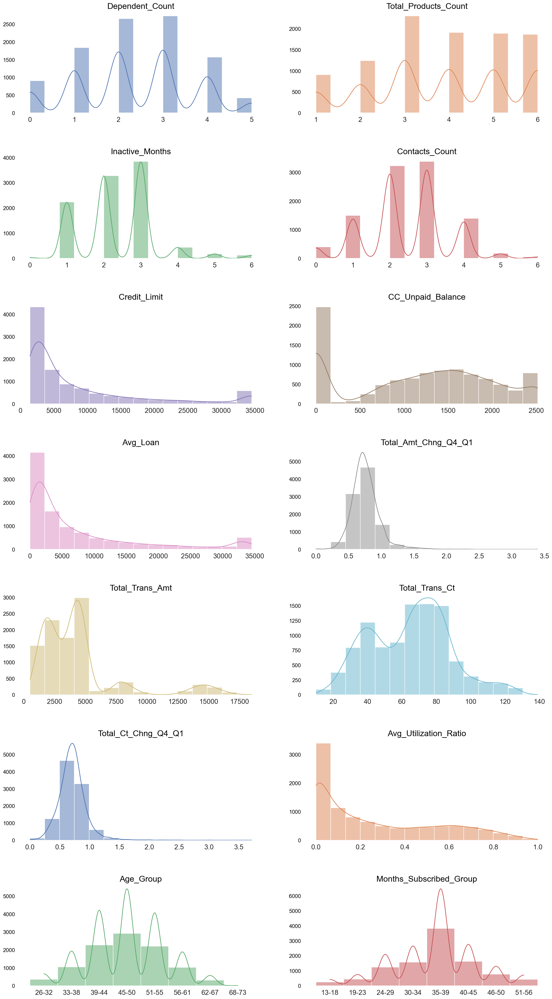

In [27]:
# Select numerical variables
numeric = df.select_dtypes(exclude=object).columns

# Visualization
fig, ax = plt.subplots(figsize =(20, 35))
fig.patch.set_facecolor('white')
mpl.rcParams['font.family'] = 'sans-serif'
mpl.rcParams['font.size'] = 12
colors = sns.color_palette("deep", n_colors=14).as_hex()

# Using for loop to create plot for each column
for i in (enumerate(numeric)):
    plt.subplot(7, 2, i[0]+1)
    sns.histplot(x = i[1], data = df, color=colors[i[0]], fill=True, bins=15, kde=True)
    plt.grid(b=None)
    plot_design()

In general, the plots make sense and meet my expectations. Yet, the group shows that for CC_Unpaid_Balance, Avg_Utilization_Ratio and Total_Ct_Chng_Q4_Q1 column, there is a noticeable amount of customer that have zero value on it. Thus, I would like to investigate what are they about.

### About The Column With Zero Value:  CC_Unpaid_Balance, Avg_Utilization_Ratio & Total_Ct_Chng_Q4_Q1

In [28]:
df.CC_Unpaid_Balance[df.CC_Unpaid_Balance==0].count() / df.CC_Unpaid_Balance.count()

0.24390243902439024

In [29]:
df.Avg_Utilization_Ratio[df.Avg_Utilization_Ratio==0].count() / df.Avg_Utilization_Ratio.count()

0.24390243902439024

In [30]:
df.Total_Ct_Chng_Q4_Q1[df.Total_Ct_Chng_Q4_Q1==0].count() / df.Total_Ct_Chng_Q4_Q1.count()

0.0006912214871136566

In [85]:
df.Total_Amt_Chng_Q4_Q1[df.Total_Amt_Chng_Q4_Q1==0].count() / df.Total_Amt_Chng_Q4_Q1.count()

0.0004937296336526119

For CC_Unpaid_Balance column, there are 24.4% zero value which means these customers pay their credit card balance in a timely manner. For Avg_Utilization_Ratio column there are 24.4% zero value which indicates to lenders and credit card issuers that the customer are not using the credit card. For Total_Ct_Chng_Q4_Q1 column, it shows that 0.07% of customers do not have any change in total transaction count (Q4 over Q1). For Total_Amt_Chng_Q4_Q1 column, it shows that 0.05% of customers do not have any change in total transaction amount (Q4 over Q1).

### Boxplot for numerical Features:

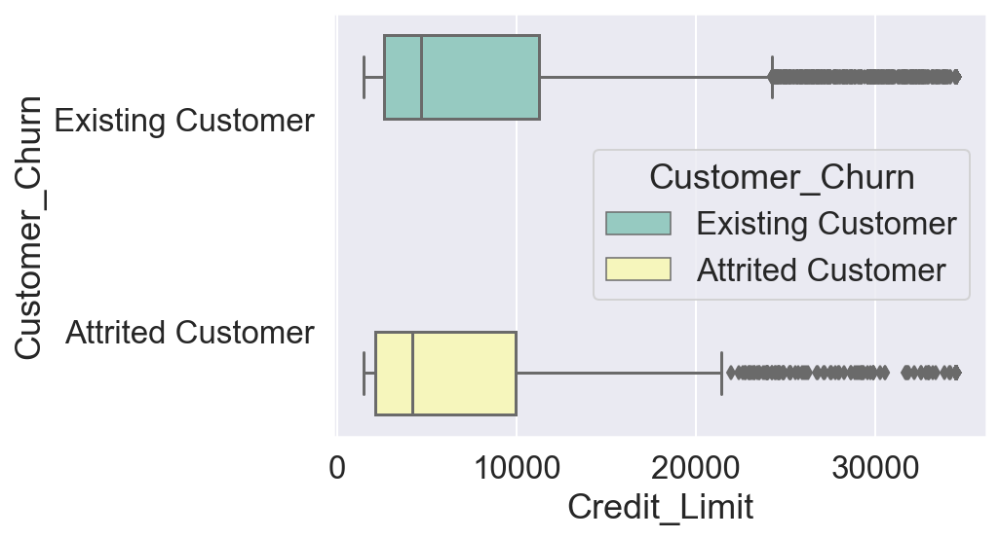

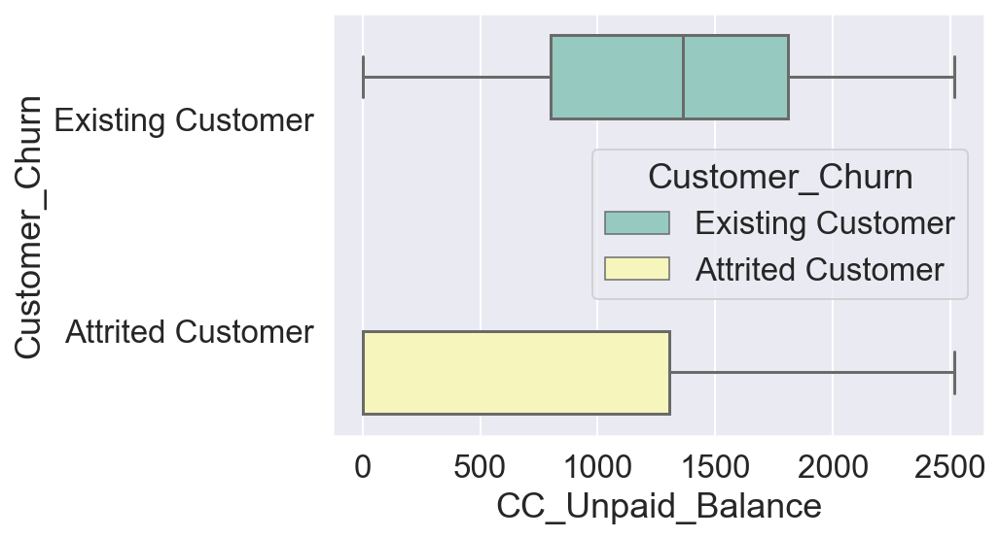

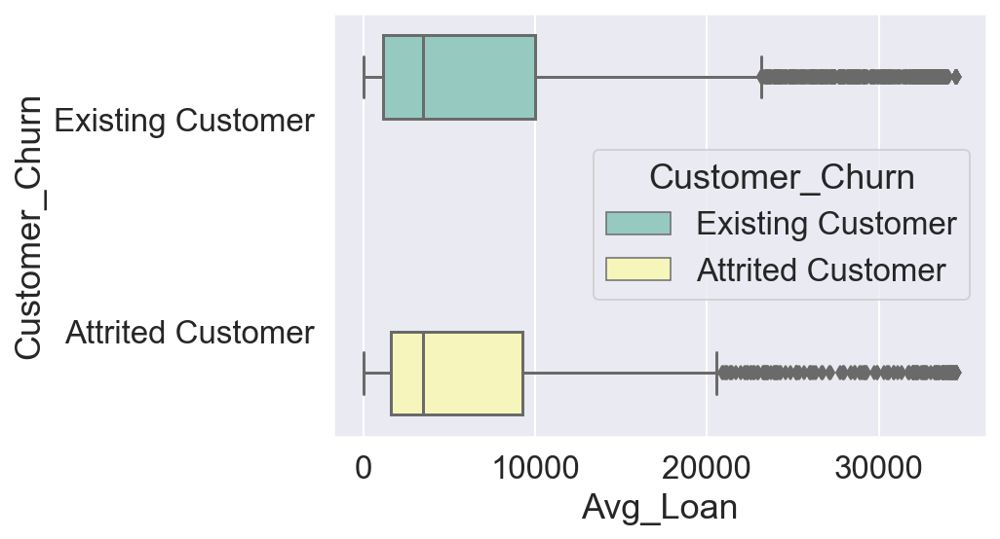

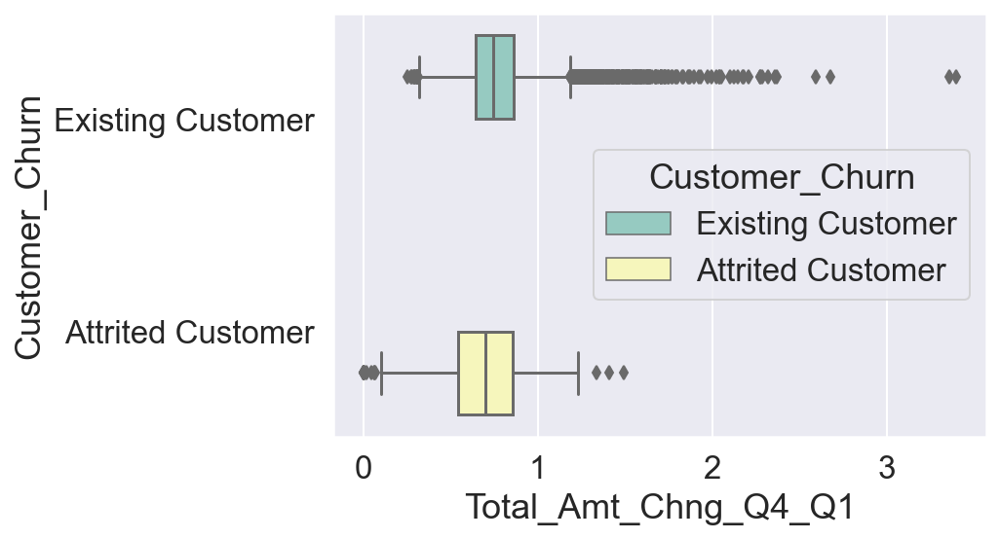

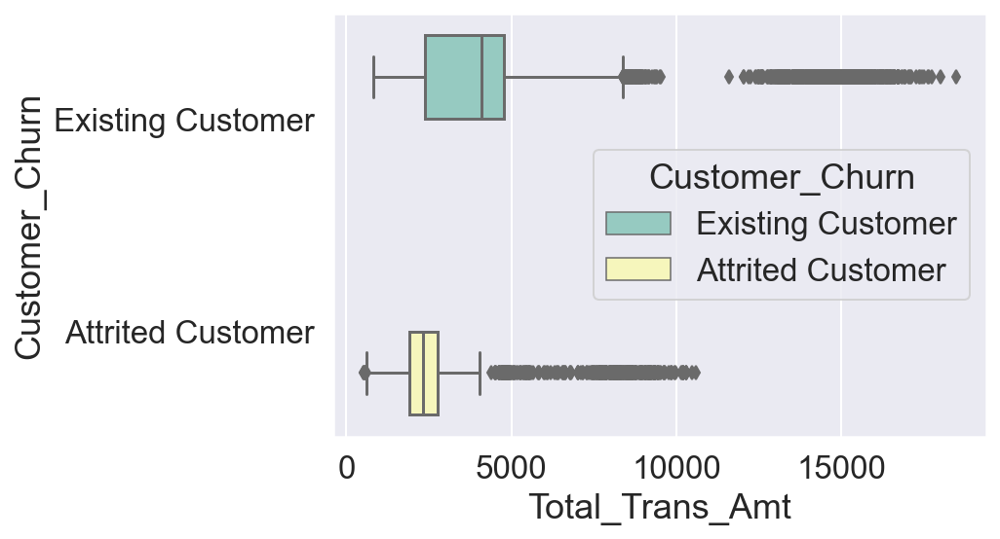

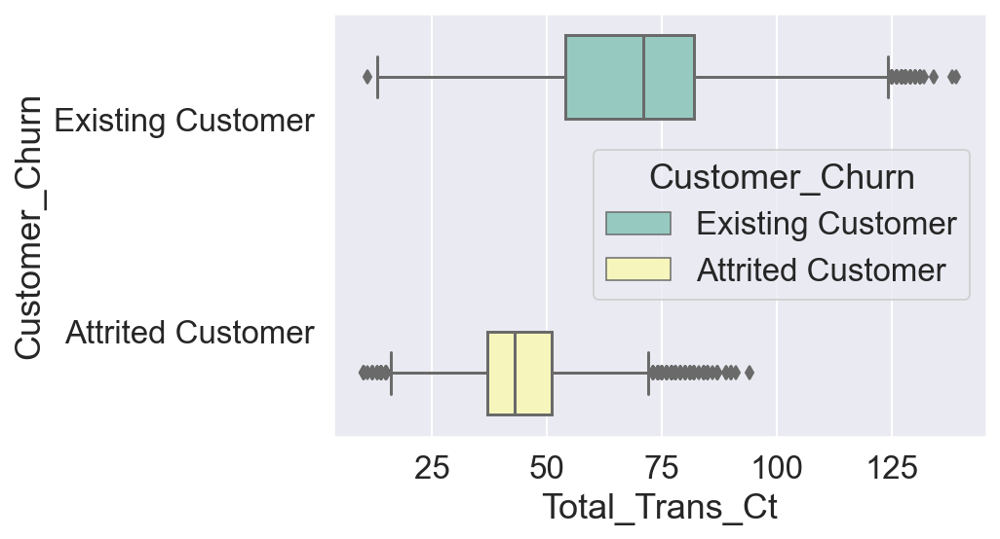

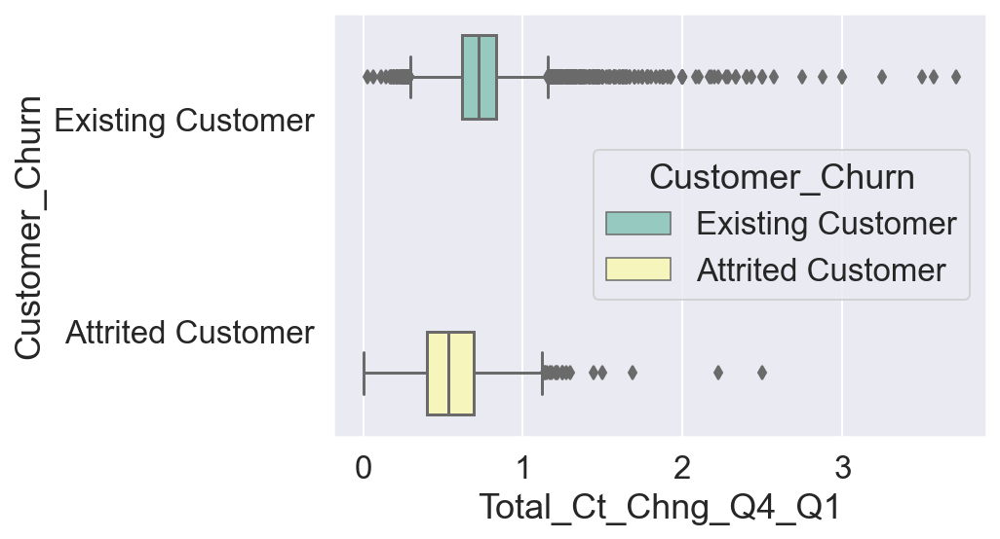

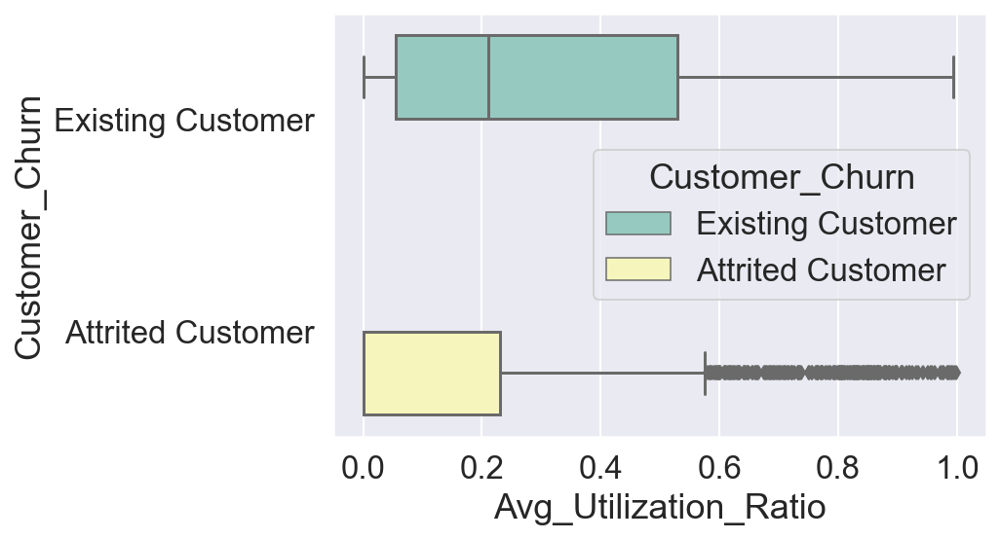

In [32]:
for col in ['Credit_Limit','CC_Unpaid_Balance','Avg_Loan','Total_Amt_Chng_Q4_Q1','Total_Trans_Amt','Total_Trans_Ct','Total_Ct_Chng_Q4_Q1','Avg_Utilization_Ratio']: 
    ax = sns.boxplot(x=col, y="Customer_Churn", hue="Customer_Churn", data=df, palette="Set3")
    plt.show()

From the above boxplots, especially for the Total_Amt_Chng_Q4_Q1 column, it shows there are a obvious outliers when the total amount of change is above 3, thus, I would like to drop them. Due to the small size of dataset and I am going to drop the unknown value, I will not drop them at the moment and I will try to apply it to the machine learning model to investigate the result first and decide if I need to drop it afterwards. 

# Plot A Heatmap Of The Correlation Matrix For Numerical Features
---

Heatmap is used to visually examine the correlation structure of the predictors. 

Correlation matrix is a table showing correlation coefficients and relationship between sets of predictors. Correlation coefficients is a measure of the linear relationship between two variables and it has value between -1 and 1.

Correlation coefficients -1 means indicates a perfectly negative linear correlation between two variables

Correlation coefficients 0 means indicates no linear correlation between two variables

Correlation coefficients 1 means indicates a perfectly positive linear correlation between two variables


In [33]:
# Manually dummify the column to ensure Attrited Customer is 1 & Existing Customer is 0
df.Customer_Churn = df.Customer_Churn.replace({'Attrited Customer':1,'Existing Customer':0})

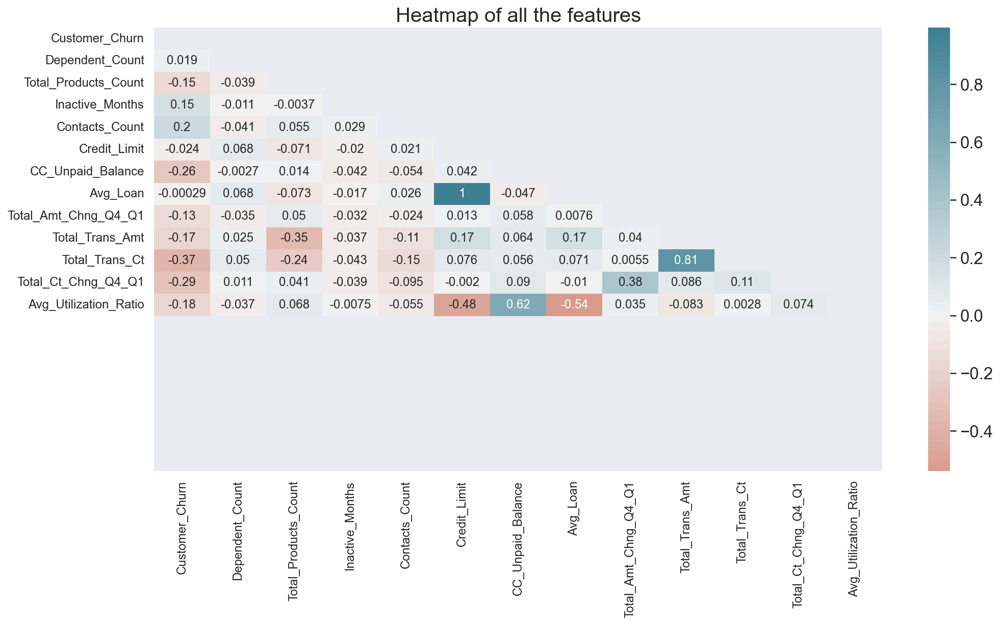

In [34]:
def correlation_heat_map(df):
    corrs = df.corr()

    # Set the matplotlib figure size:
    fig, ax = plt.subplots(figsize=(16, 8))


    # Generate a mask for the upper triangle
    mask = np.zeros_like(corrs, dtype=bool) 
    mask[np.triu_indices_from(mask)] = True 

    # Plot the heatmap with seaborn.
    # Assign the matplotlib axis the function returns. This will let us resize the labels.
    ax = sns.heatmap(corrs, mask=mask, annot=True, cmap=sns.diverging_palette(20, 220, n=200), center = 0)

    # Resize the labels.
    ax.set_xticklabels(ax.xaxis.get_ticklabels(), fontsize=12, rotation=90)
    ax.set_yticklabels(ax.yaxis.get_ticklabels(), fontsize=12, rotation=0)
    ax.set_ylim([df.shape[1], 0]) 
    plt.title("Heatmap of all the features", fontsize = 20);
    return fig, ax

fig, ax = correlation_heat_map(df)

There is a strong positive linear correlation between Total_Trans_Ct and Total_Trans_Amt column.

As Avg_Loan and Credit_Limit have correlation coefficients 1 and it means indicates a perfectly positive linear correlation between two variables. Thus, I need to drop one of the column.

#### Checking the correlation bewteen features and target variables

I would like to list out the top 7 features that are positively or negatively correlated to the target variable, Customer_Churn.

Negative correlation:
Total_Trans_Ct          -0.371403
Total_Ct_Chng_Q4_Q1     -0.290054
CC_Unpaid_Balance       -0.263053
Avg_Utilization_Ratio   -0.178410
Total_Trans_Amt         -0.168598
Total_Products_Count    -0.150005
Total_Amt_Chng_Q4_Q1    -0.131063
Name: Customer_Churn, dtype: float64
Positive correlation:
Dependent_Count    0.018991
Inactive_Months    0.152449
Contacts_Count     0.204491
Customer_Churn     1.000000
Name: Customer_Churn, dtype: float64


<AxesSubplot:>

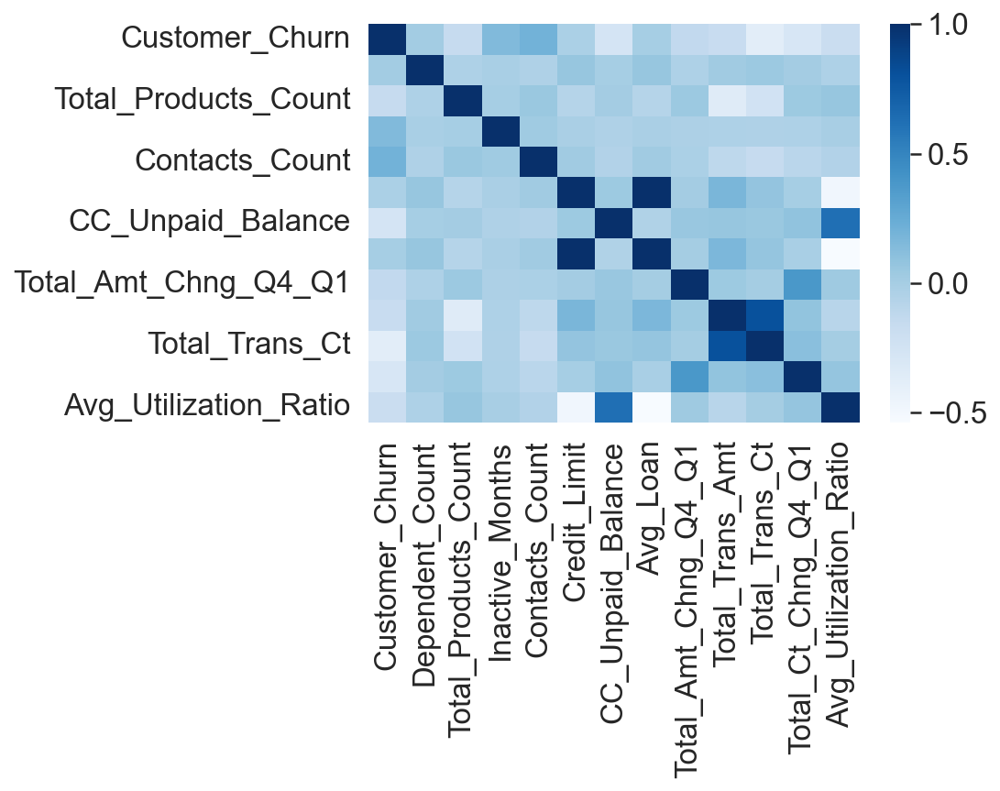

In [35]:
corr = df.corr().sort_values(by='Customer_Churn')
print('Negative correlation:\n{}'.format(corr['Customer_Churn'].iloc[:7]))
print('Positive correlation:\n{}'.format(corr['Customer_Churn'].tail(4)))
sns.heatmap(df.corr(), cmap="Blues")

In [36]:
df.drop(columns=['Avg_Loan'], inplace=True)

In [37]:
# To check if the Avg_Loan column is dropped 
df.shape

(10127, 19)

# Data preprocessing

#### Data preprocessing - dummifying categorical features

In [38]:
# Manually dummify the column to ensure Female is 1 & Male is 0
df.Gender = df.Gender.replace({'F':1,'M':0})

In [39]:
# To dummify other categorical variables
for column in ['Education','Income', 'Marital_Status', 'Card_Category', 'Age_Group', 'Months_Subscribed_Group']:
    df = pd.concat([df, pd.get_dummies(df[column], prefix=column, drop_first=False)],axis=1)

In [40]:
# To drop the original column of categorical variables 
df.drop(columns=['Education', 'Income', 'Marital_Status', 'Card_Category', 'Age_Group', 'Months_Subscribed_Group', 'Education_Unknown', 'Income_Unknown', 'Marital_Status_Unknown'], inplace= True)

In [41]:
df.head(2)

,Customer_Churn,Gender,Dependent_Count,Total_Products_Count,Inactive_Months,Contacts_Count,Credit_Limit,CC_Unpaid_Balance,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio,Education_College,Education_Doctorate,Education_Graduate,Education_High School,Education_Post-Graduate,Education_Uneducated,Income_$120K +,Income_$40K - $60K,Income_$60K - $80K,Income_$80K - $120K,Income_Less than $40K,Marital_Status_Divorced,Marital_Status_Married,Marital_Status_Single,Card_Category_Blue,Card_Category_Gold,Card_Category_Platinum,Card_Category_Silver,Age_Group_26-32,Age_Group_33-38,Age_Group_39-44,Age_Group_45-50,Age_Group_51-55,Age_Group_56-61,Age_Group_62-67,Age_Group_68-73,Months_Subscribed_Group_13-18,Months_Subscribed_Group_19-23,Months_Subscribed_Group_24-29,Months_Subscribed_Group_30-34,Months_Subscribed_Group_35-39,Months_Subscribed_Group_40-45,Months_Subscribed_Group_46-50,Months_Subscribed_Group_51-56
0,0,0,3,5,1,3,12691.0,777,1.335,1144,42,1.625,0.061,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0
1,0,1,5,6,1,2,8256.0,864,1.541,1291,33,3.714,0.105,0,0,1,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0


In [42]:
df.shape

(10127, 47)

# Methodologies

With a view to comparing the performance of the model under different circumstances, I am going to apply the data into the model without doing any sampling techniques. Thus, I can see if applying sampling techniques can improve the performance.

Since the target variable is strongly imbalanced, it is assumed that simply applying the dataset into the model will result in overfitting and it will not be possible to predict who is going to be churned as the model will be biased as the major class is the existing customer. Therefore, my next approach is that I will try to apply undersampling using NearMiss method and oversampling using SMOTE method to balance the data and decide which sampling techniques have the best accuracy towards the predicted result. 

## Method 1: Modeling without using SMOTE 

### Defining target variable & features

In [43]:
x = df.drop('Customer_Churn',axis=1)
y = df['Customer_Churn']

### Determine the baseline accuracy of the model for predicting customer churn: 
#### The accuracy that can be achieved by a model by simply guessing the majority class for every observation.

In [44]:
y.value_counts(normalize=True)

0    0.83934
1    0.16066
Name: Customer_Churn, dtype: float64

In [45]:
print('Baseline prediction for customer churn:', y.values.mean())

Baseline prediction for customer churn: 0.1606596227905599


#### Train-test split

In [46]:
x_train, x_test, y_train, y_test = train_test_split(x, y, stratify=y, test_size=0.2, random_state=42)

#### Standarisation

In [47]:
scaler = StandardScaler()

# Fit the data using the scaler (scale the data)
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

I used a for loop to look at the accurancy of the different models to see which one perform the best.

In [48]:
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

In [49]:
classifiers = [
    ('logisticregression', LogisticRegression(),
     {'penalty': ['l1','l2'], 'C':[0.001,0.01,0.1,1,10,100,1000]}),
    ('randomforestclassifier',RandomForestClassifier(),
    {'n_estimators':[30,40,50],'max_depth': list(range(2,5))}),
    ('adaboostclassifier',AdaBoostClassifier(), {'n_estimators':[10,20,30,40,50,60]}),
    ('xgbclassifier', XGBClassifier(),{'max_depth':list(range(2,5)),'gamma':[0.001,0.01,0.1,1]}),
    ('kneighborsclassifier', KNeighborsClassifier(),
     {'n_neighbors': list(range(2,11,2)), 'algorithm':['ball_tree','kd_tree','brute']}),
    
]

logisticregression
Fitting 5 folds for each of 3 candidates, totalling 15 fits
{'Best param': {'logisticregression__penalty': 'l2', 'logisticregression__C': 10}, 'Best estimator': Pipeline(steps=[('logisticregression', LogisticRegression(C=10))]), 'Best training score': 0.9043328687519516, 'Model': LogisticRegression(), 'Best testing score': 0.5476923076923077}
Train Result:
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      6799
           1       0.78      0.60      0.68      1302

    accuracy                           0.91      8101
   macro avg       0.85      0.78      0.81      8101
weighted avg       0.90      0.91      0.90      8101



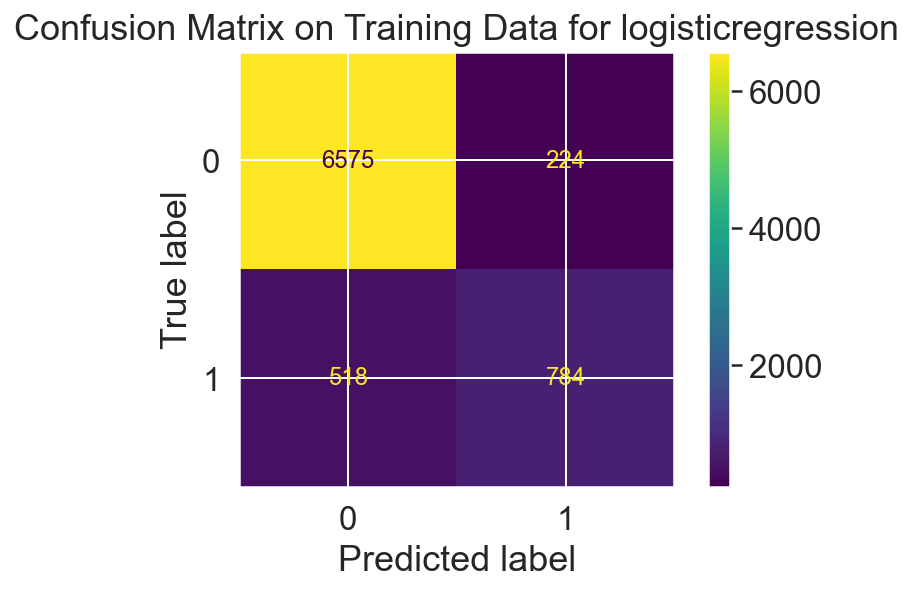

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.92      0.97      0.94      1701
           1       0.77      0.54      0.64       325

    accuracy                           0.90      2026
   macro avg       0.84      0.76      0.79      2026
weighted avg       0.89      0.90      0.89      2026



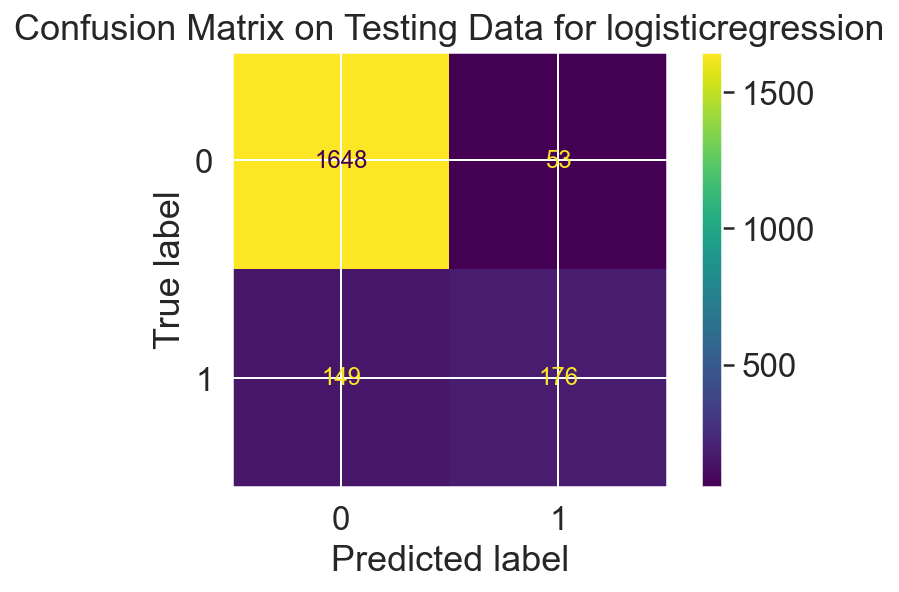

<Figure size 864x864 with 0 Axes>

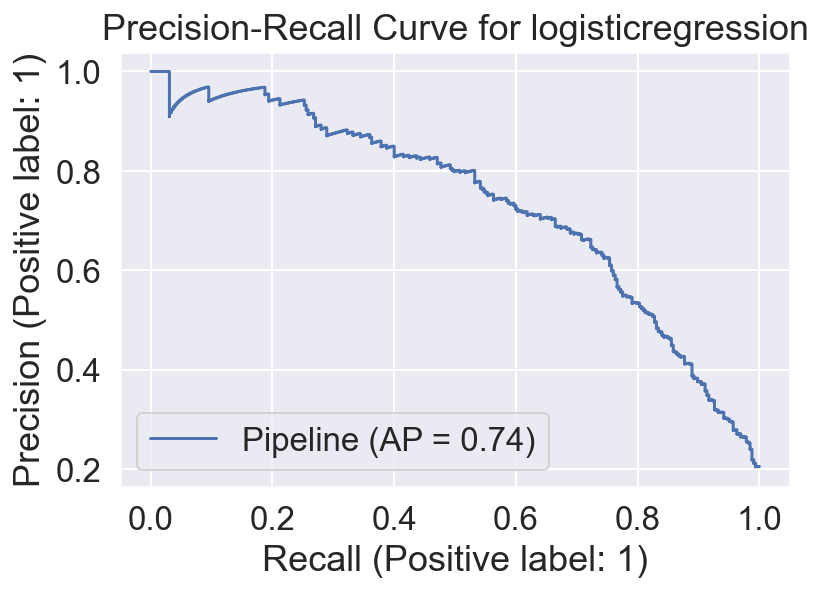

<Figure size 864x864 with 0 Axes>

randomforestclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Feature: Card_Category_Blue, Score: 0.0
Feature: Age_Group_68-73, Score: 2.5227335238601582e-05
Feature: Education_Graduate, Score: 3.0048591877698943e-05
Feature: Marital_Status_Divorced, Score: 5.973479303165238e-05
Feature: Months_Subscribed_Group_46-50, Score: 7.56157734243514e-05
Feature: Months_Subscribed_Group_51-56, Score: 7.71793955201477e-05
Feature: Income_$120K +, Score: 8.269375825207243e-05
Feature: Months_Subscribed_Group_30-34, Score: 8.367335462753778e-05
Feature: Education_High School, Score: 8.771529658772985e-05
Feature: Card_Category_Silver, Score: 9.345517563752744e-05
Feature: Months_Subscribed_Group_35-39, Score: 0.00011874232169362982
Feature: Age_Group_62-67, Score: 0.00012123825547228556
Feature: Income_$80K - $120K, Score: 0.00012983068623837976
Feature: Months_Subscribed_Group_40-45, Score: 0.0001481682802080712
Feature: Months_Subscribed_Group_24-29, Score: 0.000159662106463

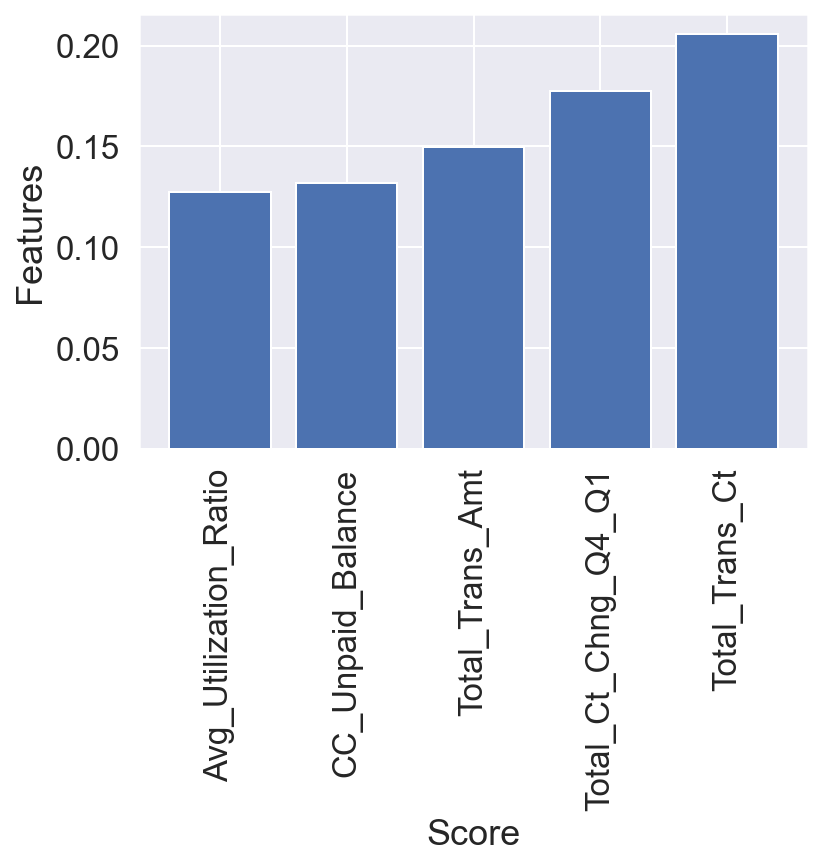

{'Best param': {'randomforestclassifier__n_estimators': 40, 'randomforestclassifier__max_depth': 4}, 'Best estimator': Pipeline(steps=[('randomforestclassifier',
                 RandomForestClassifier(max_depth=4, n_estimators=40))]), 'Best training score': 0.8916180379433515, 'Model': RandomForestClassifier(), 'Best testing score': 0.3261538461538461}
Train Result:
              precision    recall  f1-score   support

           0       0.89      1.00      0.94      6799
           1       0.94      0.33      0.49      1302

    accuracy                           0.89      8101
   macro avg       0.91      0.66      0.71      8101
weighted avg       0.89      0.89      0.87      8101



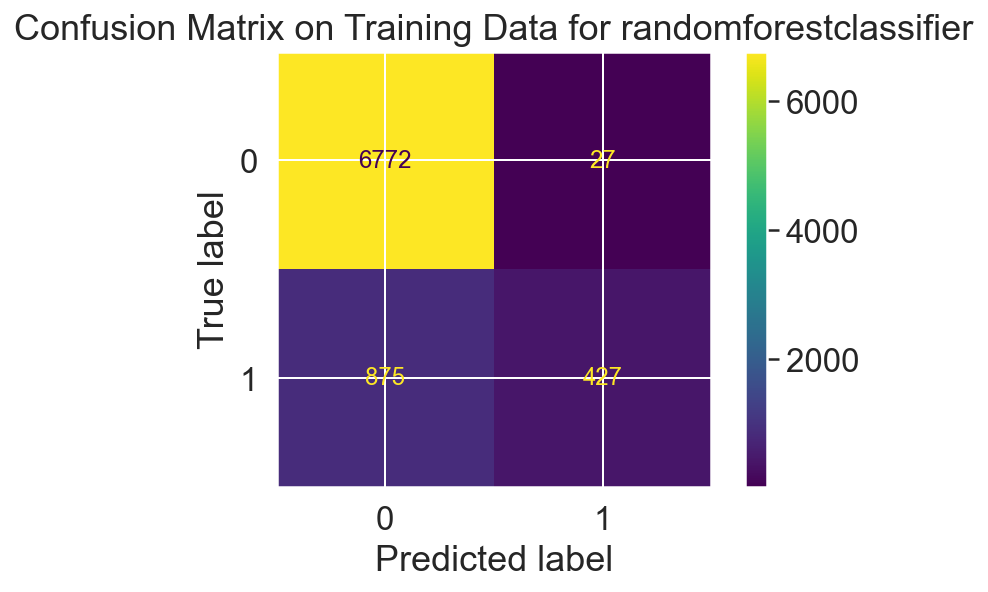

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.88      1.00      0.93      1701
           1       0.95      0.29      0.44       325

    accuracy                           0.88      2026
   macro avg       0.91      0.64      0.69      2026
weighted avg       0.89      0.88      0.86      2026



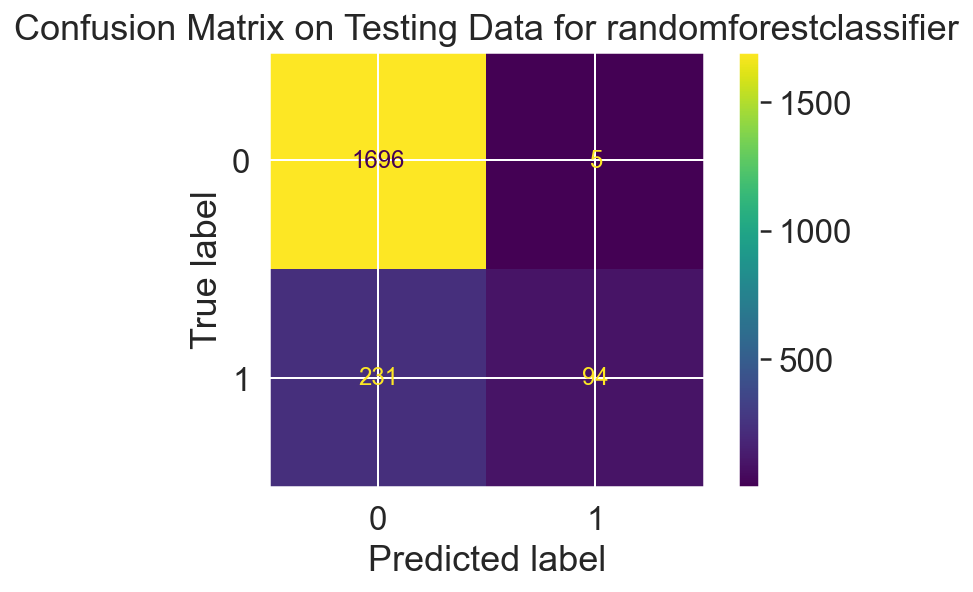

<Figure size 864x864 with 0 Axes>

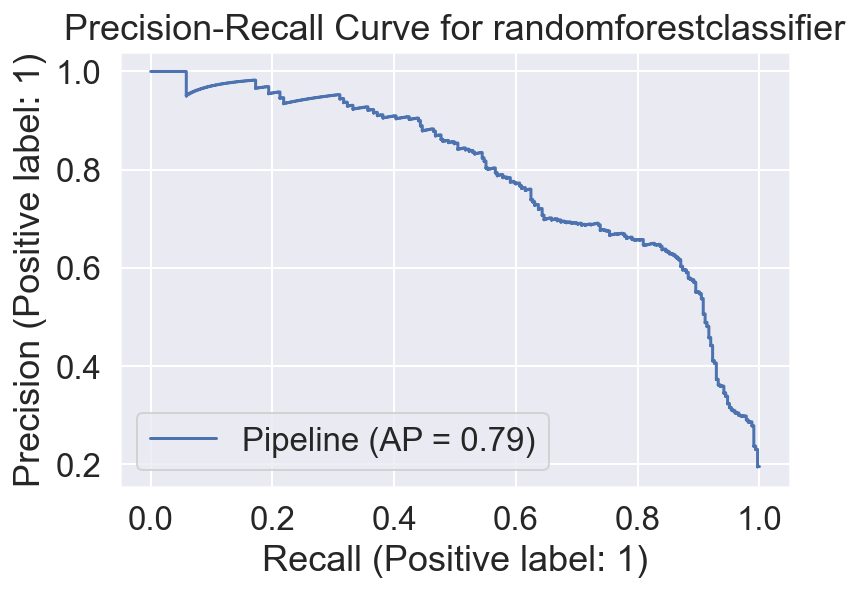

<Figure size 864x864 with 0 Axes>

adaboostclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Feature: Avg_Utilization_Ratio, Score: 0.0
Feature: Education_College, Score: 0.0
Feature: Education_Doctorate, Score: 0.0
Feature: Education_Graduate, Score: 0.0
Feature: Education_High School, Score: 0.0
Feature: Education_Post-Graduate, Score: 0.0
Feature: Education_Uneducated, Score: 0.0
Feature: Income_$120K +, Score: 0.0
Feature: Income_$40K - $60K, Score: 0.0
Feature: Income_$60K - $80K, Score: 0.0
Feature: Income_$80K - $120K, Score: 0.0
Feature: Income_Less than $40K, Score: 0.0
Feature: Marital_Status_Divorced, Score: 0.0
Feature: Marital_Status_Married, Score: 0.0
Feature: Marital_Status_Single, Score: 0.0
Feature: Card_Category_Blue, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0
Feature: Card_Category_Platinum, Score: 0.0
Feature: Card_Category_Silver, Score: 0.0
Feature: Age_Group_33-38, Score: 0.0
Feature: Age_Group_39-44, Score: 0.0
Feature: Age_Group_45-50, Score: 0.0
Feature: Age_Group_

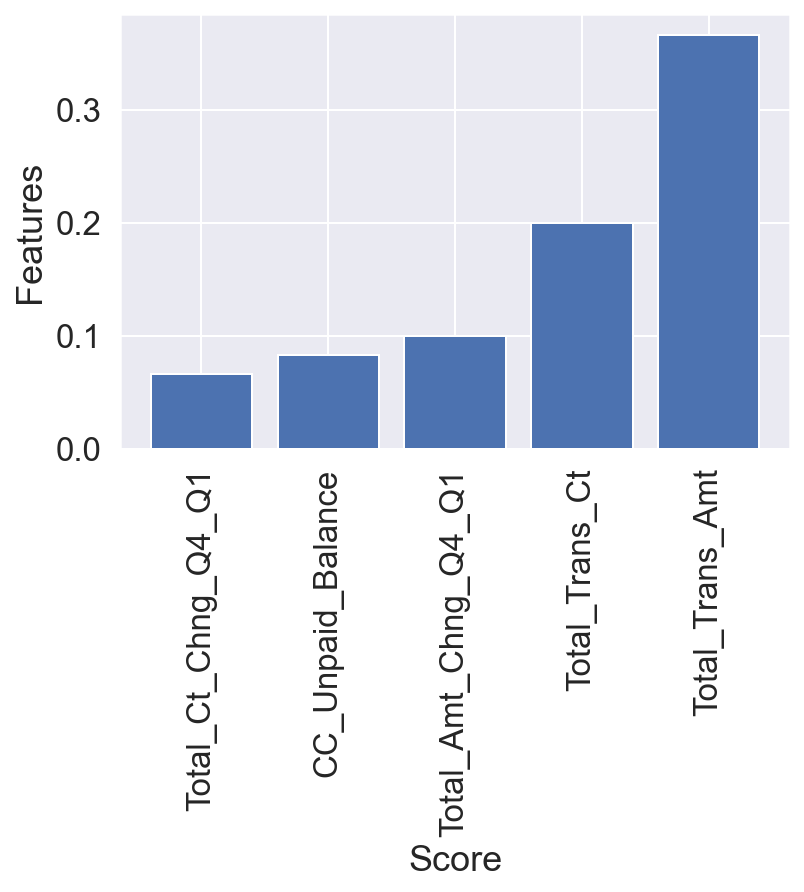

{'Best param': {'adaboostclassifier__n_estimators': 60}, 'Best estimator': Pipeline(steps=[('adaboostclassifier', AdaBoostClassifier(n_estimators=60))]), 'Best training score': 0.9571651396409775, 'Model': AdaBoostClassifier(), 'Best testing score': 0.7938461538461539}
Train Result:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98      6799
           1       0.89      0.85      0.87      1302

    accuracy                           0.96      8101
   macro avg       0.93      0.92      0.92      8101
weighted avg       0.96      0.96      0.96      8101



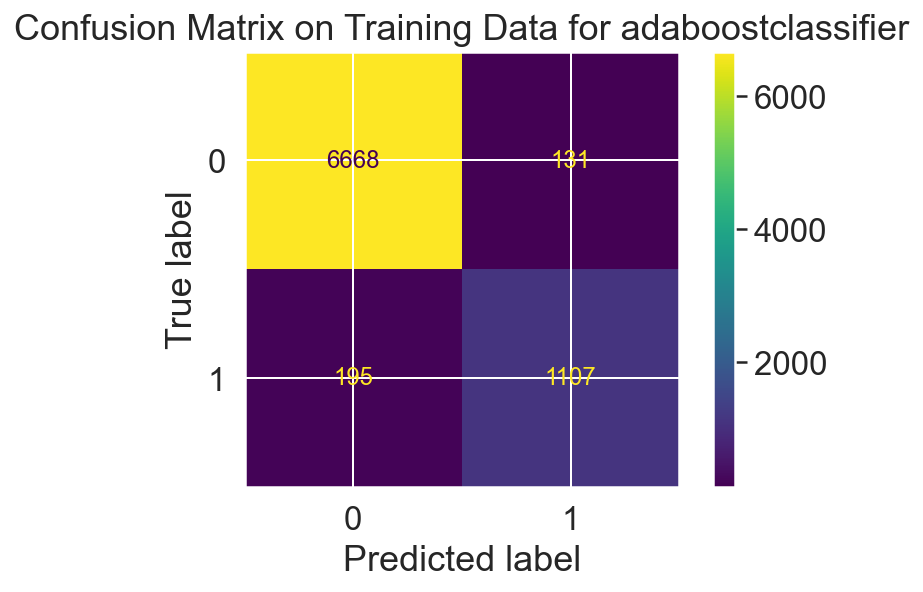

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.96      0.98      0.97      1701
           1       0.91      0.81      0.85       325

    accuracy                           0.96      2026
   macro avg       0.94      0.90      0.91      2026
weighted avg       0.95      0.96      0.95      2026



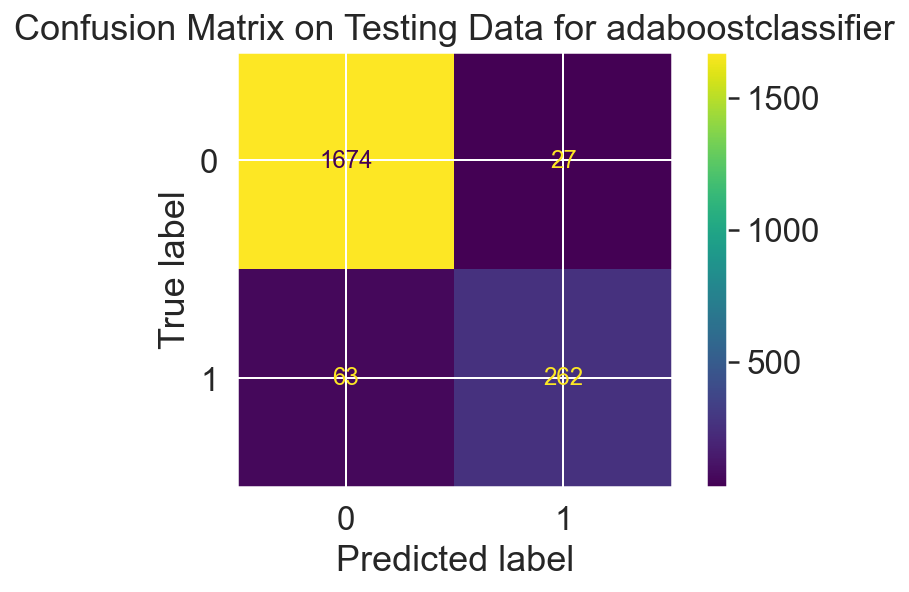

<Figure size 864x864 with 0 Axes>

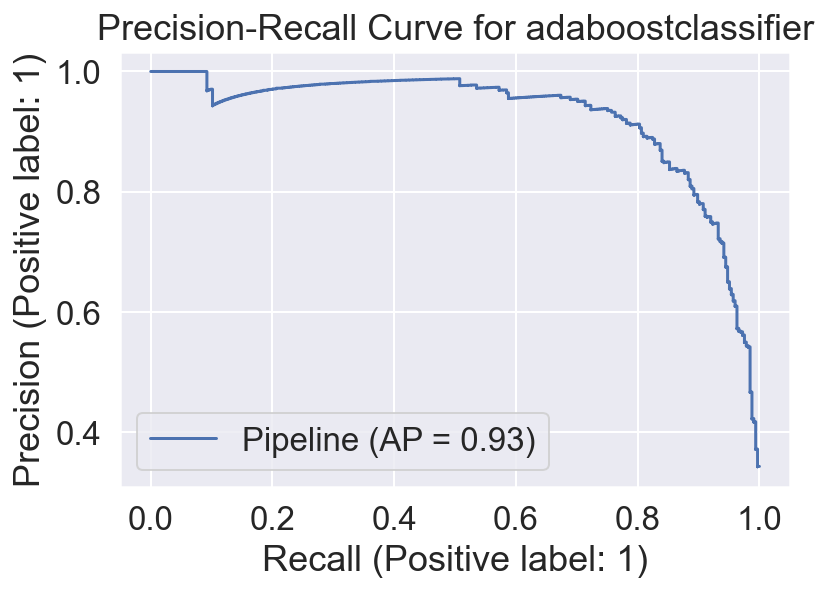

<Figure size 864x864 with 0 Axes>

xgbclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/compat.

/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will b

[22:13:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Feature: Education_College, Score: 0.0
Feature: Education_Doctorate, Score: 0.0
Feature: Education_High School, Score: 0.0
Feature: Education_Uneducated, Score: 0.0
Feature: Income_$120K +, Score: 0.0
Feature: Income_$40K - $60K, Score: 0.0
Feature: Income_$80K - $120K, Score: 0.0
Feature: Marital_Status_Divorced, Score: 0.0
Feature: Card_Category_Blue, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0
Feature: Card_Category_Platinum, Score: 0.0
Feature: Age_Group_68-73, Score: 0.0
Feature: Months_Subscribed_Group_30-34, Score: 0.0
Feature: Months_Subscribed_Group_46-50, Score: 0.0
Feature: Age_Group_39-44, Score: 0.003834314178675413
Feature: Education_Post-Graduate, Score: 0.0049323271960020065
Feature: 

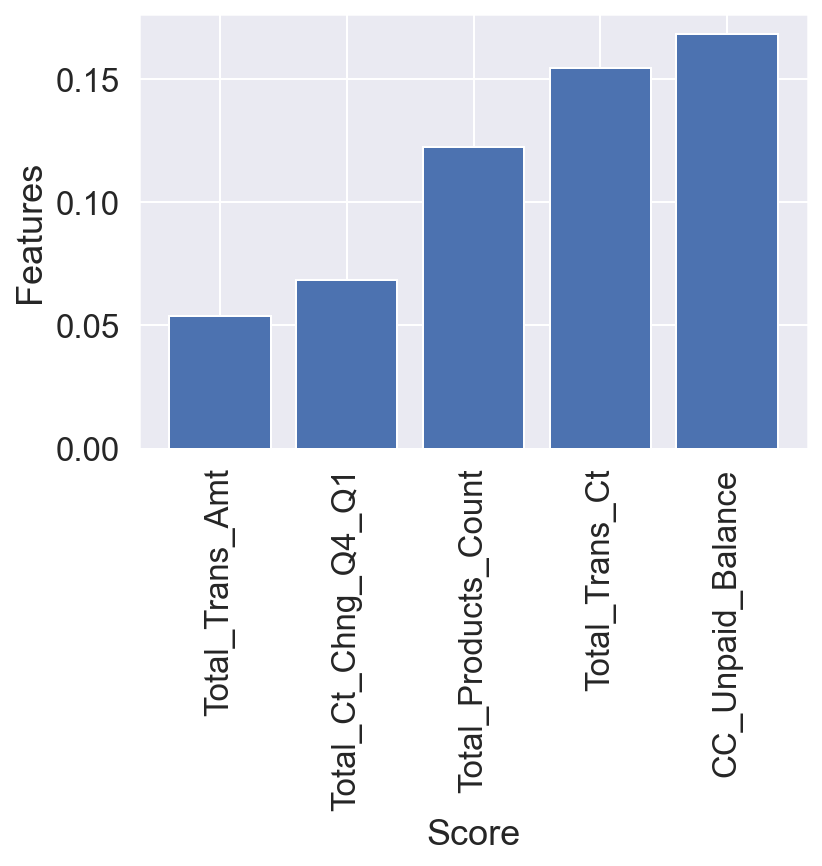

[22:13:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:13:39] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:13:40] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'Best param': {'xgbclassifier__max_depth': 3, 'xgbclassifier__gamma': 1}, 'Best estimator': Pipeline(steps=[('xgbclassifier',
                 XGBC

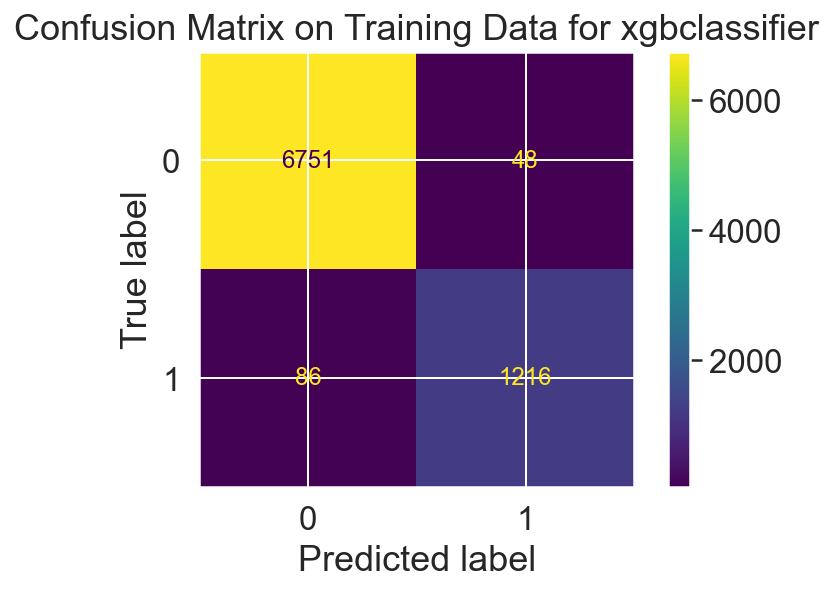

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1701
           1       0.95      0.86      0.90       325

    accuracy                           0.97      2026
   macro avg       0.96      0.93      0.94      2026
weighted avg       0.97      0.97      0.97      2026



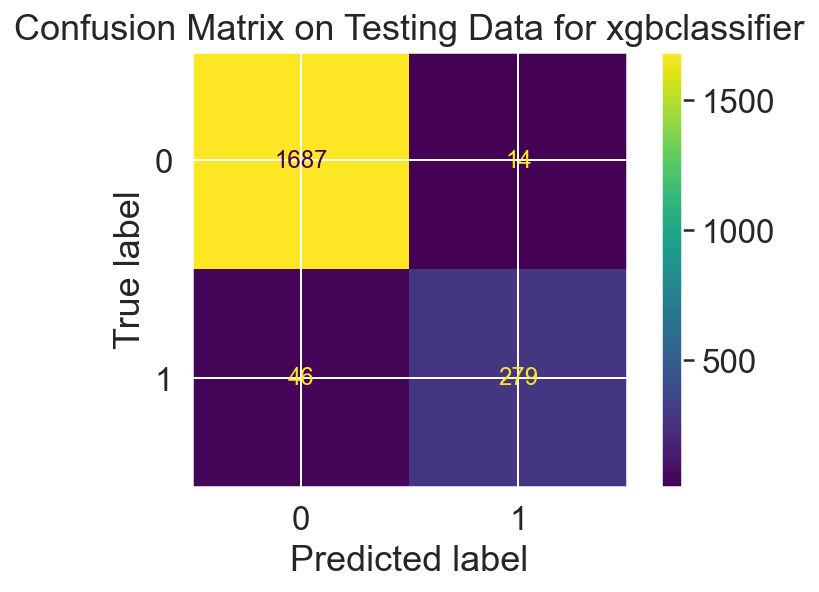

<Figure size 864x864 with 0 Axes>

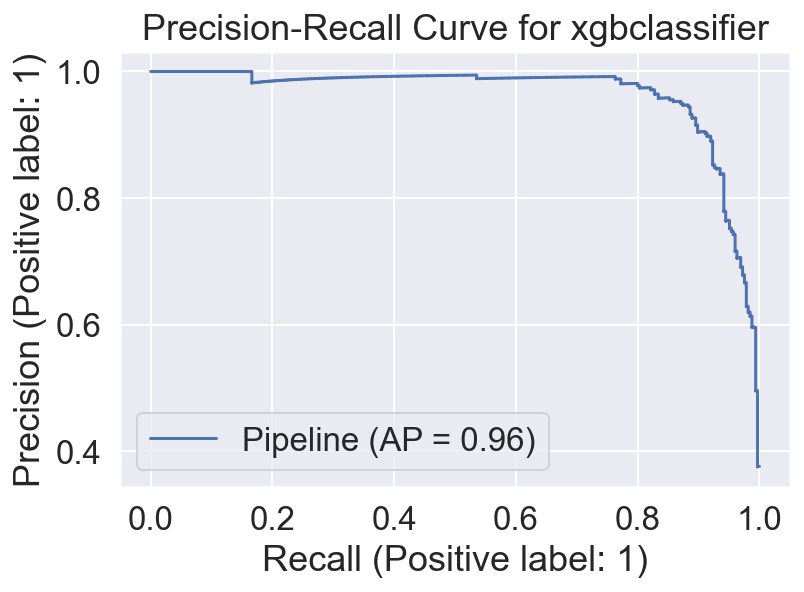

<Figure size 864x864 with 0 Axes>

kneighborsclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
{'Best param': {'kneighborsclassifier__n_neighbors': 10, 'kneighborsclassifier__algorithm': 'kd_tree'}, 'Best estimator': Pipeline(steps=[('kneighborsclassifier',
                 KNeighborsClassifier(algorithm='kd_tree', n_neighbors=10))]), 'Best training score': 0.8543389616225314, 'Model': KNeighborsClassifier(), 'Best testing score': 0.12}
Train Result:
              precision    recall  f1-score   support

           0       0.86      1.00      0.92      6799
           1       0.92      0.15      0.26      1302

    accuracy                           0.86      8101
   macro avg       0.89      0.57      0.59      8101
weighted avg       0.87      0.86      0.82      8101



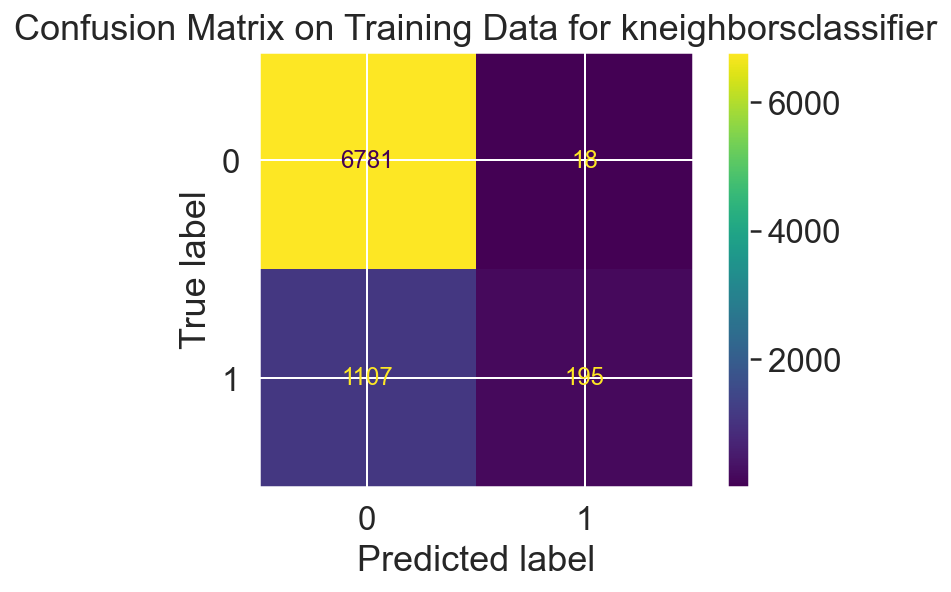

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      1701
           1       0.79      0.08      0.15       325

    accuracy                           0.85      2026
   macro avg       0.82      0.54      0.53      2026
weighted avg       0.84      0.85      0.79      2026



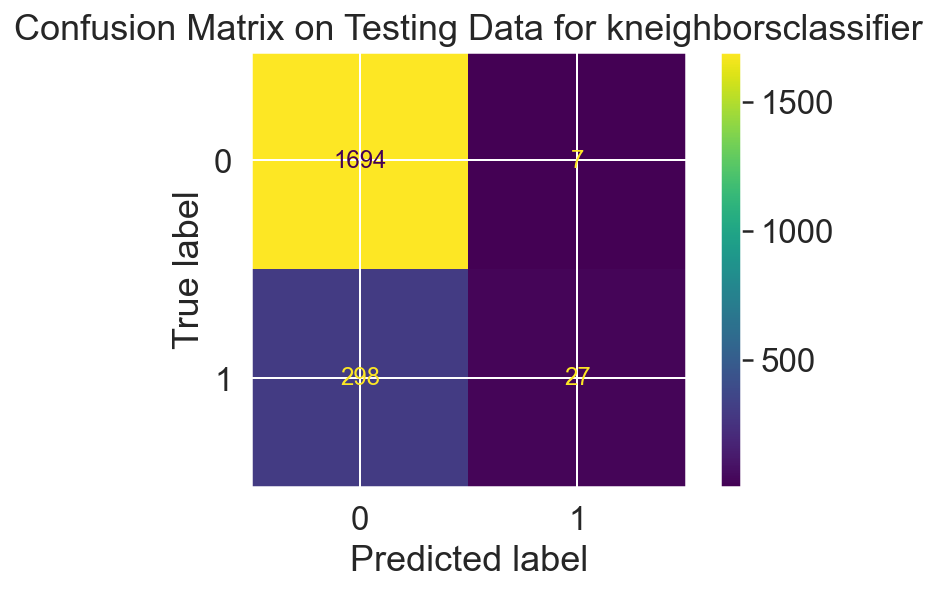

<Figure size 864x864 with 0 Axes>

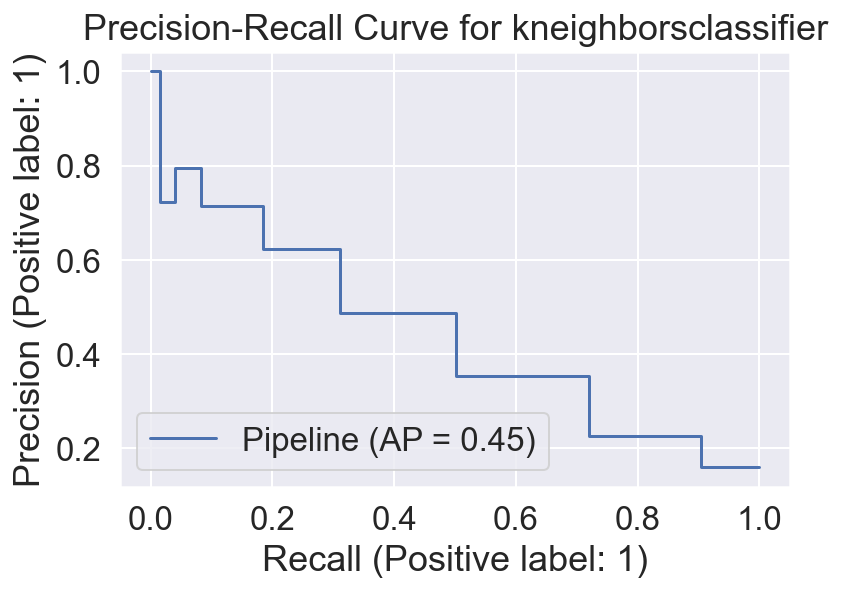

<Figure size 864x864 with 0 Axes>

In [50]:
kf = KFold(n_splits=3, random_state=42, shuffle=True)
model_dict = {}

best_param_model = { i[0] : {} for i in classifiers}
for i, model in zip(list(range(len(classifiers))), classifiers):
    print(model[0])
    imba_pipeline = make_pipeline(model[1])
    new_params = {model[0] + '__' + key : model[2][key] for key in model[2] }
    grid_imba = RandomizedSearchCV(imba_pipeline, new_params, n_iter=3,random_state=42, verbose=1, n_jobs=-1)
    grid_imba.fit(x_train,y_train)
    
    # To check the features importance in the model
    try:
        importance = grid_imba.best_estimator_._final_estimator.feature_importances_
        importance_dict = dict(zip(x.columns,importance))
        sorted_dict = dict(sorted(importance_dict.items(), key=lambda item: item[1]))
        
        # To find out the features that is unimportant in the model
#         for i,v in zip(x.columns, importance):
        for i, v in sorted_dict.items():
        
            print(f'Feature: {i}, Score: {v}')
        # plot feature importance
        pyplot.bar(list(sorted_dict.keys())[-5:], list(sorted_dict.values())[-5:])
        pyplot.xlabel('Score')
        pyplot.ylabel('Features')
        pyplot.xticks(rotation=90)
        pyplot.show()
        
    except:
        None
    
    model_dict[model[0]] = {'Best param': grid_imba.best_params_,
                           'Best estimator': grid_imba.best_estimator_,
                           'Best training score' : grid_imba.best_score_,
                           'Model': model[1],
                           'Best testing score': recall_score(y_test,grid_imba.predict(x_test))}

    score = {'accuracy' : [],
             'precision' : [],
             'recall' : [],
             'f1' : []
            }
    for train_fold_index,val_fold_index in kf.split(x_train,y_train):
        x_train_fold, y_train_fold = x_train.iloc[train_fold_index], y_train.iloc[train_fold_index]
        x_val_fold, y_val_fold = x_train.iloc[val_fold_index], y_train.iloc[val_fold_index]
        pipeline = model_dict[model[0]]['Best estimator']
        pipeline.fit(x_train_fold,y_train_fold)
        
        y_pred = pipeline.predict(x_val_fold)
        
        score['accuracy'].append(pipeline.score(x_val_fold,y_val_fold))
        score['precision'].append(precision_score(y_val_fold, y_pred))
        score['recall'].append(recall_score(y_val_fold, y_pred))
        score['f1'].append(f1_score(y_val_fold,y_pred))
   
    for key, ls in score.items():
        best_param_model[model[0]][key] = np.mean(ls)
    
    print(model_dict[model[0]])
    train_prediction = model_dict[model[0]]['Best estimator'].predict(x_train)
    test_prediction = model_dict[model[0]]['Best estimator'].predict(x_test)
    print('Train Result:')
    print(classification_report(y_train,train_prediction))
    
    metrics.plot_confusion_matrix(model_dict[model[0]]['Best estimator'],x_train, y_train)
    plt.title('Confusion Matrix on Training Data for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()
    
    print('Test Result:')
    print(classification_report(y_test,test_prediction))
    metrics.plot_confusion_matrix(model_dict[model[0]]['Best estimator'],x_test, y_test)
    plt.title('Confusion Matrix on Testing Data for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()
    
    probs = model_dict[model[0]]['Best estimator'].predict_proba(x_test)[:,1]
    average_precision = metrics.average_precision_score(y_test,probs)
    metrics.plot_precision_recall_curve(model_dict[model[0]]['Best estimator'],x_test,y_test)
    plt.title('Precision-Recall Curve for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()


# Model Comparison For Method 1

In [51]:
# To select the best parameter for each model
best = {}
for name, model, param in classifiers:
    grid_cv = GridSearchCV(model,param)
    grid_cv.fit(x_train,y_train)
    y_pred = grid_cv.predict(x_test)
    test_accuracy = accuracy_score(y_test,y_pred)
    best[name] = {'Model': model,'Best Training Score': grid_cv.best_score_, 'Testing Score': test_accuracy,'Best Estimator': grid_cv.best_estimator_}

[22:14:04] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:05] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:14:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:14:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:20] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [52]:
# To check the result of Grid Search
model_dict = best
pp.pprint(model_dict)

{   'adaboostclassifier': {   'Best Estimator': AdaBoostClassifier(n_estimators=60),
                              'Best Training Score': 0.9571651396409775,
                              'Model': AdaBoostClassifier(),
                              'Testing Score': 0.9521224086870681},
    'kneighborsclassifier': {   'Best Estimator': KNeighborsClassifier(algorithm='ball_tree', n_neighbors=10),
                                'Best Training Score': 0.8543389616225314,
                                'Model': KNeighborsClassifier(),
                                'Testing Score': 0.8538993089832182},
    'logisticregression': {   'Best Estimator': LogisticRegression(C=1),
                              'Best Training Score': 0.9047031629614397,
                              'Model': LogisticRegression(),
                              'Testing Score': 0.9012833168805529},
    'randomforestclassifier': {   'Best Estimator': RandomForestClassifier(max_depth=4, n_estimators=30),
           

Average Score of logisticregression: 0.9038
Standard Deviation logisticregression : 0.0041
************************************************************
Average Score of randomforestclassifier: 0.8950
Standard Deviation randomforestclassifier : 0.0066
************************************************************
Average Score of adaboostclassifier: 0.9583
Standard Deviation adaboostclassifier : 0.0038
************************************************************
[22:14:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:14:48] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd li

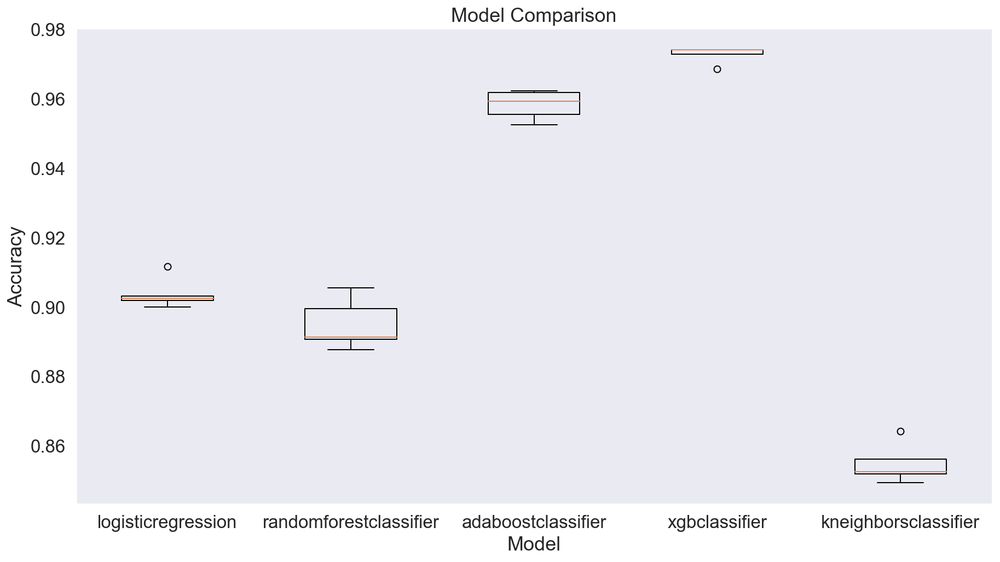

In [53]:
results = {}
from sklearn.model_selection import KFold
for  i, name in list(zip(list(range(len(best))),best.items())):
    kfold = KFold(n_splits=5)
    cv_score = cross_val_score(name[1]['Best Estimator'], x_train,y_train,cv=kfold,scoring='accuracy')
    results[name[0]] = cv_score
    print(f'Average Score of {name[0]}: {cv_score.mean():.4f}')
    print(f'Standard Deviation {name[0]} : {cv_score.std():.4f}')
    print('*' * 60)
pyplot.figure(figsize=(15,8))
pyplot.boxplot(list(results.values()), labels=list(results.keys()))
pyplot.title('Model Comparison')
pyplot.xlabel('Model')
pyplot.ylabel('Accuracy')
pyplot.grid()
pyplot.show()

### Conclusion for Method 1:

After comparing different models, it shows that XGBClassifier performs the best. For the performance of the model to predict if the customer is churned, the precision score is 0.95, the recall score is 0.86, the f1-score is 0.90 and the average cross-validation score is 0.97. 

The above scores will be used to compare with other models with different methods so that we can choose the best method for modeling.

# Method 2: Modeling Using SMOTE (Oversampling)

Oversampling — Duplicating samples from the minority class

In [54]:
# defining target variable & features
x = df.drop('Customer_Churn',axis=1)
y = df['Customer_Churn']

In [55]:
# Using oversampling to deal with imbalance dataset
oversample = SMOTE(random_state=42)
x_smote, y_smote = oversample.fit_resample(x, y)

print(f'''Shape of X before SMOTE: {x.shape}
Shape of X after SMOTE: {x_smote.shape}''')

Shape of X before SMOTE: (10127, 46)
Shape of X after SMOTE: (17000, 46)


In [56]:
# To check if the existing customer class and attrited class is balanced
print('\nBalance of positive and negative classes:')
y_smote.value_counts(normalize=True)


Balance of positive and negative classes:


0    0.5
1    0.5
Name: Customer_Churn, dtype: float64

---
Original Class Distribution:

0:    0.83934

1:    0.16066

New Class Distribution After Applying SMOTE:

0:    0.5

1:    0.5

---

#### Train-test split

In [57]:
x_train, x_test, y_train, y_test = train_test_split(x_smote, y_smote, stratify=y_smote, test_size=0.2, random_state=42)

## Standardization for scaling the variables

In [58]:
scaler = StandardScaler()

# Fit the data using the scaler (scale the data)
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [59]:
type(x_train)

numpy.ndarray

In [60]:
type(x_test)

numpy.ndarray

In [61]:
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

## Modeling

In [62]:
classifiers = [
    ('logisticregression', LogisticRegression(),
     {'penalty': ['l1','l2'], 'C':[0.001,0.01,0.1,1,10,100,1000]}),
    ('randomforestclassifier',RandomForestClassifier(),
    {'n_estimators':[30,40,50],'max_depth': list(range(2,5))}),
    ('adaboostclassifier',AdaBoostClassifier(), {'n_estimators':[10,20,30,40,50,60]}),
    ('xgbclassifier', XGBClassifier(),{'max_depth':list(range(2,5)),'gamma':[0.001,0.01,0.1,1]}),
    ('kneighborsclassifier', KNeighborsClassifier(),
     {'n_neighbors': list(range(2,11,2)), 'algorithm':['ball_tree','kd_tree','brute']}),
    
]

logisticregression
Fitting 5 folds for each of 3 candidates, totalling 15 fits
{'Best param': {'logisticregression__penalty': 'l2', 'logisticregression__C': 10}, 'Best estimator': Pipeline(steps=[('smote', SMOTE(sampling_strategy='minority')),
                ('logisticregression', LogisticRegression(C=10))]), 'Best training score': 0.9366176470588234, 'Model': LogisticRegression(), 'Best testing score': 0.9188235294117647}
Train Result:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      6800
           1       0.96      0.92      0.94      6800

    accuracy                           0.94     13600
   macro avg       0.94      0.94      0.94     13600
weighted avg       0.94      0.94      0.94     13600



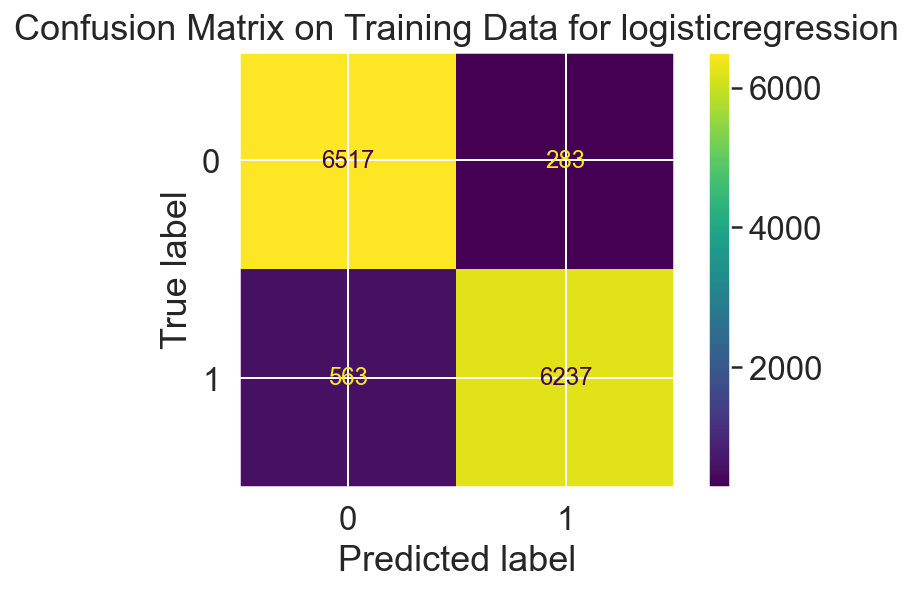

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.92      0.96      0.94      1700
           1       0.96      0.92      0.94      1700

    accuracy                           0.94      3400
   macro avg       0.94      0.94      0.94      3400
weighted avg       0.94      0.94      0.94      3400



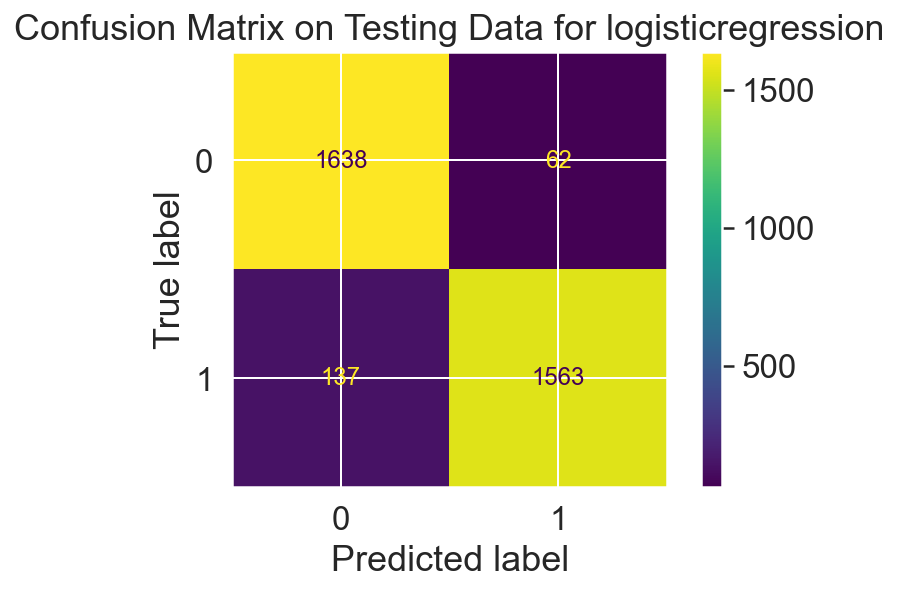

<Figure size 864x864 with 0 Axes>

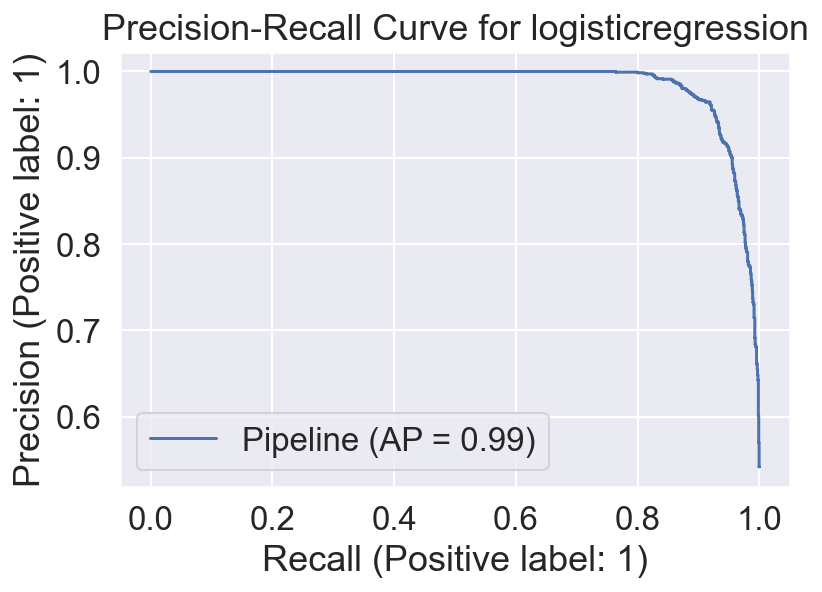

<Figure size 864x864 with 0 Axes>

randomforestclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Feature: Education_Post-Graduate, Score: 0.0
Feature: Income_$120K +, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0
Feature: Card_Category_Silver, Score: 0.0
Feature: Age_Group_68-73, Score: 0.0
Feature: Months_Subscribed_Group_46-50, Score: 7.852794486021444e-06
Feature: Card_Category_Platinum, Score: 1.672435648324216e-05
Feature: Months_Subscribed_Group_13-18, Score: 5.226798887472051e-05
Feature: Education_Doctorate, Score: 8.908887444637665e-05
Feature: Months_Subscribed_Group_19-23, Score: 9.372968845770902e-05
Feature: Dependent_Count, Score: 0.0004864806633725204
Feature: Age_Group_56-61, Score: 0.00068537583004636
Feature: Months_Subscribed_Group_51-56, Score: 0.0008662075183704103
Feature: Age_Group_62-67, Score: 0.001395869754097395
Feature: Age_Group_26-32, Score: 0.001396037601009845
Feature: Education_Uneducated, Score: 0.0015646551125891937
Feature: Age_Group_33-38, Score: 0.001966310

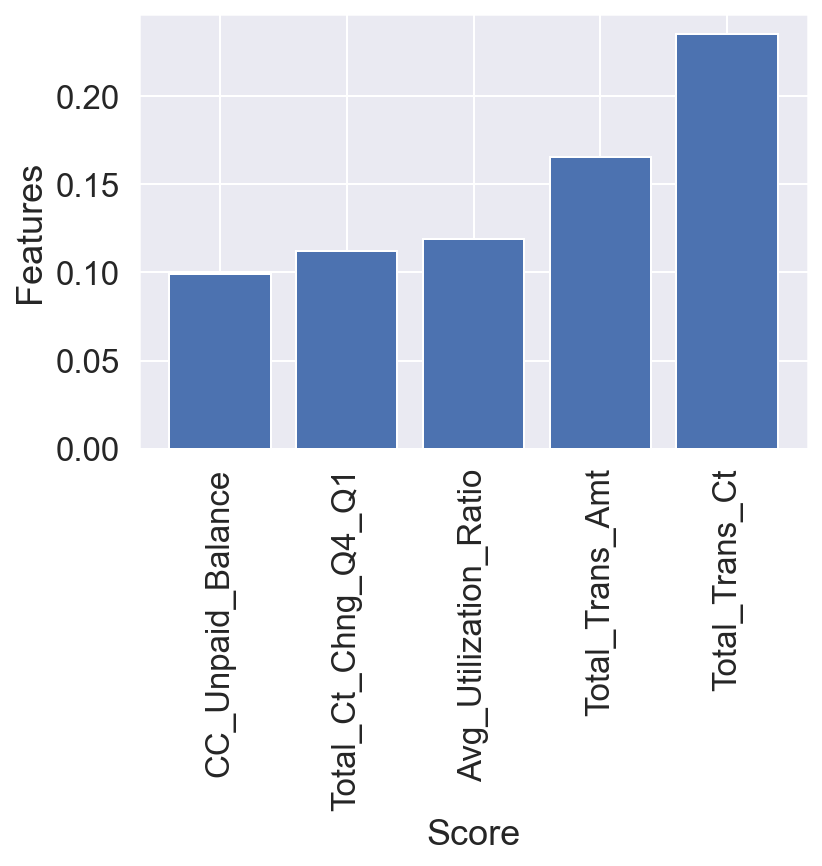

{'Best param': {'randomforestclassifier__n_estimators': 40, 'randomforestclassifier__max_depth': 4}, 'Best estimator': Pipeline(steps=[('smote', SMOTE(sampling_strategy='minority')),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=4, n_estimators=40))]), 'Best training score': 0.9024264705882354, 'Model': RandomForestClassifier(), 'Best testing score': 0.8858823529411765}
Train Result:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90      6800
           1       0.90      0.90      0.90      6800

    accuracy                           0.90     13600
   macro avg       0.90      0.90      0.90     13600
weighted avg       0.90      0.90      0.90     13600



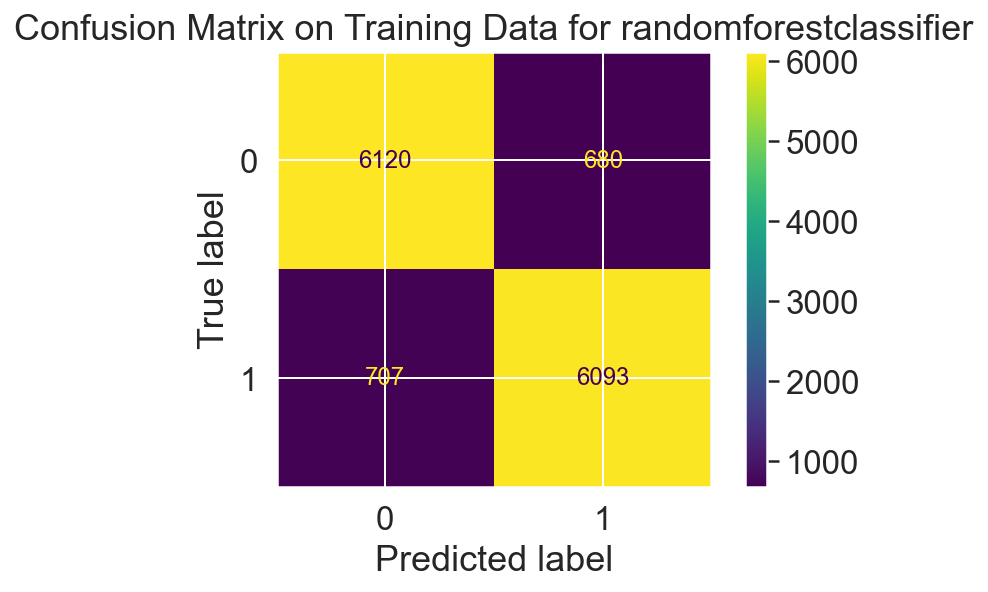

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.90      0.90      0.90      1700
           1       0.90      0.90      0.90      1700

    accuracy                           0.90      3400
   macro avg       0.90      0.90      0.90      3400
weighted avg       0.90      0.90      0.90      3400



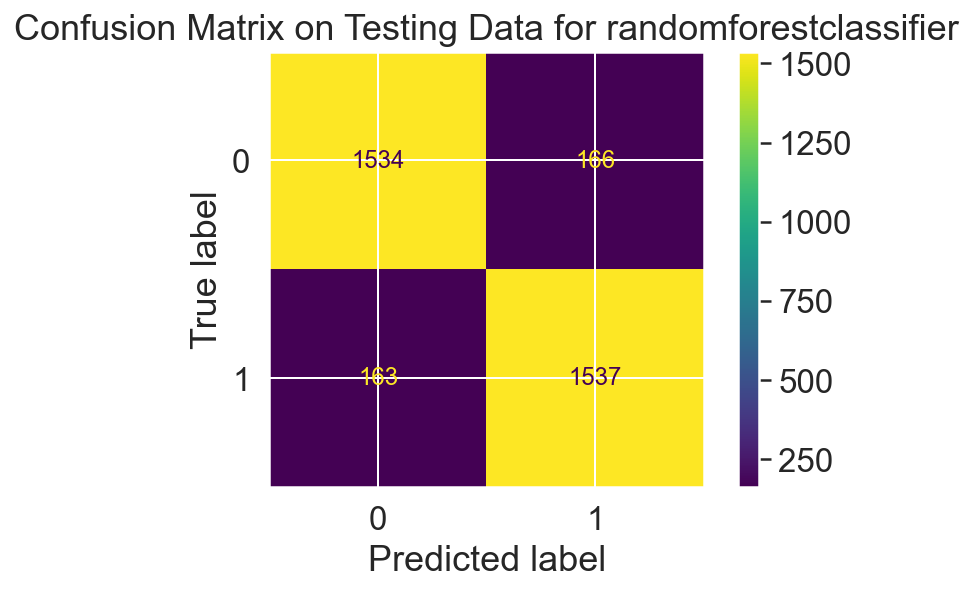

<Figure size 864x864 with 0 Axes>

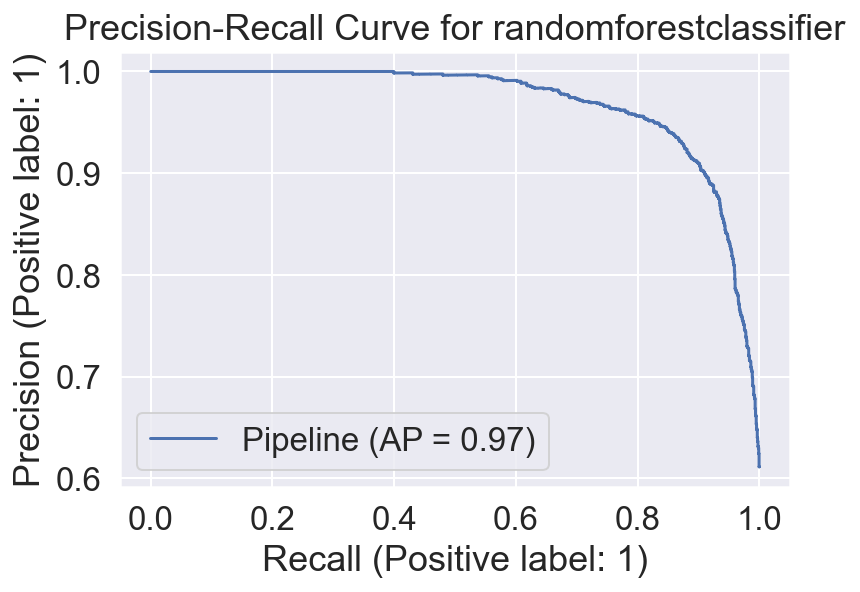

<Figure size 864x864 with 0 Axes>

adaboostclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Feature: Gender, Score: 0.0
Feature: Dependent_Count, Score: 0.0
Feature: Avg_Utilization_Ratio, Score: 0.0
Feature: Education_Doctorate, Score: 0.0
Feature: Education_Post-Graduate, Score: 0.0
Feature: Card_Category_Blue, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0
Feature: Card_Category_Platinum, Score: 0.0
Feature: Card_Category_Silver, Score: 0.0
Feature: Age_Group_68-73, Score: 0.0
Feature: Months_Subscribed_Group_13-18, Score: 0.0
Feature: Months_Subscribed_Group_19-23, Score: 0.0
Feature: Months_Subscribed_Group_30-34, Score: 0.0
Feature: Months_Subscribed_Group_35-39, Score: 0.0
Feature: Months_Subscribed_Group_40-45, Score: 0.0
Feature: Months_Subscribed_Group_46-50, Score: 0.0
Feature: Months_Subscribed_Group_51-56, Score: 0.0
Feature: Inactive_Months, Score: 0.016666666666666666
Feature: Credit_Limit, Score: 0.016666666666666666
Feature: Education_College, Score: 0.016666666666666666
Featur

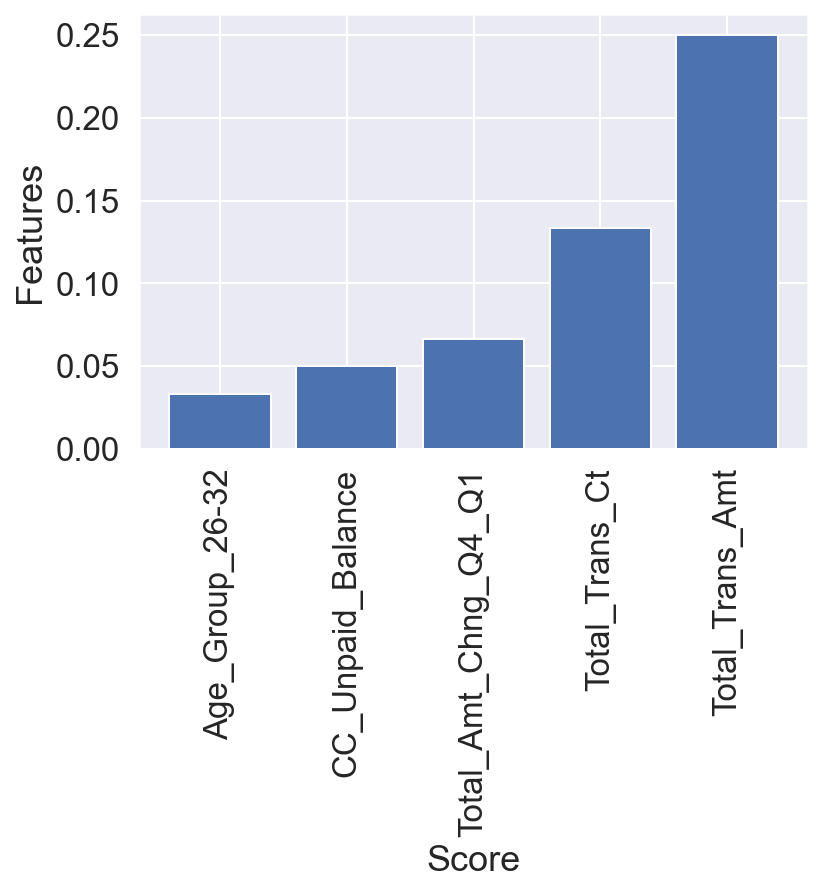

{'Best param': {'adaboostclassifier__n_estimators': 60}, 'Best estimator': Pipeline(steps=[('smote', SMOTE(sampling_strategy='minority')),
                ('adaboostclassifier', AdaBoostClassifier(n_estimators=60))]), 'Best training score': 0.9646323529411764, 'Model': AdaBoostClassifier(), 'Best testing score': 0.9688235294117648}
Train Result:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      6800
           1       0.96      0.97      0.97      6800

    accuracy                           0.97     13600
   macro avg       0.97      0.97      0.97     13600
weighted avg       0.97      0.97      0.97     13600



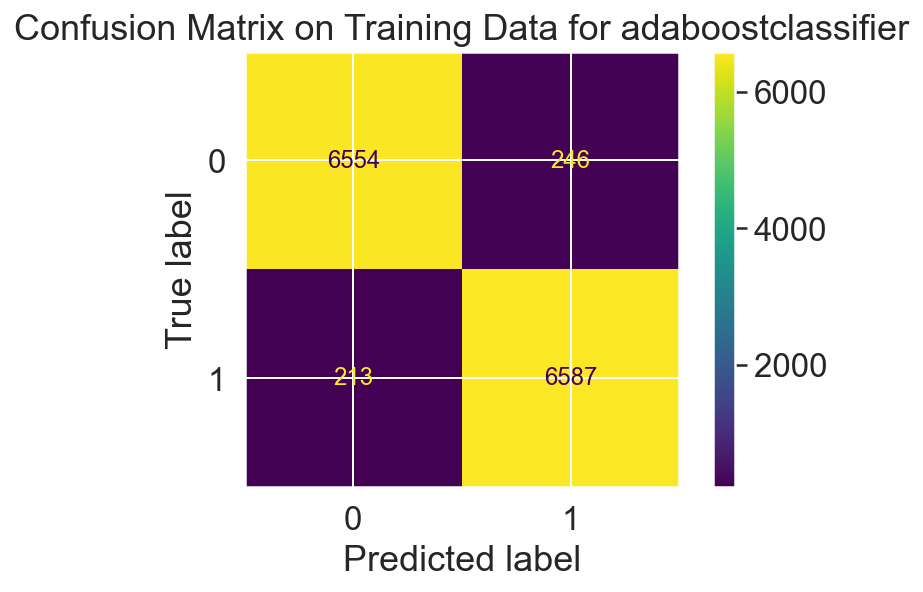

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.97      0.96      0.97      1700
           1       0.96      0.97      0.97      1700

    accuracy                           0.97      3400
   macro avg       0.97      0.97      0.97      3400
weighted avg       0.97      0.97      0.97      3400



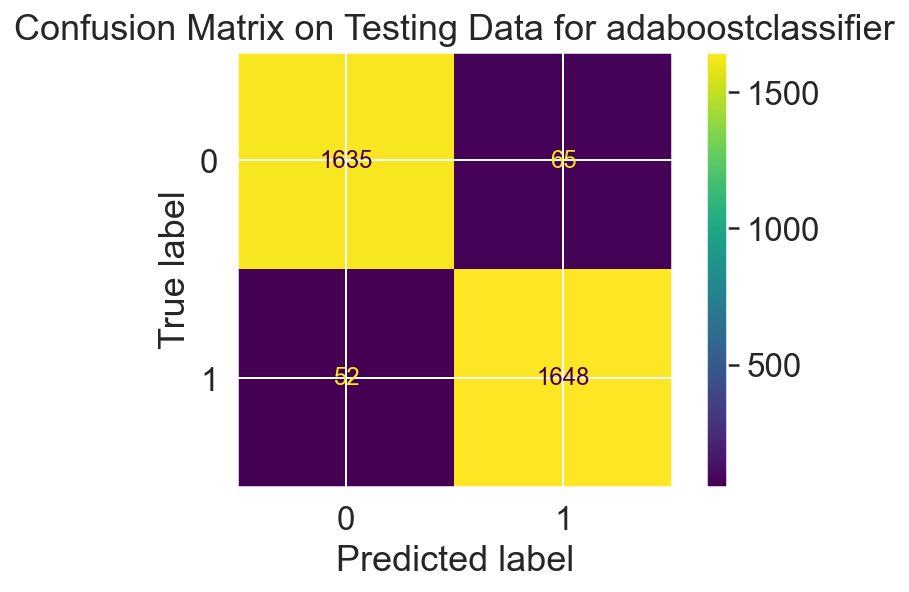

<Figure size 864x864 with 0 Axes>

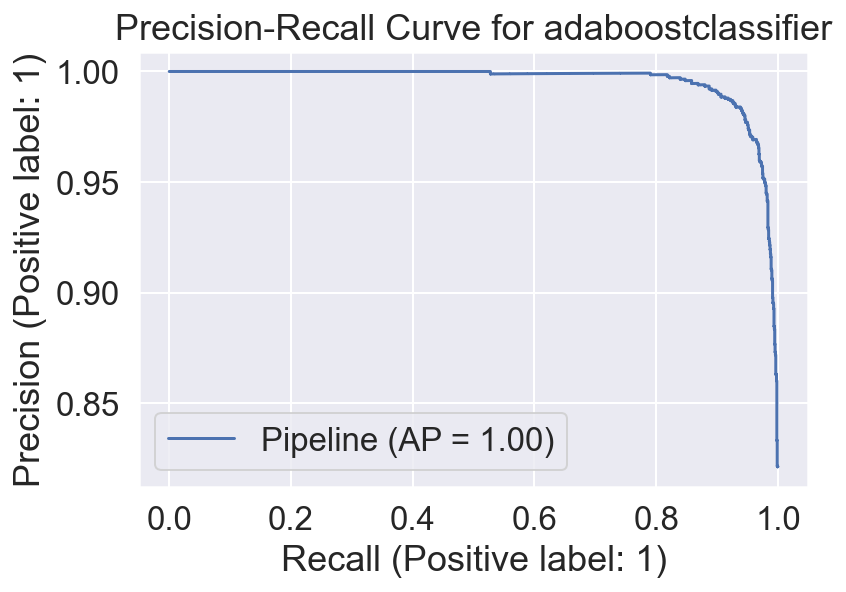

<Figure size 864x864 with 0 Axes>

xgbclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/leelong

/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will b

[22:15:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Feature: Education_Post-Graduate, Score: 0.0
Feature: Card_Category_Platinum, Score: 0.0
Feature: Age_Group_68-73, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0013104630634188652
Feature: Months_Subscribed_Group_13-18, Score: 0.0018730011070147157
Feature: Card_Category_Silver, Score: 0.001989568118005991
Feature: Education_Doctorate, Score: 0.002468621823936701
Feature: Card_Category_Blue, Score: 0.003429827280342579
Feature: Months_Subscribed_Group_19-23, Score: 0.0035638129338622093
Feature: Months_Subscribed_Group_51-56, Score: 0.003808817593380809
Feature: Months_Subscribed_Group_46-50, Score: 0.004110350273549557
Feature: Gender, Score: 0.004797452595084906
Feature: Income_$120K +, Score: 0.00482

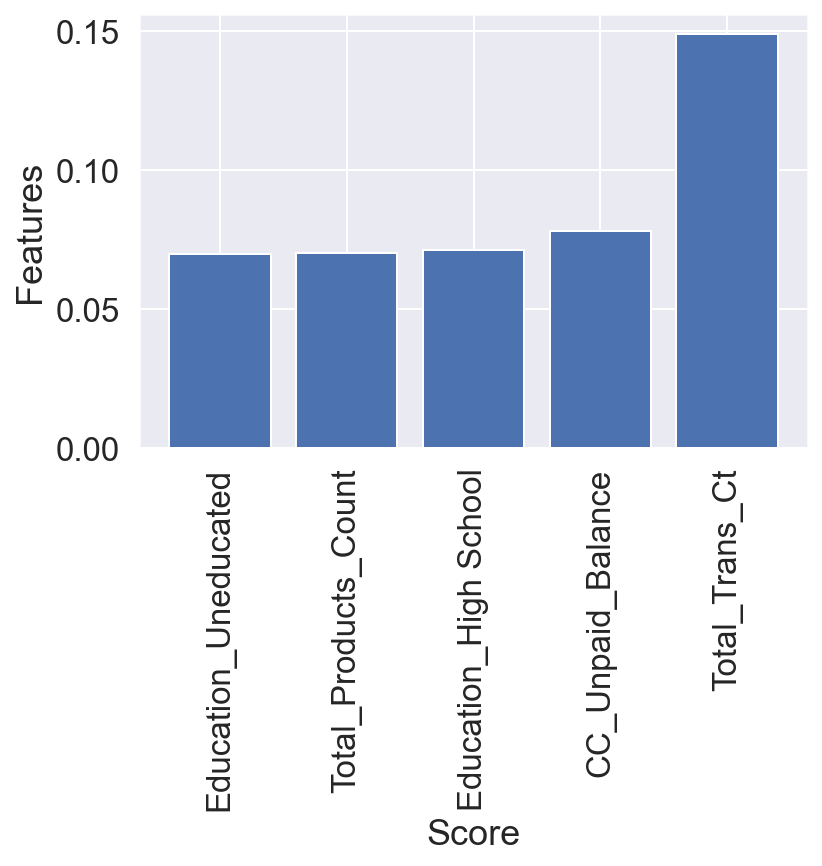

[22:15:12] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:15:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:15:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'Best param': {'xgbclassifier__max_depth': 3, 'xgbclassifier__gamma': 1}, 'Best estimator': Pipeline(steps=[('smote', SMOTE(sampling_strategy='mino

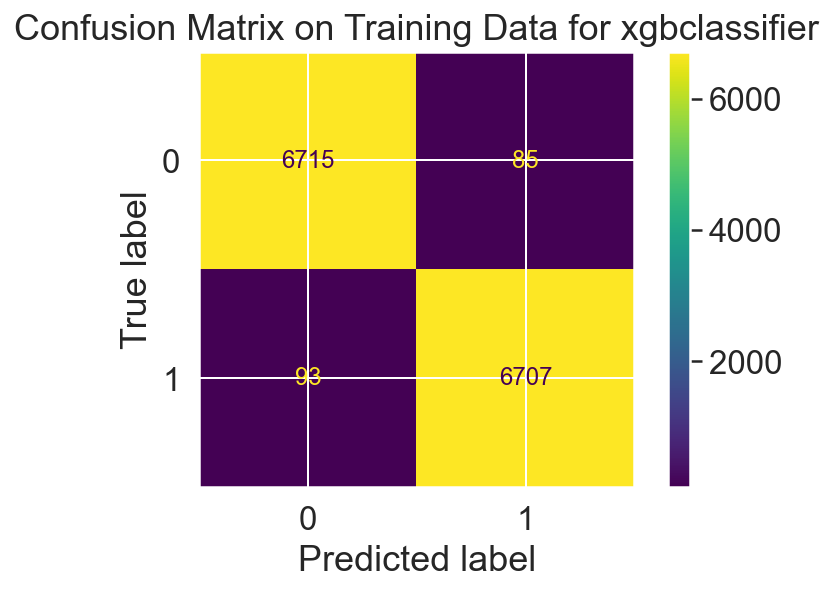

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1700
           1       0.98      0.98      0.98      1700

    accuracy                           0.98      3400
   macro avg       0.98      0.98      0.98      3400
weighted avg       0.98      0.98      0.98      3400



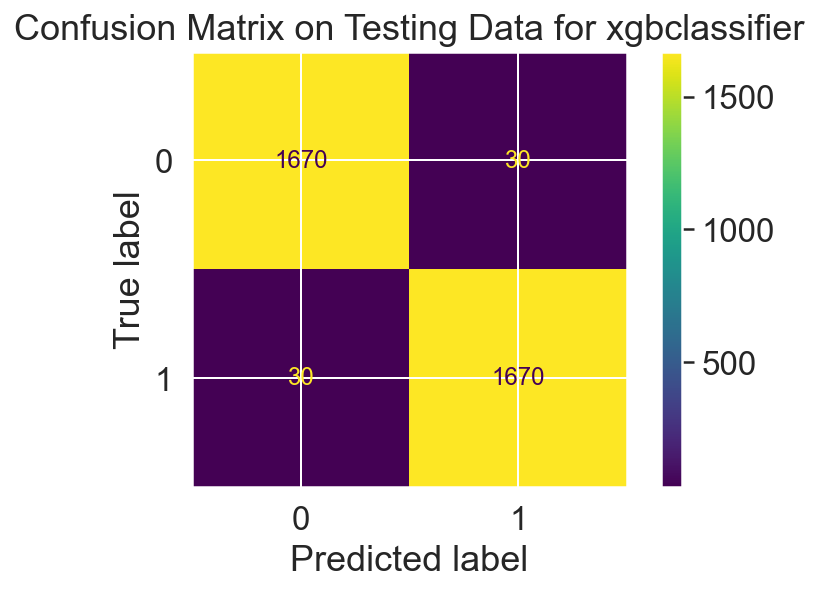

<Figure size 864x864 with 0 Axes>

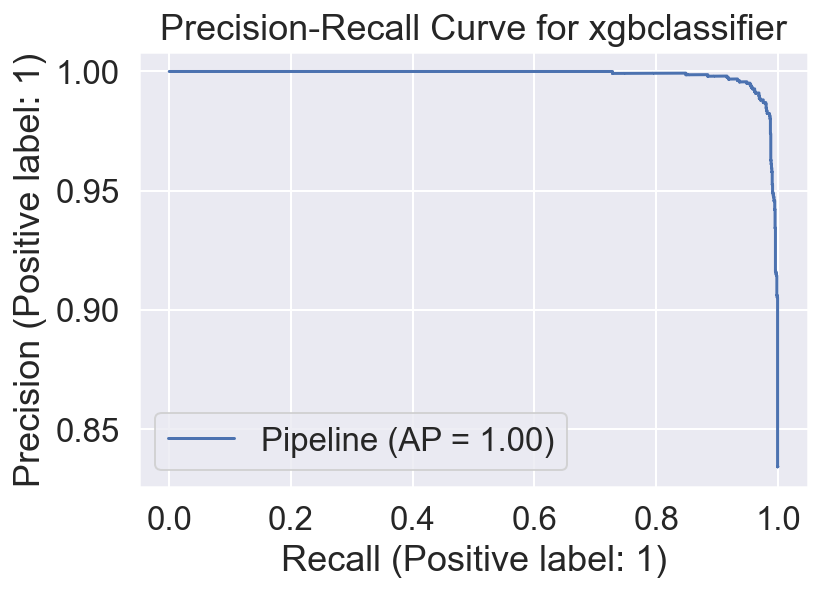

<Figure size 864x864 with 0 Axes>

kneighborsclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
{'Best param': {'kneighborsclassifier__n_neighbors': 10, 'kneighborsclassifier__algorithm': 'kd_tree'}, 'Best estimator': Pipeline(steps=[('smote', SMOTE(sampling_strategy='minority')),
                ('kneighborsclassifier',
                 KNeighborsClassifier(algorithm='kd_tree', n_neighbors=10))]), 'Best training score': 0.9116911764705881, 'Model': KNeighborsClassifier(), 'Best testing score': 0.8464705882352941}
Train Result:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92      6800
           1       0.98      0.85      0.91      6800

    accuracy                           0.92     13600
   macro avg       0.92      0.92      0.92     13600
weighted avg       0.92      0.92      0.92     13600



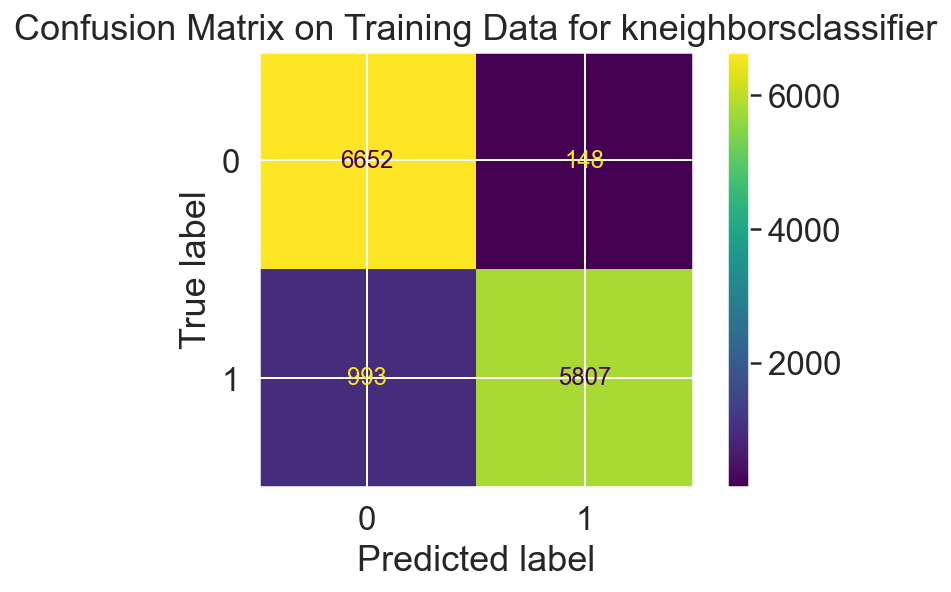

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92      1700
           1       0.97      0.85      0.90      1700

    accuracy                           0.91      3400
   macro avg       0.92      0.91      0.91      3400
weighted avg       0.92      0.91      0.91      3400



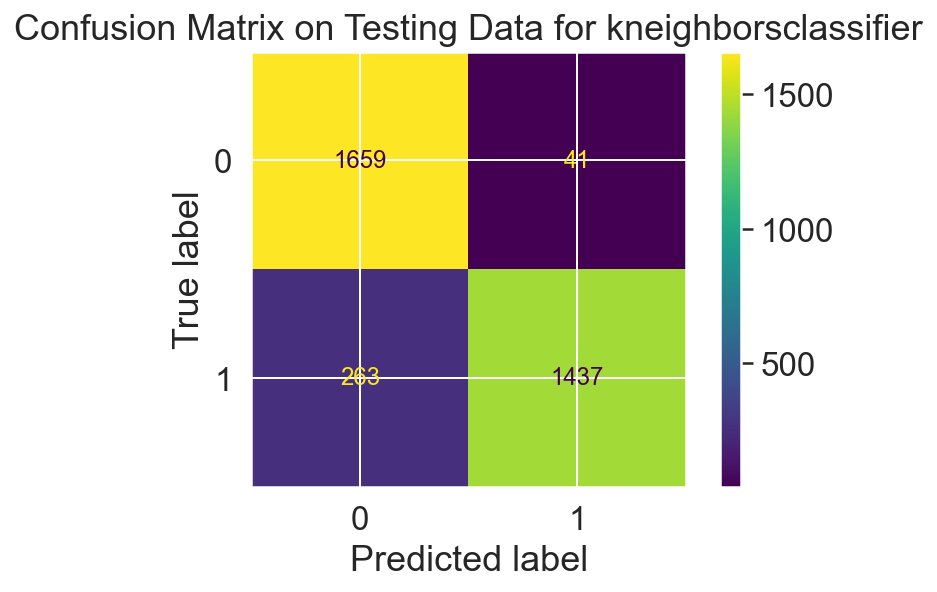

<Figure size 864x864 with 0 Axes>

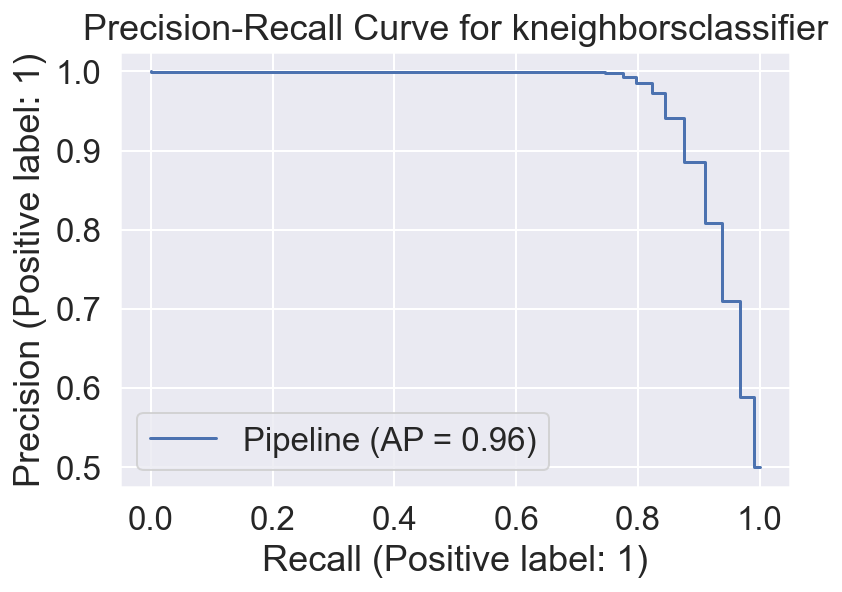

<Figure size 864x864 with 0 Axes>

In [63]:
kf = KFold(n_splits=3, random_state=42, shuffle=True)
model_dict = {}
best_param_model = { i[0] : {} for i in classifiers}
for i, model in zip(list(range(len(classifiers))), classifiers):
    print(model[0])
    imba_pipeline = make_pipeline(SMOTE(sampling_strategy='minority'), model[1])
    new_params = {model[0] + '__' + key : model[2][key] for key in model[2] }
    grid_imba = RandomizedSearchCV(imba_pipeline,new_params, n_iter=3,random_state=42, verbose=1, n_jobs=-1)
    grid_imba.fit(x_train,y_train)
    
        # To check the features importance in the model
    try:
        importance = grid_imba.best_estimator_._final_estimator.feature_importances_
        importance_dict = dict(zip(x.columns,importance))
        sorted_dict = dict(sorted(importance_dict.items(), key=lambda item: item[1]))
        
        # To find out the features that is unimportant in the model
#         for i,v in zip(x.columns, importance):
        for i, v in sorted_dict.items():
        
            print(f'Feature: {i}, Score: {v}')
        # plot feature importance
        pyplot.bar(list(sorted_dict.keys())[-5:], list(sorted_dict.values())[-5:])
        pyplot.xlabel('Score')
        pyplot.ylabel('Features')
        pyplot.xticks(rotation=90)
        pyplot.show()
        
    except:
        None
    
    model_dict[model[0]] = {'Best param': grid_imba.best_params_,
                           'Best estimator': grid_imba.best_estimator_,
                           'Best training score' : grid_imba.best_score_,
                           'Model': model[1],
                           'Best testing score': recall_score(y_test,grid_imba.predict(x_test))}

    score = {'accuracy' : [],
             'precision' : [],
             'recall' : [],
             'f1' : []
            }
    for train_fold_index,val_fold_index in kf.split(x_train,y_train):
        x_train_fold, y_train_fold = x_train.iloc[train_fold_index], y_train.iloc[train_fold_index]
        x_val_fold, y_val_fold = x_train.iloc[val_fold_index], y_train.iloc[val_fold_index]
        pipeline = model_dict[model[0]]['Best estimator']
        pipeline.fit(x_train_fold,y_train_fold)
        
        y_pred = pipeline.predict(x_val_fold)
        
        score['accuracy'].append(pipeline.score(x_val_fold,y_val_fold))
        score['precision'].append(precision_score(y_val_fold, y_pred))
        score['recall'].append(recall_score(y_val_fold, y_pred))
        score['f1'].append(f1_score(y_val_fold,y_pred))
   
    for key, ls in score.items():
        best_param_model[model[0]][key] = np.mean(ls)
    
    print(model_dict[model[0]])
    train_prediction = model_dict[model[0]]['Best estimator'].predict(x_train)
    test_prediction = model_dict[model[0]]['Best estimator'].predict(x_test)
    print('Train Result:')
    print(classification_report(y_train,train_prediction))
    
    metrics.plot_confusion_matrix(model_dict[model[0]]['Best estimator'],x_train, y_train)
    plt.title('Confusion Matrix on Training Data for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()
    
    print('Test Result:')
    print(classification_report(y_test,test_prediction))
    metrics.plot_confusion_matrix(model_dict[model[0]]['Best estimator'],x_test, y_test)
    plt.title('Confusion Matrix on Testing Data for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()
    
    probs = model_dict[model[0]]['Best estimator'].predict_proba(x_test)[:,1]
    average_precision = metrics.average_precision_score(y_test,probs)
    metrics.plot_precision_recall_curve(model_dict[model[0]]['Best estimator'],x_test,y_test)
    plt.title('Precision-Recall Curve for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()

# Model Comparison For Method 2

In [64]:
# To select the best parameter for each model
best = {}
for name, model, param in classifiers:
    grid_cv = GridSearchCV(model,param)
    grid_cv.fit(x_train,y_train)
    y_pred = grid_cv.predict(x_test)
    test_accuracy = accuracy_score(y_test,y_pred)
    best[name] = {'Model': model,'Best Training Score': grid_cv.best_score_, 'Testing Score': test_accuracy,'Best Estimator': grid_cv.best_estimator_}

[22:16:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:10] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:11] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:16:22] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:23] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:23] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:23] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:16:34] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:16:35] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [65]:
#To check the result of Grid Search
model_dict = best
pp.pprint(model_dict)

{   'adaboostclassifier': {   'Best Estimator': AdaBoostClassifier(n_estimators=60),
                              'Best Training Score': 0.9646323529411764,
                              'Model': AdaBoostClassifier(),
                              'Testing Score': 0.9652941176470589},
    'kneighborsclassifier': {   'Best Estimator': KNeighborsClassifier(algorithm='ball_tree', n_neighbors=10),
                                'Best Training Score': 0.9116911764705881,
                                'Model': KNeighborsClassifier(),
                                'Testing Score': 0.9117647058823529},
    'logisticregression': {   'Best Estimator': LogisticRegression(C=1000),
                              'Best Training Score': 0.9366911764705883,
                              'Model': LogisticRegression(),
                              'Testing Score': 0.9402941176470588},
    'randomforestclassifier': {   'Best Estimator': RandomForestClassifier(max_depth=4, n_estimators=50),
        

Average Score of logisticregression: 0.9368
Standard Deviation logisticregression : 0.0030
************************************************************
Average Score of randomforestclassifier: 0.9007
Standard Deviation randomforestclassifier : 0.0080
************************************************************
Average Score of adaboostclassifier: 0.9637
Standard Deviation adaboostclassifier : 0.0034
************************************************************
[22:17:51] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:17:52] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd li

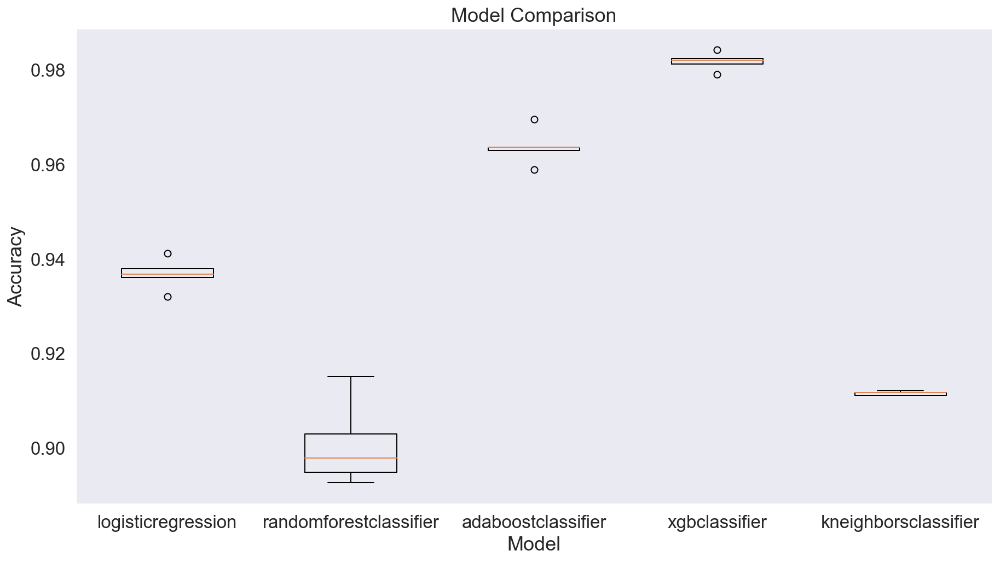

In [66]:
results = {}
from sklearn.model_selection import KFold
for  i, name in list(zip(list(range(len(best))),best.items())):
    kfold = KFold(n_splits=5)
    cv_score = cross_val_score(name[1]['Best Estimator'], x_train,y_train,cv=kfold,scoring='accuracy')
    results[name[0]] = cv_score
    print(f'Average Score of {name[0]}: {cv_score.mean():.4f}')
    print(f'Standard Deviation {name[0]} : {cv_score.std():.4f}')
    print('*' * 60)
pyplot.figure(figsize=(15,8))
pyplot.boxplot(list(results.values()), labels=list(results.keys()))
pyplot.title('Model Comparison')
pyplot.xlabel('Model')
pyplot.ylabel('Accuracy')
pyplot.grid()
pyplot.show()

### Conclusion for method 2:


After comparing different models, it shows that XGBClassifier performs the best. For the performance of the model to predict if the customer is churned, the precision score is 0.98, the recall score is 0.98, the f1-score is 0.98 and the average cross-validation score is 0.98. 

The above scores will be used to compare with other models with different methods so that we can choose the best method for modeling.

## Modeling Using NearMiss (Undersampling)

Undersampling — Deleting samples from the majority class.

Reference:
https://machinelearningmastery.com/undersampling-algorithms-for-imbalanced-classification/

In [67]:
# defining target variable & features
x = df.drop('Customer_Churn',axis=1)
y = df['Customer_Churn']

In [68]:
# Using oversampling to deal with imbalance dataset
undersample = NearMiss(version=3)
x_nearmiss, y_nearmiss = undersample.fit_resample(x, y)

In [69]:
print(f'''Shape of X before NearMiss: {x.shape}
Shape of X after NearMiss: {x_nearmiss.shape}''')

Shape of X before NearMiss: (10127, 46)
Shape of X after NearMiss: (3254, 46)


In [70]:
# To check if the existing customer class and attrited class is balanced
print('\nBalance of positive and negative classes:')
y_nearmiss.value_counts(normalize=True)


Balance of positive and negative classes:


0    0.5
1    0.5
Name: Customer_Churn, dtype: float64

---
Original Class Distribution:

0:    0.83934

1:    0.16066

New Class Distribution After Applying SMOTE:

0:    0.5

1:    0.5

---

#### Train Test Split

In [71]:
x_train, x_test, y_train, y_test = train_test_split(x_nearmiss, y_nearmiss, stratify=y_nearmiss, test_size=0.2, random_state=42)

## Standardization for scaling the variables

In [72]:
scaler = StandardScaler()

# Fit the data using the scaler (scale the data)
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [73]:
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)

## Modeling

In [74]:
classifiers = [
    ('logisticregression', LogisticRegression(),
     {'penalty': ['l1','l2'], 'C':[0.001,0.01,0.1,1,10,100,1000]}),
    ('randomforestclassifier',RandomForestClassifier(),
    {'n_estimators':[30,40,50],'max_depth': list(range(2,5))}),
    ('adaboostclassifier',AdaBoostClassifier(), {'n_estimators':[10,20,30,40,50,60]}),
    ('xgbclassifier', XGBClassifier(),{'max_depth':list(range(2,5)),'gamma':[0.001,0.01,0.1,1]}),
    ('kneighborsclassifier', KNeighborsClassifier(),
     {'n_neighbors': list(range(2,11,2)), 'algorithm':['ball_tree','kd_tree','brute']}),
    
]

logisticregression
Fitting 5 folds for each of 3 candidates, totalling 15 fits
{'Best param': {'logisticregression__penalty': 'l2', 'logisticregression__C': 100}, 'Best estimator': Pipeline(steps=[('nearmiss', NearMiss(version=2)),
                ('logisticregression', LogisticRegression(C=100))]), 'Best training score': 0.8082939613169939, 'Model': LogisticRegression(), 'Best testing score': 0.8215384615384616}
Train Result:
              precision    recall  f1-score   support

           0       0.82      0.82      0.82      1301
           1       0.82      0.82      0.82      1302

    accuracy                           0.82      2603
   macro avg       0.82      0.82      0.82      2603
weighted avg       0.82      0.82      0.82      2603



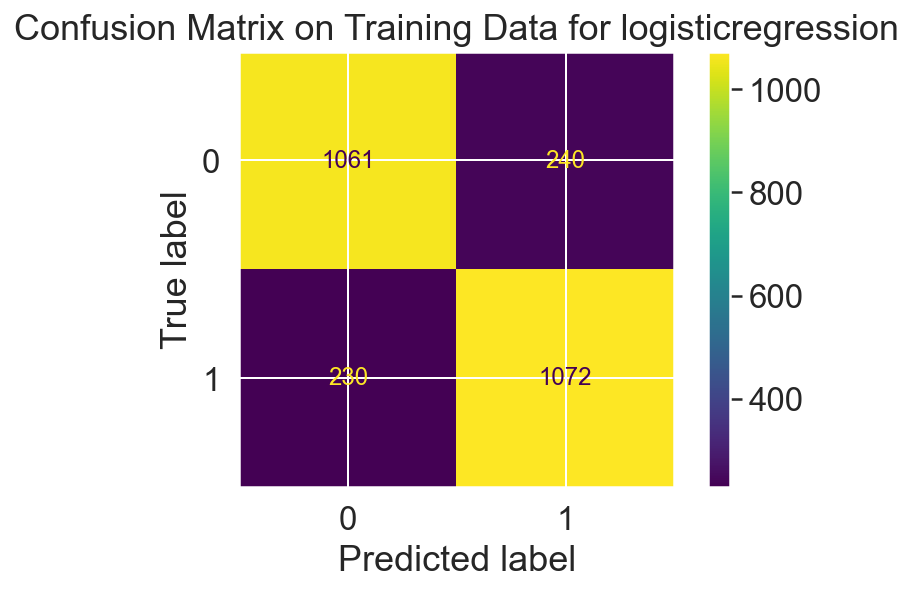

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.81      0.79      0.80       326
           1       0.80      0.82      0.81       325

    accuracy                           0.80       651
   macro avg       0.81      0.80      0.80       651
weighted avg       0.81      0.80      0.80       651



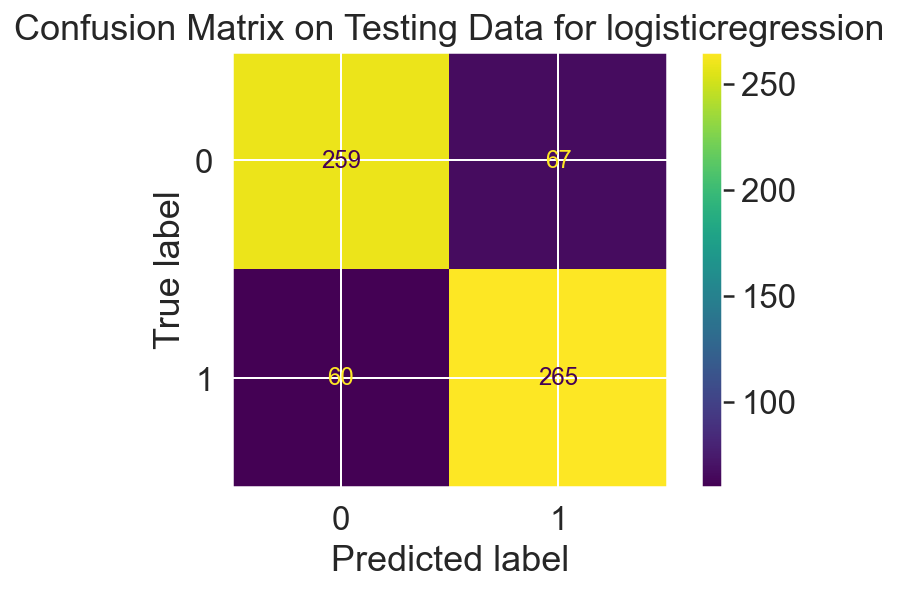

<Figure size 864x864 with 0 Axes>

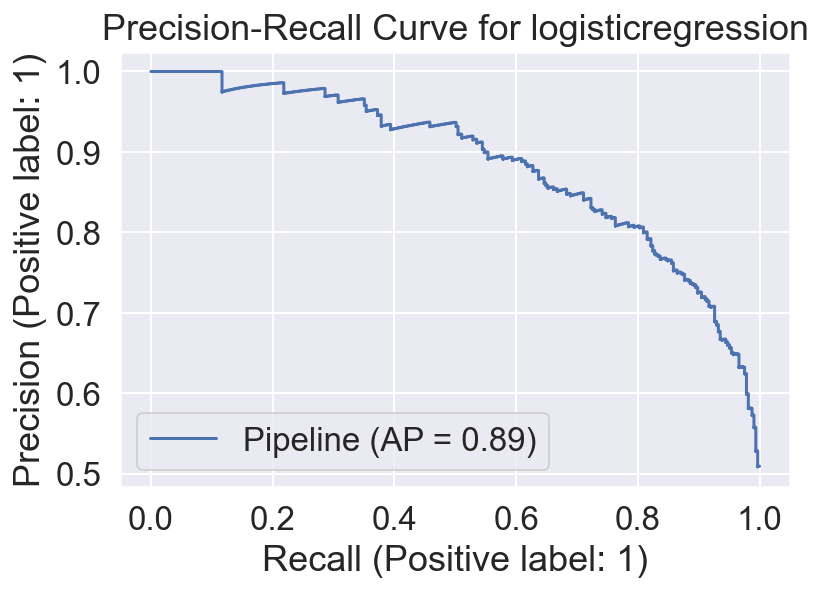

<Figure size 864x864 with 0 Axes>

randomforestclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Feature: Card_Category_Platinum, Score: 0.0
Feature: Age_Group_68-73, Score: 0.0
Feature: Months_Subscribed_Group_46-50, Score: 0.0
Feature: Marital_Status_Divorced, Score: 0.00014180263175141806
Feature: Card_Category_Silver, Score: 0.00018687022549534067
Feature: Months_Subscribed_Group_40-45, Score: 0.00018934859795934777
Feature: Months_Subscribed_Group_30-34, Score: 0.0003150418356339784
Feature: Age_Group_62-67, Score: 0.0003334581225337474
Feature: Age_Group_51-55, Score: 0.00041626622314457583
Feature: Education_Graduate, Score: 0.00044248442138357353
Feature: Education_Post-Graduate, Score: 0.0004986915482081175
Feature: Months_Subscribed_Group_51-56, Score: 0.0005538173407532247
Feature: Education_Uneducated, Score: 0.0006001319601942519
Feature: Education_Doctorate, Score: 0.0006010119395773591
Feature: Income_$80K - $120K, Score: 0.0006466809506015383
Feature: Education_College, Score: 0.0008

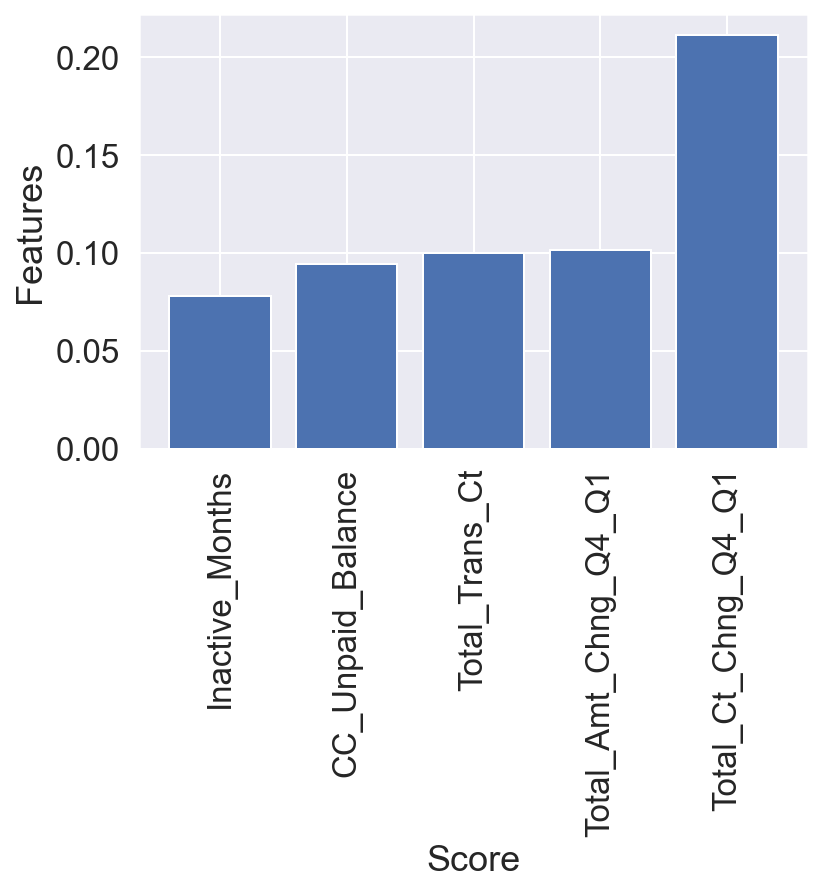

{'Best param': {'randomforestclassifier__n_estimators': 40, 'randomforestclassifier__max_depth': 4}, 'Best estimator': Pipeline(steps=[('nearmiss', NearMiss(version=2)),
                ('randomforestclassifier',
                 RandomForestClassifier(max_depth=4, n_estimators=40))]), 'Best training score': 0.8244249224863427, 'Model': RandomForestClassifier(), 'Best testing score': 0.7753846153846153}
Train Result:
              precision    recall  f1-score   support

           0       0.81      0.84      0.82      1301
           1       0.83      0.80      0.81      1302

    accuracy                           0.82      2603
   macro avg       0.82      0.82      0.82      2603
weighted avg       0.82      0.82      0.82      2603



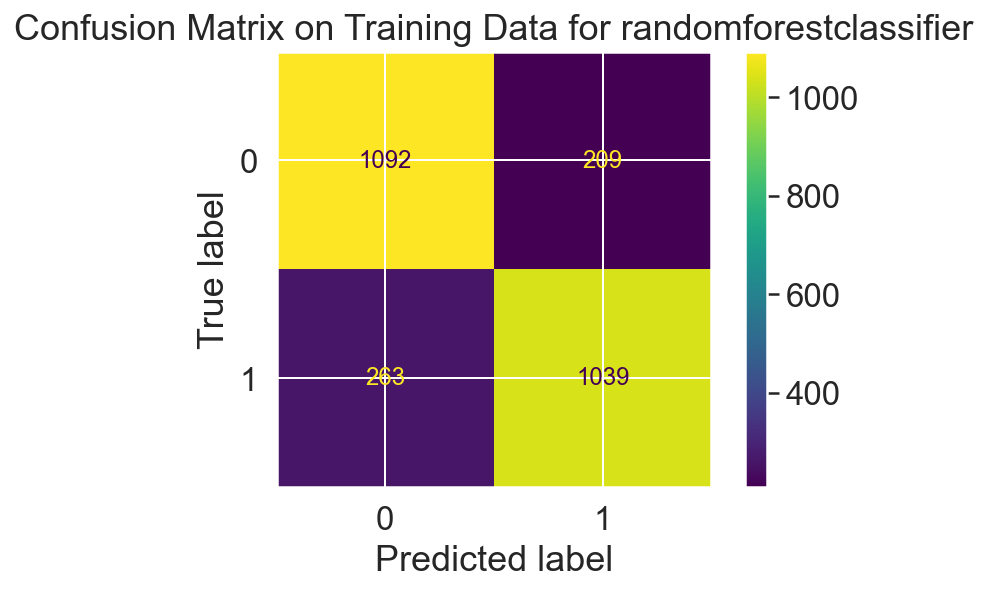

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.78      0.83      0.80       326
           1       0.81      0.77      0.79       325

    accuracy                           0.80       651
   macro avg       0.80      0.80      0.80       651
weighted avg       0.80      0.80      0.80       651



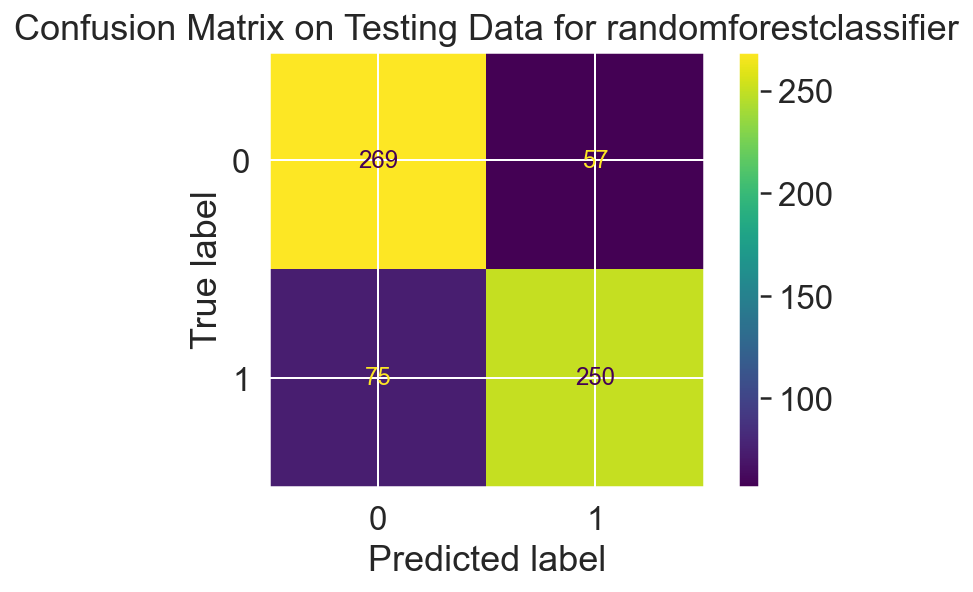

<Figure size 864x864 with 0 Axes>

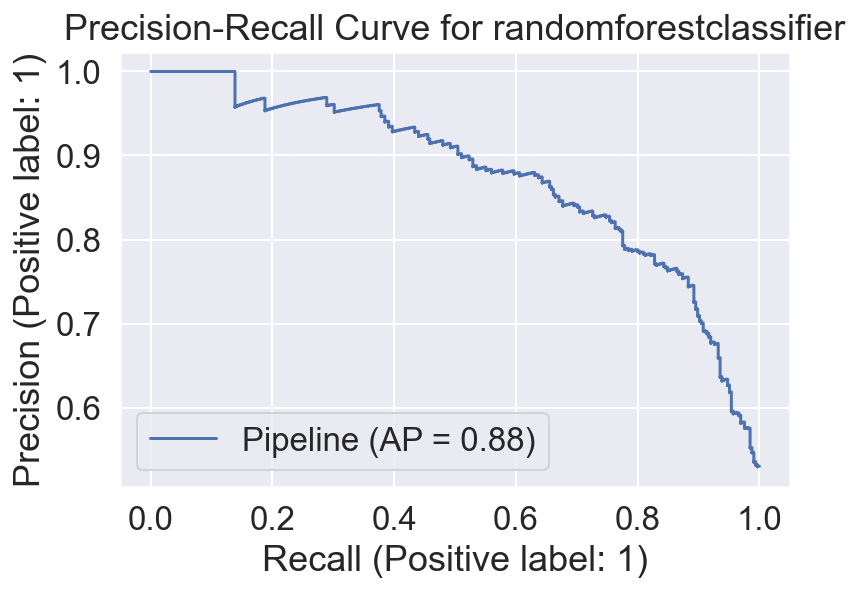

<Figure size 864x864 with 0 Axes>

adaboostclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
Feature: Education_College, Score: 0.0
Feature: Education_Doctorate, Score: 0.0
Feature: Education_Graduate, Score: 0.0
Feature: Education_High School, Score: 0.0
Feature: Education_Post-Graduate, Score: 0.0
Feature: Education_Uneducated, Score: 0.0
Feature: Income_$120K +, Score: 0.0
Feature: Income_$40K - $60K, Score: 0.0
Feature: Income_$60K - $80K, Score: 0.0
Feature: Income_$80K - $120K, Score: 0.0
Feature: Income_Less than $40K, Score: 0.0
Feature: Marital_Status_Divorced, Score: 0.0
Feature: Marital_Status_Single, Score: 0.0
Feature: Card_Category_Blue, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0
Feature: Card_Category_Platinum, Score: 0.0
Feature: Card_Category_Silver, Score: 0.0
Feature: Age_Group_39-44, Score: 0.0
Feature: Age_Group_45-50, Score: 0.0
Feature: Age_Group_51-55, Score: 0.0
Feature: Age_Group_56-61, Score: 0.0
Feature: Age_Group_62-67, Score: 0.0
Feature: Age_Group_68-73, Score:

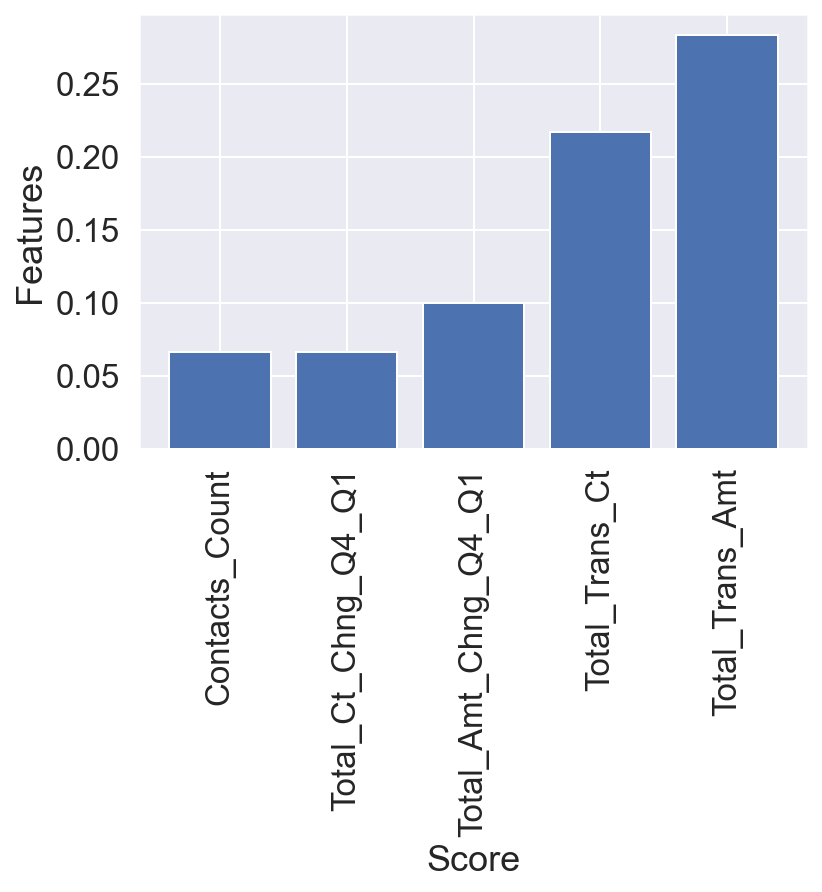

{'Best param': {'adaboostclassifier__n_estimators': 60}, 'Best estimator': Pipeline(steps=[('nearmiss', NearMiss(version=2)),
                ('adaboostclassifier', AdaBoostClassifier(n_estimators=60))]), 'Best training score': 0.8970478369998525, 'Model': AdaBoostClassifier(), 'Best testing score': 0.8892307692307693}
Train Result:
              precision    recall  f1-score   support

           0       0.91      0.90      0.91      1301
           1       0.91      0.91      0.91      1302

    accuracy                           0.91      2603
   macro avg       0.91      0.91      0.91      2603
weighted avg       0.91      0.91      0.91      2603



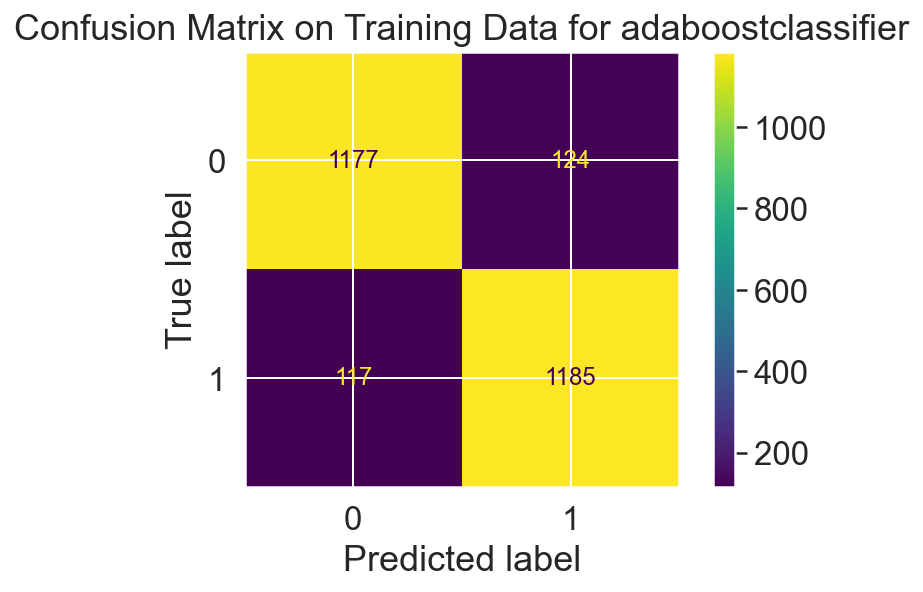

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.90      0.83      0.86       326
           1       0.84      0.90      0.87       325

    accuracy                           0.87       651
   macro avg       0.87      0.87      0.87       651
weighted avg       0.87      0.87      0.87       651



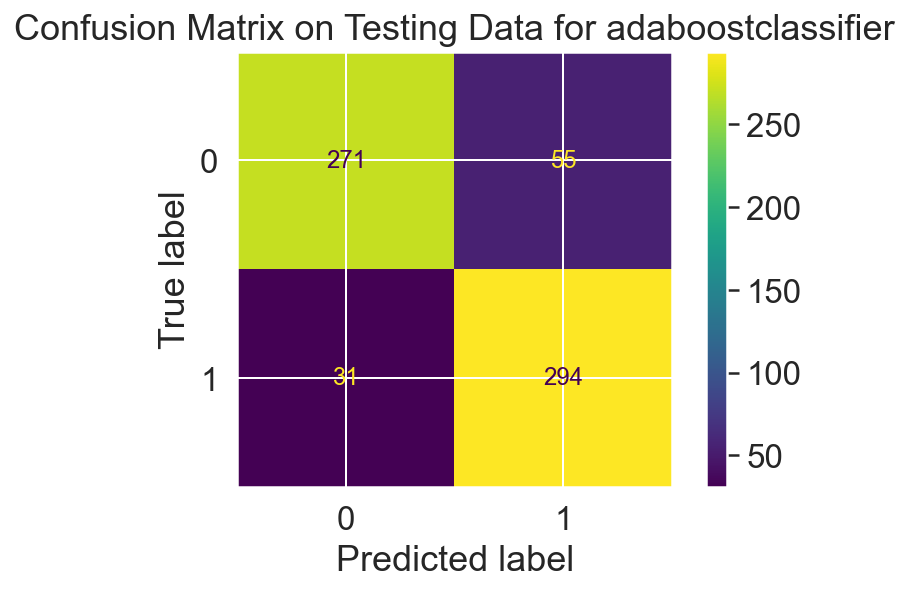

<Figure size 864x864 with 0 Axes>

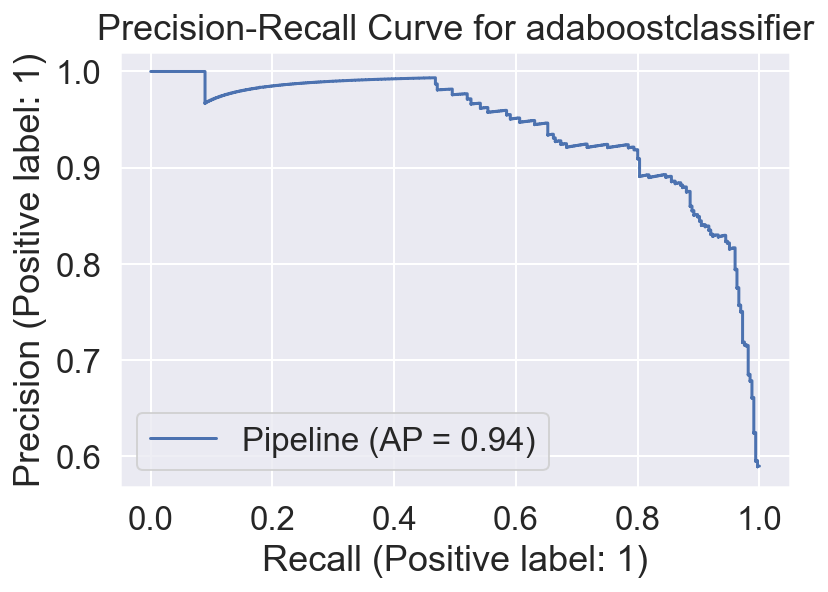

<Figure size 864x864 with 0 Axes>

xgbclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits


/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will b

/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/data.py:262: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):
/Users/leelonghei/opt/anaconda3/envs/CapstoneEnvDSI21/lib/python3.9/site-packages/xgboost/sklearn.py:1224: UserWarning: The use of label encoder in XGBClassifier is deprecated and will b

[22:18:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Feature: Education_College, Score: 0.0
Feature: Education_Doctorate, Score: 0.0
Feature: Education_Graduate, Score: 0.0
Feature: Education_High School, Score: 0.0
Feature: Education_Post-Graduate, Score: 0.0
Feature: Income_$120K +, Score: 0.0
Feature: Income_$40K - $60K, Score: 0.0
Feature: Income_$80K - $120K, Score: 0.0
Feature: Income_Less than $40K, Score: 0.0
Feature: Card_Category_Blue, Score: 0.0
Feature: Card_Category_Gold, Score: 0.0
Feature: Card_Category_Platinum, Score: 0.0
Feature: Card_Category_Silver, Score: 0.0
Feature: Age_Group_39-44, Score: 0.0
Feature: Age_Group_51-55, Score: 0.0
Feature: Age_Group_62-67, Score: 0.0
Feature: Age_Group_68-73, Score: 0.0
Feature: Months_Subscribed_Group_1

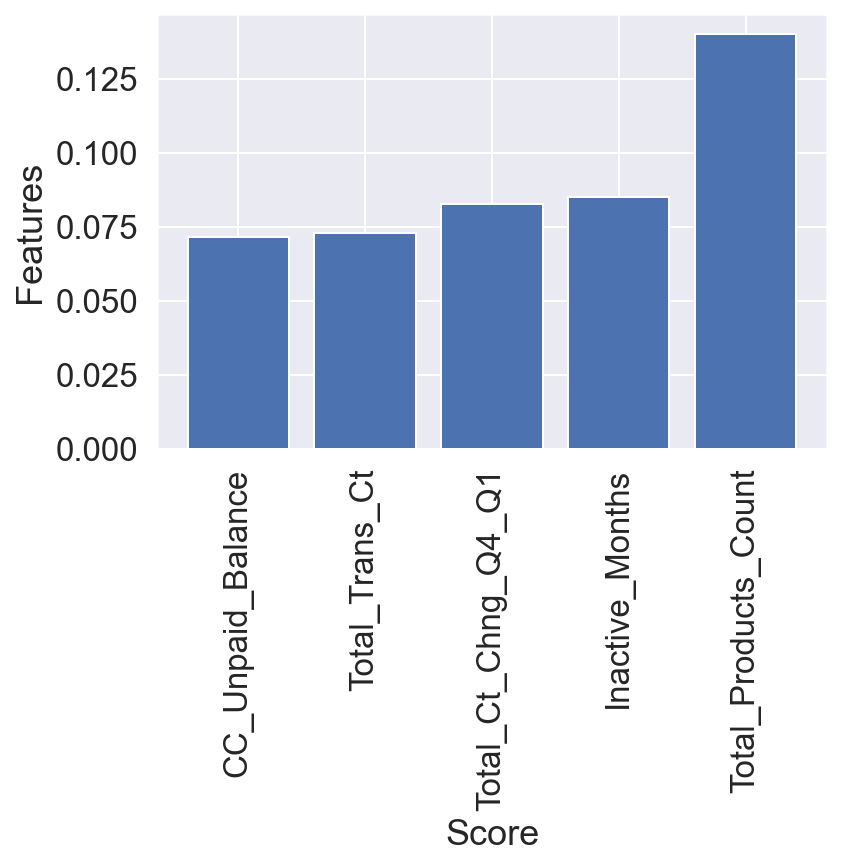

[22:18:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:08] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:09] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
{'Best param': {'xgbclassifier__max_depth': 3, 'xgbclassifier__gamma': 1}, 'Best estimator': Pipeline(steps=[('nearmiss', NearMiss(version=2)),
    

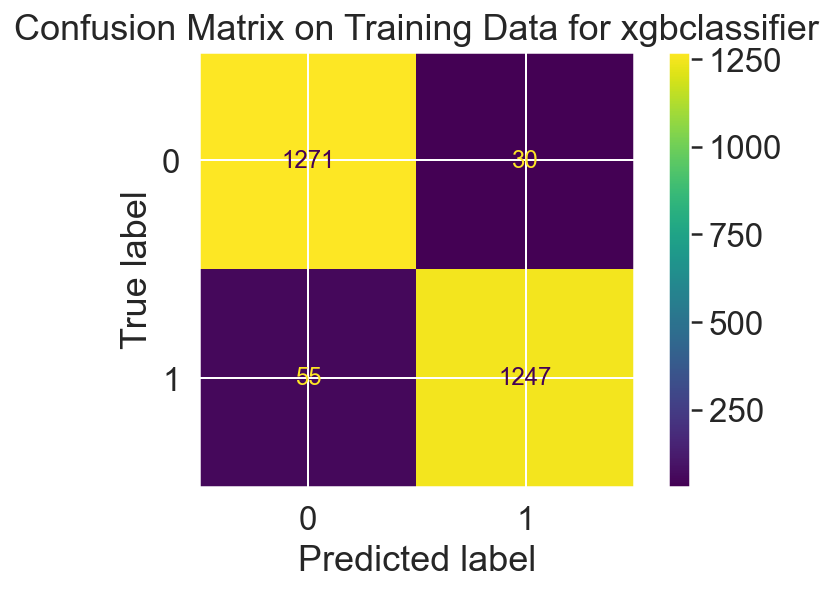

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.93      0.90      0.91       326
           1       0.90      0.93      0.92       325

    accuracy                           0.92       651
   macro avg       0.92      0.92      0.92       651
weighted avg       0.92      0.92      0.92       651



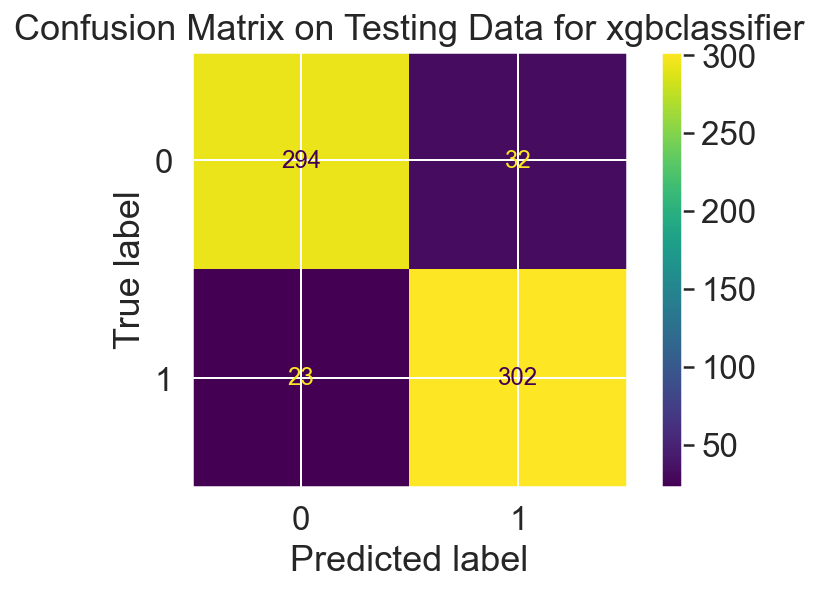

<Figure size 864x864 with 0 Axes>

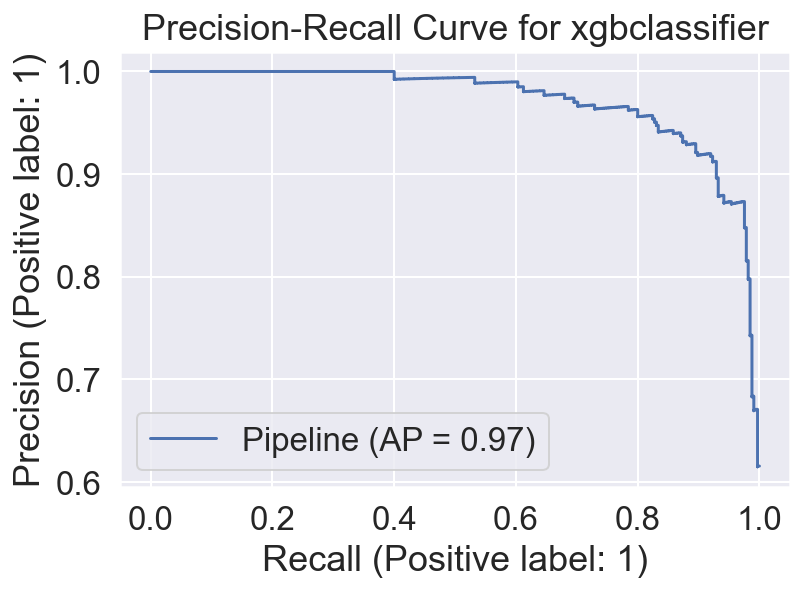

<Figure size 864x864 with 0 Axes>

kneighborsclassifier
Fitting 5 folds for each of 3 candidates, totalling 15 fits
{'Best param': {'kneighborsclassifier__n_neighbors': 10, 'kneighborsclassifier__algorithm': 'kd_tree'}, 'Best estimator': Pipeline(steps=[('nearmiss', NearMiss(version=2)),
                ('kneighborsclassifier',
                 KNeighborsClassifier(algorithm='kd_tree', n_neighbors=10))]), 'Best training score': 0.693436438801122, 'Model': KNeighborsClassifier(), 'Best testing score': 0.64}
Train Result:
              precision    recall  f1-score   support

           0       0.74      0.77      0.75      1301
           1       0.76      0.72      0.74      1302

    accuracy                           0.75      2603
   macro avg       0.75      0.75      0.75      2603
weighted avg       0.75      0.75      0.75      2603



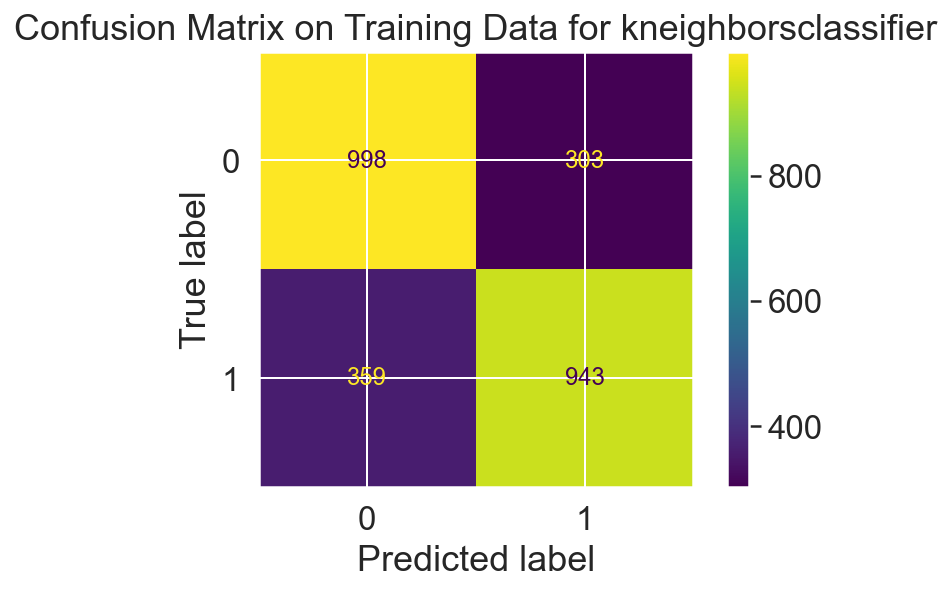

<Figure size 864x864 with 0 Axes>

Test Result:
              precision    recall  f1-score   support

           0       0.68      0.71      0.70       326
           1       0.70      0.66      0.68       325

    accuracy                           0.69       651
   macro avg       0.69      0.69      0.69       651
weighted avg       0.69      0.69      0.69       651



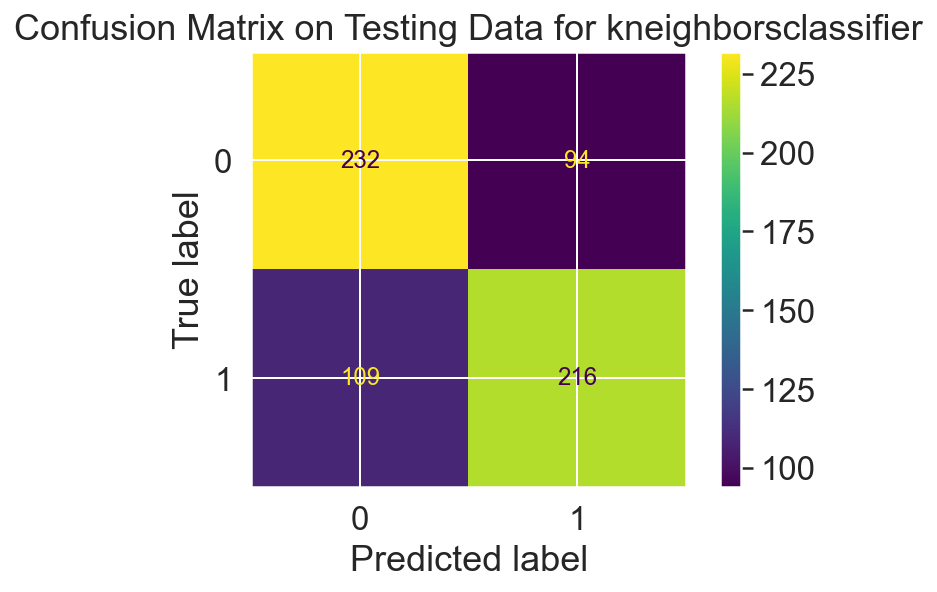

<Figure size 864x864 with 0 Axes>

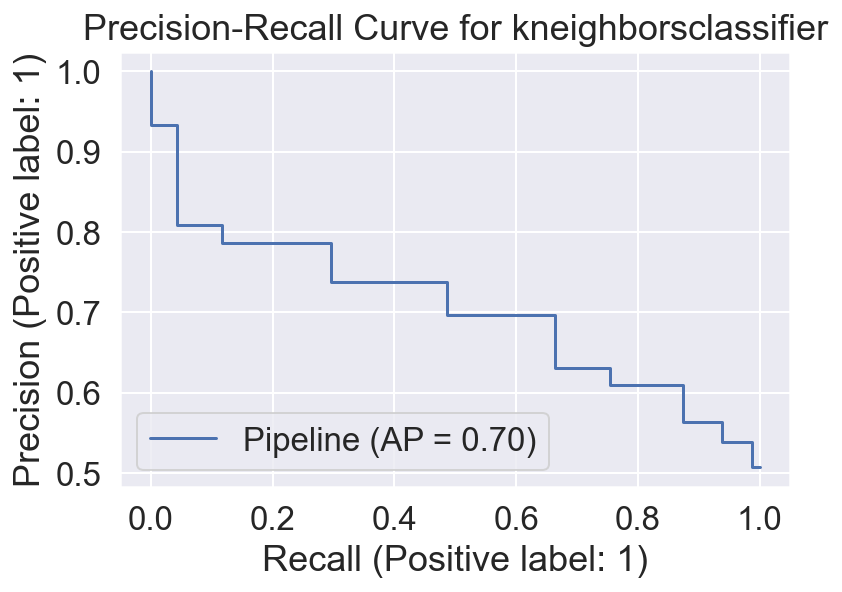

<Figure size 864x864 with 0 Axes>

In [75]:
kf = KFold(n_splits=3, random_state=42, shuffle=True)
model_dict = {}
best_param_model = { i[0] : {} for i in classifiers}
for i, model in zip(list(range(len(classifiers))), classifiers):
    print(model[0])
    imba_pipeline = make_pipeline(NearMiss(version=2), model[1])
    new_params = {model[0] + '__' + key : model[2][key] for key in model[2] }
    grid_imba = RandomizedSearchCV(imba_pipeline,new_params, n_iter=3,random_state=42, verbose=1, n_jobs=-1)
    grid_imba.fit(x_train,y_train)
    
        # To check the features importance in the model
    try:
        importance = grid_imba.best_estimator_._final_estimator.feature_importances_
        importance_dict = dict(zip(x.columns,importance))
        sorted_dict = dict(sorted(importance_dict.items(), key=lambda item: item[1]))
        
        # To find out the features that is unimportant in the model
#         for i,v in zip(x.columns, importance):
        for i, v in sorted_dict.items():
        
            print(f'Feature: {i}, Score: {v}')
        # plot feature importance
        pyplot.bar(list(sorted_dict.keys())[-5:], list(sorted_dict.values())[-5:])
        pyplot.xlabel('Score')
        pyplot.ylabel('Features')
        pyplot.xticks(rotation=90)
        pyplot.show()
        
    except:
        None
    
    model_dict[model[0]] = {'Best param': grid_imba.best_params_,
                           'Best estimator': grid_imba.best_estimator_,
                           'Best training score' : grid_imba.best_score_,
                           'Model': model[1],
                           'Best testing score': recall_score(y_test,grid_imba.predict(x_test))}

    score = {'accuracy' : [],
             'precision' : [],
             'recall' : [],
             'f1' : []
            }
    for train_fold_index,val_fold_index in kf.split(x_train,y_train):
        x_train_fold, y_train_fold = x_train.iloc[train_fold_index], y_train.iloc[train_fold_index]
        x_val_fold, y_val_fold = x_train.iloc[val_fold_index], y_train.iloc[val_fold_index]
        pipeline = model_dict[model[0]]['Best estimator']
        pipeline.fit(x_train_fold,y_train_fold)
        
        y_pred = pipeline.predict(x_val_fold)
        
        score['accuracy'].append(pipeline.score(x_val_fold,y_val_fold))
        score['precision'].append(precision_score(y_val_fold, y_pred))
        score['recall'].append(recall_score(y_val_fold, y_pred))
        score['f1'].append(f1_score(y_val_fold,y_pred))
   
    for key, ls in score.items():
        best_param_model[model[0]][key] = np.mean(ls)
    
    print(model_dict[model[0]])
    train_prediction = model_dict[model[0]]['Best estimator'].predict(x_train)
    test_prediction = model_dict[model[0]]['Best estimator'].predict(x_test)
    print('Train Result:')
    print(classification_report(y_train,train_prediction))
    
    metrics.plot_confusion_matrix(model_dict[model[0]]['Best estimator'],x_train, y_train)
    plt.title('Confusion Matrix on Training Data for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()
    
    print('Test Result:')
    print(classification_report(y_test,test_prediction))
    metrics.plot_confusion_matrix(model_dict[model[0]]['Best estimator'],x_test, y_test)
    plt.title('Confusion Matrix on Testing Data for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()
    
    probs = model_dict[model[0]]['Best estimator'].predict_proba(x_test)[:,1]
    average_precision = metrics.average_precision_score(y_test,probs)
    metrics.plot_precision_recall_curve(model_dict[model[0]]['Best estimator'],x_test,y_test)
    plt.title('Precision-Recall Curve for ' +  model[0])
    plt.figure(figsize=(12,12))
    plt.show()

---
For undersampling, I used NearMiss method and there are 3 types of teachnique, named NearMiss-1, NearMiss-2, and NearMiss-3.

NearMiss-1: Majority class examples with minimum average distance to three closest minority class examples.
NearMiss-2: Majority class examples with minimum average distance to three furthest minority class examples.
NearMiss-3: Majority class examples with minimum distance to each minority class example.

Initially, I think NearMiss-3 will perform the best as it will only keep those majority class examples that are on the decision boundary. Yet, when I tried 3 different techniques, it shows that NearMiss(version=2) performed the best. 

# Model Comparison For Method 3

In [76]:
# To select the best parameter for each model
best = {}
for name, model, param in classifiers:
    grid_cv = GridSearchCV(model,param)
    grid_cv.fit(x_train,y_train)
    y_pred = grid_cv.predict(x_test)
    test_accuracy = accuracy_score(y_test,y_pred)
    best[name] = {'Model': model,'Best Training Score': grid_cv.best_score_, 'Testing Score': test_accuracy,'Best Estimator': grid_cv.best_estimator_}

[22:18:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:18:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:21] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the o

[22:18:24] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:25] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


In [77]:
#To check the result of Grid Search
model_dict = best
pp.pprint(model_dict)

{   'adaboostclassifier': {   'Best Estimator': AdaBoostClassifier(n_estimators=60),
                              'Best Training Score': 0.8974272848073233,
                              'Model': AdaBoostClassifier(),
                              'Testing Score': 0.8740399385560675},
    'kneighborsclassifier': {   'Best Estimator': KNeighborsClassifier(algorithm='ball_tree', n_neighbors=10),
                                'Best Training Score': 0.6938210541857375,
                                'Model': KNeighborsClassifier(),
                                'Testing Score': 0.6820276497695853},
    'logisticregression': {   'Best Estimator': LogisticRegression(C=0.1),
                              'Best Training Score': 0.8136704562232392,
                              'Model': LogisticRegression(),
                              'Testing Score': 0.804915514592934},
    'randomforestclassifier': {   'Best Estimator': RandomForestClassifier(max_depth=4, n_estimators=40),
          

Average Score of logisticregression: 0.8129
Standard Deviation logisticregression : 0.0194
************************************************************
Average Score of randomforestclassifier: 0.8214
Standard Deviation randomforestclassifier : 0.0161
************************************************************
Average Score of adaboostclassifier: 0.8909
Standard Deviation adaboostclassifier : 0.0057
************************************************************
[22:18:29] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[22:18:30] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd li

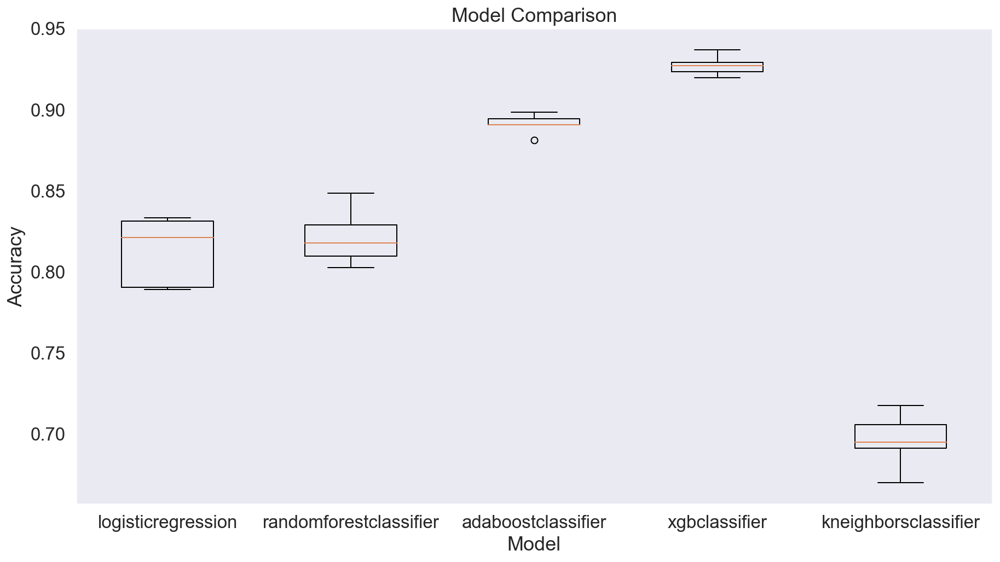

In [78]:
results = {}
from sklearn.model_selection import KFold
for  i, name in list(zip(list(range(len(best))),best.items())):
    kfold = KFold(n_splits=5)
    cv_score = cross_val_score(name[1]['Best Estimator'], x_train,y_train,cv=kfold,scoring='accuracy')
    results[name[0]] = cv_score
    print(f'Average Score of {name[0]}: {cv_score.mean():.4f}')
    print(f'Standard Deviation {name[0]} : {cv_score.std():.4f}')
    print('*' * 60)
pyplot.figure(figsize=(15,8))
pyplot.boxplot(list(results.values()), labels=list(results.keys()))
pyplot.title('Model Comparison')
pyplot.xlabel('Model')
pyplot.ylabel('Accuracy')
pyplot.grid()
pyplot.show()

### Conclusion for method 3:

After comparing different models, it shows that XGBClassifier performs the best. For the performance of the model to predict if the customer is churned, the precision score is 0.90, the recall score is 0.93, the f1-score is 0.92 and the average cross-validation score is 0.92. 

The above scores will be used to compare with other models with different methods so that we can choose the best method for modeling.

# The Best Performing Approach:  Using SMOTE (Oversampling)

After comparing three different modeling methods, it shows that modeling with NearMiss undersampling technique performs the worst. When comparing the other two approaches, it shows that the performance of the model with SMOTE oversamling performs better than the model without sampling technique. 

Therefore, I will take the model with SMOTE oversampling technique for further examination.

# Conclusion for the best performing model:  Modeling Using SMOTE (Oversampling)

As this dataset is highly imbalanced, instead of using ROC Curve, I used Precision-Recall Curve to measure the effectiveness of the models. Apart from AP score, I also looked into the f1 score.

The f1 score is very good which means there is only a few false negatives, the models good at detecting customer churn. It can effectively assist the credit card company to notice those customers and retain them.

XGBClassifier performs the best. incorrectly predicting churned customers is only about 2%